# <span style='color:SteelBlue'> P7 - Implémentez un modèle de scoring - **Analyse exploratoire**

## Description: 
***
L’entreprise souhaite mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc développer un algorithme de classification en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières, etc.).

De plus, les chargés de relation client ont fait remonter le fait que les clients sont de plus en plus demandeurs de transparence vis-à-vis des décisions d’octroi de crédit. Cette demande de transparence des clients va tout à fait dans le sens des valeurs que l’entreprise veut incarner.

Prêt à dépenser décide donc de développer un dashboard interactif pour que les chargés de relation client puissent à la fois expliquer de façon la plus transparente possible les décisions d’octroi de crédit, mais également permettre à leurs clients de disposer de leurs informations personnelles et de les explorer facilement. 

## Mission 
***
Dans cette étude, il s'agit de developper un modèle de scoring de la probablité de défaut de paiement d'un client dans l'optique d'expliquer au client la décision ou non d'accorder un prêt. En effet, pour soutenir cette décision, la societé se basera sur des données provennat d'autres sources d'instituion financières.


## Objectif:
***
L'objectif est : 
- d'analyser le jeu de données dans le but de construire un modèle de scoring qui permettra de donner une prédiction sur la probablité de la capacité de paiement d'un client. 
- Construire un dashbord interactif permettant à la societé assez facilement d'octroyer ou non un crédit. 

## Contrainte: 
***
Pour le projet, il est donc demander d'utiliser un **Kernel Kaggle** dans le but de faire une analyse exploratoire assez rapidement. De ce fait, nous avons choisi le Kernel suivant: 
-  [Kernel Kaggle Rishabh Rao](https://www.kaggle.com/rishabhrao/home-credit-default-risk-extensive-eda) qui a été établi par Rishabh Rao, que nou smodifierons et l'adapterons suivant l'attente de notre projet


In [1]:
## Librairies

In [2]:
# Chargement des librairies
import datetime
import sys
import time
from datetime import datetime
import warnings
#import jyquickhelper
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import outils_data
import eda_kernel_fonctions
# import phik
# Plotly

import plotly
# import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
%matplotlib inline


# Warnings
warnings.filterwarnings('ignore')
plotly.offline.init_notebook_mode(connected=True)

In [3]:
# Les différentes Versions utilisées
print('Version des librairies utilisées :')
#print('jyquickhelper         : ' + jyquickhelper.__version__)
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Outils dataframe      : ' + outils_data.__version__)
print('EDA KERNEL KAGGLE     : ' + eda_kernel_fonctions.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.21.5
Pandas                : 1.4.2
Outils dataframe      : 0.0.4
EDA KERNEL KAGGLE     : 0.0.0
Lancé le           : 2022-06-08T23:02:44.618080


# Chargement des données et observations

In [4]:
# Répertoire de stockages des fichiers mis à notre disposition
path = 'Data/'

# Affichage des différents fichiers et leurs taille dans les données fournies
outils_data.lister_fichiers_repertoire(path)

'11 fichiers présents dans ce répertoire :'

Nom_fichier,Size_en_MB
.ipynb_checkpoints,0.000000
application_test.csv,25.340000
application_train.csv,158.440000
bureau.csv,162.140000
bureau_balance.csv,358.190000
credit_card_balance.csv,404.910000
HomeCredit_columns_description.csv,0.040000
installments_payments.csv,689.620000
POS_CASH_balance.csv,374.510000
previous_application.csv,386.210000


In [5]:
application_train, application_test, bureau, bureau_balance, cc_balance, \
    installments_payments, POS_CASH_balance, previous_application, \
    HomeCredit_columns_description = \
    eda_kernel_fonctions.load_all_tables(path)

Chargement des jeux de donnees...
--------------------------------------------------------------------
Fichier application_train.csv chargé -> dataframe : application_train
Fichier application_test.csv chargé -> dataframe : application_test
Fichier bureau.csv chargé -> dataframe : bureau
Fichier bureau_balance.csv chargé -> dataframe : bureau_balance
Fichier credit_card_balance.csv chargé -> dataframe : cc_balance
Fichier installments_payments.csv chargé -> dataframe : installments_payments
Fichier POS_CASH_balance.csv chargé -> dataframe : POS_CASH_balance
Fichier HomeCredit_columns_description.csv chargé -> dataframe : HomeCredit_columns_description
Fichier previous_application.csv chargé -> dataframe : previous_application
--------------------------------------------------------------------
Chargement des 9 jeux de donnees terminée en 0:00:43.357388 secondes


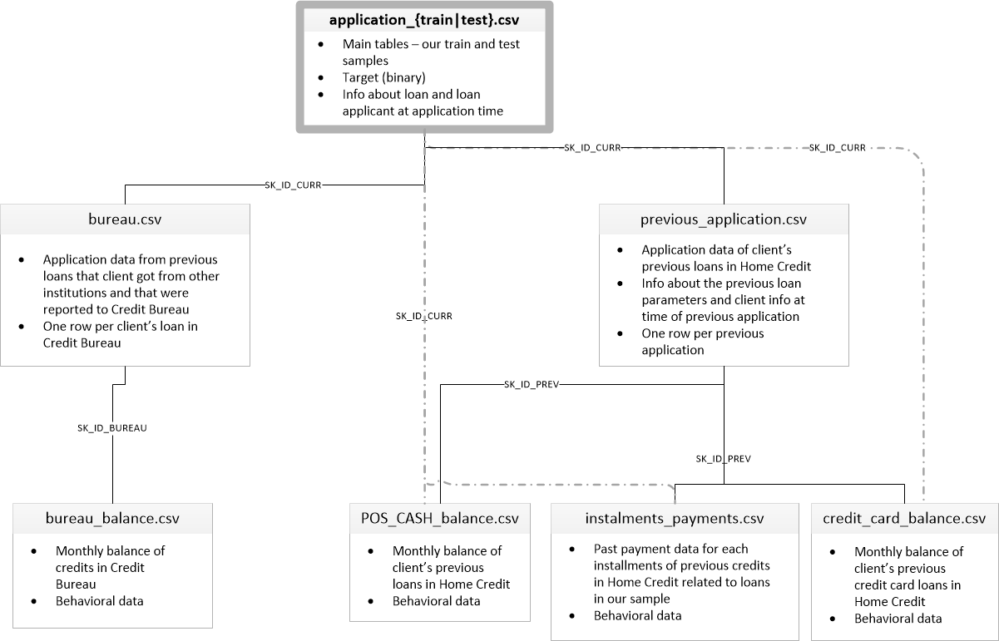

**Description des fichiers**

| Fichier | Description |
| --- | --- |
| <p style='text-align: justify;'>**application_train.csv** <br> **application_test.csv**</p> | <ul style='text-align: justify;'><li>Il s'agit du tableau principal, divisé en deux fichiers pour Train (avec TARGET) et Test (sans TARGET).</li> <li>Données statiques pour toutes les applications.</li><li>Une ligne représente un prêt dans notre échantillon de données.</li></ul> |
|  <p style='text-align: justify;'>**bureau.csv** |  <ul style='text-align: justify;'><li>Tous les crédits précédents du client fournis par d'autres institutions financières qui ont été rapportés au Credit Bureau (pour les clients qui ont un prêt dans notre échantillon). </li> <li> Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans le Credit Bureau avant la date de la demande.</li> |
| <p style='text-align: justify;'>**bureau_balance.csv** | <ul style='text-align: justify;'><li>Soldes mensuels des crédits précédents dans Credit Bureau. </li> <li> Ce tableau a une ligne pour chaque mois d'historique de chaque crédit précédent rapporté au Credit Bureau - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois où nous avons un historique observable pour les crédits précédents) des lignes.</li></ul> |
| <p style='text-align: justify;'>**POS_CASH_balance.csv** | <ul style='text-align: justify;'><li>Instantanés des soldes mensuels des prêts POS (point of sales) et cash précédents que le demandeur a eu avec Home Credit. </li> <li> Ce tableau comporte une ligne pour chaque mois de l'historique de chaque crédit précédent au Home Credit (crédit à la consommation et prêts au comptant) lié aux prêts de notre échantillon - c'est-à-dire que le tableau comporte (# de prêts dans l'échantillon * # de crédits précédents relatifs * # de mois dans lesquels nous avons un historique observable pour les crédits précédents) lignes.</li></ul> |
| <p style='text-align: justify;'>**credit_card_balance.csv** | <ul style='text-align: justify;'><li>Instantanés des soldes mensuels des cartes de crédit précédentes que le demandeur possède chez Home Credit. </li> <li>  Ce tableau comporte une ligne pour chaque mois de l'historique de chaque crédit précédent dans le Home Credit (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau comporte (#prêts dans l'échantillon * # de cartes de crédit précédentes relatives * # de mois où nous avons un historique observable pour la carte de crédit précédente) lignes.</li></ul>|
| <p style='text-align: justify;'>**previous_application.csv** | <ul style='text-align: justify;'><li>Toutes les demandes précédentes de prêts pour le crédit immobilier des clients qui ont des prêts dans notre échantillon. </li> <li> Il y a une ligne pour chaque demande antérieure liée aux prêts dans notre échantillon de données.</li></ul> |
| <p style='text-align: justify;'>**installments_payments.csv** | <ul style='text-align: justify;'><li>Historique des remboursements pour les crédits précédemment déboursés dans Home Credit liés aux prêts de notre échantillon. </li> <li>  Il y a a) une ligne pour chaque paiement qui a été effectué plus b) une ligne pour chaque paiement manqué. Une ligne équivaut à un paiement d'un versement OU à un versement correspondant à un paiement d'un crédit précédent de Home Credit lié aux prêts de notre échantillon.</li></ul> |
| <p style='text-align: justify;'>**HomeCredit_columns_description.csv** | <ul style='text-align: justify;'><li>Ce fichier contient les descriptions des colonnes des différents fichiers de données.</li></ul> |

In [6]:
# Vue d'ensemble des 9 jeux de données
dataframes = [application_train, application_test, bureau, bureau_balance,
              cc_balance, installments_payments, POS_CASH_balance,
              previous_application, HomeCredit_columns_description]
noms = ['application_train', 'application_test', 'bureau', 'bureau_balance',
        'cc_balance', 'installments_payments', 'POS_CASH_balance',
        'previous_application', 'HomeCredit_columns_description']
outils_data.resume_datasets(dataframes, noms)


Les données se décomposent en 9 fichier(s).


Jeu de données,Nb lignes,Nb variables,Nb nan,% nan,Nb var avec nan,Var avec nan
application_train,307511,122,9152465,24.395942,67,"AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, CNT_FAM_MEMBERS, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
application_test,48744,121,1404419,23.811687,64,"AMT_ANNUITY, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
bureau,1716428,17,3939947,13.502552,7,"DAYS_CREDIT_ENDDATE, DAYS_ENDDATE_FACT, AMT_CREDIT_MAX_OVERDUE, AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_LIMIT, AMT_ANNUITY"
bureau_balance,27299925,3,0,0.000000,0,
cc_balance,3840312,23,5877356,6.654074,9,"AMT_DRAWINGS_ATM_CURRENT, AMT_DRAWINGS_OTHER_CURRENT, AMT_DRAWINGS_POS_CURRENT, AMT_INST_MIN_REGULARITY, AMT_PAYMENT_CURRENT, CNT_DRAWINGS_ATM_CURRENT, CNT_DRAWINGS_OTHER_CURRENT, CNT_DRAWINGS_POS_CURRENT, CNT_INSTALMENT_MATURE_CUM"
installments_payments,13605401,8,5810,0.005338,2,"DAYS_ENTRY_PAYMENT, AMT_PAYMENT"
POS_CASH_balance,10001358,8,52158,0.065189,2,"CNT_INSTALMENT, CNT_INSTALMENT_FUTURE"
previous_application,1670214,37,11109336,17.976877,16,"AMT_ANNUITY, AMT_CREDIT, AMT_DOWN_PAYMENT, AMT_GOODS_PRICE, RATE_DOWN_PAYMENT, RATE_INTEREST_PRIMARY, RATE_INTEREST_PRIVILEGED, NAME_TYPE_SUITE, CNT_PAYMENT, PRODUCT_COMBINATION, DAYS_FIRST_DRAWING, DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, DAYS_TERMINATION, NFLAG_INSURED_ON_APPROVAL"
HomeCredit_columns_description,219,4,133,15.182648,1,Special


In [7]:
# Informations groupées: Dimensions, nombres de variibles, ....
# Instanciation d'un dataframe pour mettre toutes les infos de chaque data
InfoGénérales = pd.DataFrame({})

for data in dataframes:
        InfoGénérales = InfoGénérales.append(pd.DataFrame({
            'Données' : [outils_data.namestr(data, globals())],
            'Dimension' : [data.shape],
            'Nombre de variables' : [outils_data.nb_columns(data)],
            'Nombre observations' :   [outils_data.nb_lines(data)],
            'Nombres de types de variables' : [outils_data.count_data_type(data)],
            'Nombre de cellules manquantes' :  [outils_data.missing_cells(data)],
            '% de cellules manquantes' :  [outils_data.missing_cells_percent(data)],
            'Nombre de lignes dupliquées' :  [outils_data.count_duplicates_rows(data)],
            '% de lignes dupliquées' :  [outils_data.count_duplicates_rows_percent(data)]
            
        }), ignore_index=True)
        
InfoGénérales

,Données,Dimension,Nombre de variables,Nombre observations,Nombres de types de variables,Nombre de cellules manquantes,% de cellules manquantes,Nombre de lignes dupliquées,% de lignes dupliquées
0,"[application_train, data]","(307511, 122)",122,307511,float64 65 int64 41 object 16 dtyp...,9152465,0.243959,0,0.0
1,"[application_test, data]","(48744, 121)",121,48744,float64 65 int64 40 object 16 dtyp...,1404419,0.238117,0,0.0
2,"[bureau, data]","(1716428, 17)",17,1716428,float64 8 int64 6 object 3 dtype: ...,3939947,0.135026,0,0.0
3,"[bureau_balance, data]","(27299925, 3)",3,27299925,int64 2 object 1 dtype: int64,0,0.000000,0,0.0
4,"[cc_balance, data]","(3840312, 23)",23,3840312,float64 15 int64 7 object 1 dtyp...,5877356,0.066541,0,0.0
5,"[installments_payments, data]","(13605401, 8)",8,13605401,float64 5 int64 3 dtype: int64,5810,0.000053,0,0.0
6,"[POS_CASH_balance, data]","(10001358, 8)",8,10001358,int64 5 float64 2 object 1 dtype: ...,52158,0.000652,0,0.0
7,"[previous_application, data]","(1670214, 37)",37,1670214,object 16 float64 15 int64 6 dtyp...,11109336,0.179769,0,0.0
8,"[HomeCredit_columns_description, data]","(219, 4)",4,219,object 4 dtype: int64,133,0.151826,0,0.0


# Analyse exploratoire

*Toute la suite est extraite du Kernel Kaggle*

*****
**Processus EDA** 
***

Pour l'analyse des données, nous allons suivre les étapes suivantes :
- Pour chaque table, nous allons d'abord vérifier les **statistiques de base** comme :
    - le nombre d'enregistrements dans les tables, 
    - le nombre de caractéristiques, 
    - le nombre de valeurs NaN, etc.
- Ensuite, nous allons **explorer** certaines des **caractéristiques par rapport à la variable cible** pour chaque table.

Nous utiliserons les graphiques suivants :
- Pour les caractéristiques catégorielles, nous utiliserons principalement des diagrammes à barres et des diagrammes circulaires.
- Pour les caractéristiques continues/numériques, nous utiliserons des Box-Plots, des Probability Density Function ([PDF](https://towardsdatascience.com/what-is-a-probability-density-function-d9b4b8bea121) [PDF](https://towardsdatascience.com/probability-distribution-functions-demystified-a6e882759af3)), des Cumulative Density Function [CDF](https://pub.towardsai.net/pdf-cdf-in-machine-learning-5a10f7abeef6) [CDF](https://sandeepdubey001.medium.com/pdf-probability-density-function-and-cdf-cumulative-distribution-function-a6a48945739e) et des Violin-Plots.

Enfin, nous tirerons des observations de chaque graphique et noterons les idées importantes générées par les graphiques.

***
***Note 1 :*** 
***
- Pour les variables catégorielles, nous allons tracer des Bar Plots et des Pie Plots. L'utilisation des diagrammes en bâtons et en secteurs sera basée sur le nombre de catégories uniques présentes dans une caractéristique. Si une caractéristique a trop de catégories, les afficher sur des Pie Plots peut être encombrant, et les Bar Plots font un meilleur travail pour montrer chaque catégorie. De plus, le diagramme en bâtons sera préféré lorsque les proportions de toutes les catégories sont plus ou moins les mêmes afin d'identifier les petites différences.
- Nous allons suivre la stratégie mentionnée ci-dessous pour tracer les caractéristiques catégorielles dans l'ensemble du cahier :
    - Tout d'abord, nous tracerons la distribution de chaque catégorie dans l'ensemble des données, dans le premier sous-graphe.
    - Ensuite, dans le deuxième sous-graphe, nous tracerons le pourcentage de défaillants de chaque catégorie, c'est-à-dire avec la cible = 1.
    - Par exemple, si une caractéristique contient le sexe, c'est-à-dire Homme et Femme, alors pour le premier sous-graphe, nous tracerons le nombre d'occurrences de chacun de Homme et Femme dans notre ensemble de données. Dans le deuxième sous-graphe, nous tracerons le nombre ou le pourcentage d'hommes par défaut parmi les hommes présents dans l'ensemble de données. Nous ferons de même pour les femmes. Nous procédons ainsi parce qu'il y aura quelques catégories qui seront dominantes par rapport à d'autres, et leurs caractéristiques par défaut ne seront pas identifiables si nous regardons seulement les comptes.
    
***
***Note 2 :*** 
***

Pour l'analyse des variables continues, nous utiliserons quatre types de graphiques selon les besoins : Distplot, CDF, Box-plots et Violin Plots.

- **DistPlots** : Le distplot sera utilisé lorsque nous voudrons voir les PDF de la variable continue. Ces PDF nous aideront à analyser où se trouvent la plupart de nos données.
- **CDF** : Les CDF peuvent être utilisées comme une extension des PDF pour voir quel pourcentage de points se trouve sous une certaine valeur seuil. Cela nous donne une bonne estimation de la distribution de la majorité des données.
- **Box-Plots** : Les diagrammes en boîte sont utiles lorsque nous voulons analyser toute la gamme de valeurs de notre variable continue. Ils montrent les 25ème, 50ème et 75ème percentiles dans un seul graphique. De plus, il donne également des idées sur la présence de valeurs aberrantes dans un ensemble de valeurs donné.
- **Graphiques en violon** : Les Violin-Plots ont tendance à combiner les caractéristiques des Distplots et des Box-Plots. Ils imitent verticalement le box-plot et montrent les quantiles, l'étendue des valeurs, et horizontalement ils montrent le PDF de la variable continue.

## application_train

### Description & statistique

*Description*
***

In [8]:
df_var_appli_train = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'application_{train|test}.csv']
df_var_appli_train.style.hide_index()

Table,Row,Description,Special
application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,nan
application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",nan
application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,nan
application_{train|test}.csv,CODE_GENDER,Gender of the client,nan
application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,nan
application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,nan
application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,nan
application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,nan
application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,nan
application_{train|test}.csv,AMT_ANNUITY,Loan annuity,nan


- Le fichier application_train.csv est constituée de données statiques relatives aux emprunteurs avec des étiquettes. 
- Chaque ligne représente une demande de prêt.

*Statistiques*
***

In [9]:
eda_kernel_fonctions.afficher_stats_basic(application_train)

-------------------------------------------------------------------------------
Le jeu de données contient 307511 lignes et 122 variables.
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans application_train : 0
-------------------------------------------------------------------------------
Contenu des 3 premières lignes :


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object

,Nombre par type de variable,% des types de variable
float64,65,53.280000
int64,41,33.610000
object,16,13.110000


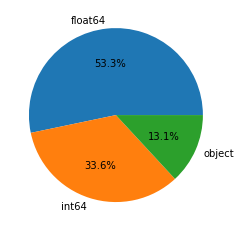

In [10]:
# Types des variables
outils_data.get_types_variables(application_train, True, True, True)

In [11]:
# Résumé des variables
desc_appli_train = outils_data.description_variables(application_train)
desc_appli_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
type,int64,int64,object,object,object,object,int64,float64,float64,float64,float64,object,object,object,object,object,float64,int64,int64,float64,...,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,278.0,1292.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41519.0,41519.0,41519.0,41519.0,41519.0,41519.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000032,0.000741,0.003444,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.110669,0.110669,0.110669,0.110669,0.110669,0.110669
count,307511.0,307511.0,307511,307511,307511,307511,307511.0,307511.0,307511.0,307499.0,307233.0,306219,307511,307511,307511,307511,307511.0,307511.0,307511.0,307511.0,...,307511.0,307511.0,307511.0,307511.0,307511.0,307511.0,307511.0,307511.0,307511.0,307511.0,307511.0,307511.0,307511.0,307511.0,265992.0,265992.0,265992.0,265992.0,265992.0,265992.0
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,NaN,7,8,5,6,6,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,NaN,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,NaN,248526,158774,218391,196432,272868,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,168797.919297,599025.999706,27108.573909,538396.207429,NaN,NaN,NaN,NaN,NaN,0.020868,-16036.995067,63815.045904,-4986.120328,...,0.081376,0.003896,0.000023,0.003912,0.000007,0.003525,0.002936,0.00121,0.009928,0.000267,0.00813,0.000595,0.000507,0.000335,0.006402,0.007,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,237123.146279,402490.776996,14493.737315,369446.46054,NaN,NaN,NaN,NaN,NaN,0.013831,4363.988632,141275.766519,3522.886321,...,0.273412,0.062295,0.004771,0.062424,0.00255,0.059268,0.05411,0.03476,0.099144,0.016327,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.0,0.0,NaN,NaN,NaN,NaN,0.0,25650.0,45000.0,1615.5,40500.0,NaN,NaN,NaN,NaN,NaN,0.00029,-25229.0,-17912.0,-24672.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Notes sur les variables de application_train** :
***
- Le fichier application_train.csv contient environ **307511 enregistrements** et **122 variables**. 
- Ces variables contiennent les **statistiques personnelles d'un demandeur particulier**, telles que son âge, ses revenus, le type de prêt, les statistiques de son appartement, etc.
- Il y a **307000 SK_ID_CURR uniques** qui représentent des demandes de prêt uniques.
- Le champ **TARGET** représente le **statut de défaut de paiement du prêt** :
    - 0 pour non défaillant,
    - et 1 pour défaillant.

*Valeurs manquantes*
***

Valeurs manquantes : 9152465 NaN pour 37516342 données (24.4 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MEDI,214865,69.870000
COMMONAREA_AVG,214865,69.870000
COMMONAREA_MODE,214865,69.870000
NONLIVINGAPARTMENTS_MEDI,213514,69.430000
NONLIVINGAPARTMENTS_MODE,213514,69.430000
NONLIVINGAPARTMENTS_AVG,213514,69.430000
FONDKAPREMONT_MODE,210295,68.390000
LIVINGAPARTMENTS_MODE,210199,68.350000
LIVINGAPARTMENTS_MEDI,210199,68.350000
LIVINGAPARTMENTS_AVG,210199,68.350000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


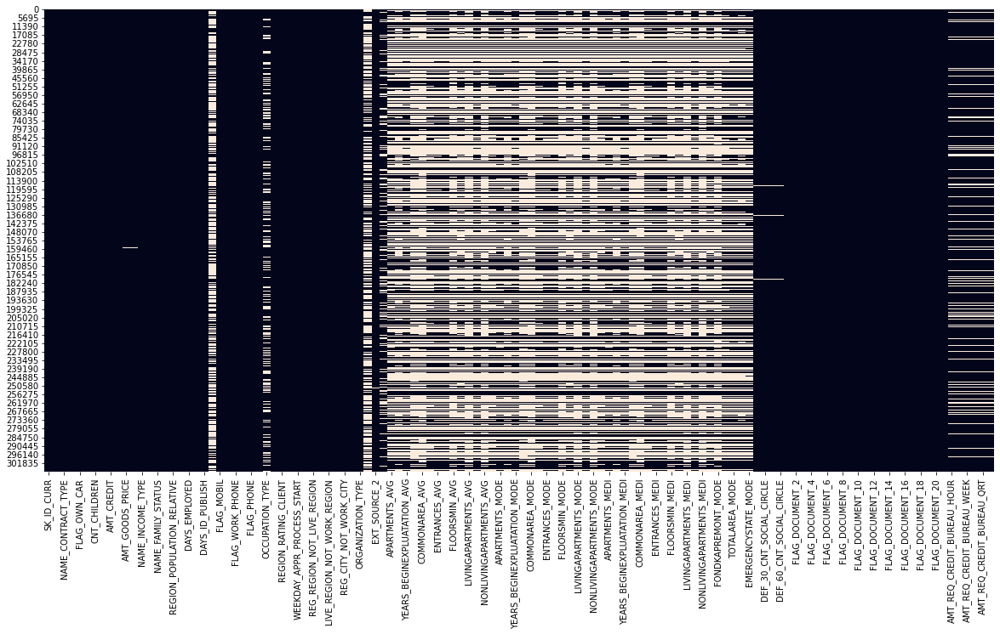

In [12]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(application_train, True, True)

Nombre de variables avec valeurs manquantes : 67


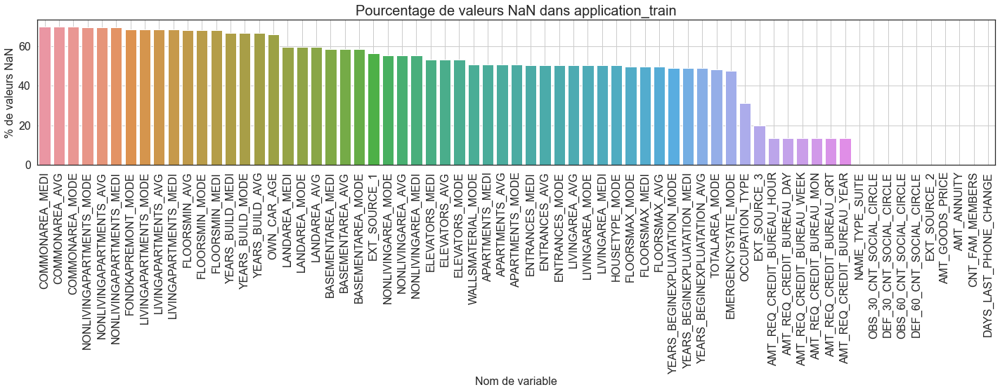

In [13]:
# Réprésentation visuelle des valeurs manquantes
df_nan = eda_kernel_fonctions.nan_df_create(application_train)
eda_kernel_fonctions.plot_nan_percent(df_nan, 'application_train',
                                      grid=True)

**Notes sur les valeurs manquantes** :
***
- On peut voir sur le graphique ci-dessus que 67 variables sur 122 contiennent des valeurs manquantes, ainsi avec un si grand nombre de colonnes de variables manquantes, nous ne pouvons pas les supprimer pour éviter une grande perte d'informations.
- Certaines variables comme  "COMMONAREA", "NONLIVINGAPARTMENT", etc. ont près de 70% de valeurs manquantes: il va falloir mettre en place plusieurs techniques permettant de les remplacer.
- Une autre chose à noter ici est que la plupart des variables qui ont plus de 50% de valeurs manquantes sont liées aux statistiques sur les appartements de l'emprunteur. Il est très probable que ces valeurs n'aient pas été enregistrées lors de la saisie des données et qu'elles soient facultatives.

### Analyse univariée

Notes: Nous allons voir toutes les variables d'application_train une à une en les affichant comme dans les notes en préambule de l'analyse exploratoire: 
***

**Variable de la TARGET**

- Variable cible :
    - 1 : demandeur ayant des difficultés de paiement : il/elle a eu un retard de paiement de plus de X jours sur au moins une des Y premières échéances du prêt dans notre échantillon
    - 0 : tous les autres cas.)
- En résumé :
    - **1** : défaillant.
    - **0** : non-défaillant,
    

In [14]:
target_distribution = application_train.TARGET.value_counts()
labels = ['Non-Defaulter', 'Defaulter']
colors = ["#82E0AA", "#EC7063"]

fig = go.Figure(data=[go.Pie(values=target_distribution, labels=labels,
                             textinfo='percent', pull=[0, 0.04],
                             marker=dict(colors=colors))],
                layout=go.Layout(title='Distribution de la TARGET'))

fig.show()

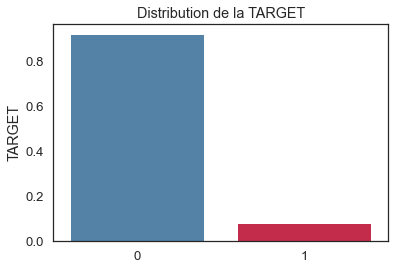

In [15]:
# Distribution de la Target
sns.barplot(x=[0, 1],
            y=application_train['TARGET'].value_counts(normalize=True),
            palette=['SteelBlue', 'crimson'])
plt.title('Distribution de la TARGET')
plt.show()

**Bilan** :
***
- D'après la **distribution de la variable cible** une chose que nous pouvons rapidement remarquer est le **déséquilibre des données**. 
- Il n'y a que 8,07% du total des prêts qui ont été mis en défaut. Cela signifie que les **défaillants** constituent la **classe minoritaire**.
- D'un autre côté, il y a 91,9% de prêts qui n'ont pas été en défaut. Ainsi, les **Non-Défaillants** seront notre **classe majoritaire**.
- Les défaillants se sont vus attribuer une variable cible de 1 et les non-défaillants une variable cible de 0.
- Pour les ensembles de données déséquilibrés, lors de la construction du **modèle**, nous ne pouvons **pas alimenter les données telles quelles à certains algorithmes**, qui sont **sensibles au déséquilibre**.
- Il en va de même pour les mesures de performance. Pour un tel jeu de données, la **précision** n'est généralement **pas la bonne mesure**, car elle est généralement **biaisée en faveur de la classe majoritaire**. Nous pouvons **utiliser d'autres métriques** telles que le **score ROC-AUC**, la **perte logarithmique**, le **score F1**, **la matrice de confusion** pour une meilleure évaluation du modèle.
- Une autre chose importante à noter ici est qu'il y a très peu de personnes qui font réellement défaut, et elles ont tendance à montrer une sorte de comportement différent. Ainsi, dans de tels cas de détection de fraude, de défaut de paiement et de détection d'anomalie, nous devons également nous concentrer sur les **valeurs aberrantes**, et nous ne pouvons **pas les supprimer**, car elles pourraient être le **facteur de différenciation entre les personnes en défaut de paiement et celles qui ne le sont pas**.

***
**Distribution des variables catégorielles**
***

In [16]:
# Liste des variables qualitatives
cols_cat = \
    application_train.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

**Variable NAME_CONTRACT_TYPE**

- Cette variable contient des informations sur le type de prêt pour le demandeur donné :
    - prêt cash,
    - ou prêt revolving. 
- Selon la documentation fournie par Home Credit, il existe deux types de prêts, à savoir les prêts renouvelables et les prêts en espèces.

In [17]:
# Let us first see the unique categories of 'NAME_CONTRACT_TYPE'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'NAME_CONTRACT_TYPE')

# Plotting the Pie Plot for the column
eda_kernel_fonctions.plot_categorical_variables_pie(application_train,
                                                    'NAME_CONTRACT_TYPE',
                                                    hole=0.5)
# Note : en survol sur la répartition des défaillants seuls : 
# c'est le pourcentage des défaillants par catégorie sur le nombre total
# de cette catégorie.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_CONTRACT_TYPE' sont :
['Cash loans' 'Revolving loans']
-------------------------------------------------------------------------------


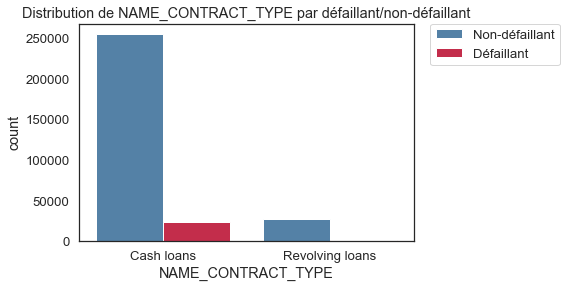

In [18]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train, 'NAME_CONTRACT_TYPE')

**Notes sur la varaible NAME_CONTRACT_TYPE** :
***
A partir du graphique ci-dessus, nous pouvons tirer les observations et conclusions suivantes :
- A partir du premier sous-graphe, c'est-à-dire la distribution globale : 
    - On peut voir que la plupart des prêts que les demandeurs prennent sont des prêts cash. 
    - Seulement 9,52% des personnes ont contracté des prêts revolving.
- Dans le deuxième sous-graphe, c'est-à-dire le pourcentage de défaillants :
    - Nous voyons qu'il y a un plus grand pourcentage de personnes qui ont fait défaut de paiement avec des prêts cash (8,35%) par rapport aux personnes qui ont fait défaut de paiement  avec des prêts revolving (5,48%).

**Variable CODE_GENDER**

- Cette variable contient des informations sur le sexe du client/demandeur :
    - **F** pour **Féminin**,
    - **M** pour **Masculin**. 

In [19]:
# Let us first see the unique categories of 'CODE_GENDER'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'CODE_GENDER',
                                             show_counts=True)

# Plotting the Pie Plot for the Column
eda_kernel_fonctions.plot_categorical_variables_pie(application_train,
                                                    'CODE_GENDER',
                                                    hole=0.5)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CODE_GENDER' sont :
['M' 'F' 'XNA']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
-------------------------------------------------------------------------------


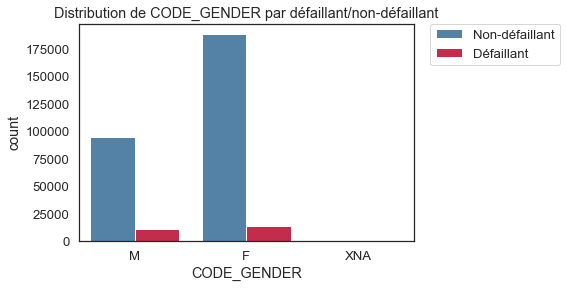

In [20]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'CODE_GENDER')

**Bilan** :
***
La distribution de la variable CODE_GENDER semble intéressante. 

Voici quelques points de discussion :

- 1. Le premier point à observer est qu'il y a 4 lignes dans la table application_train qui ont des genres 'XNA', ce qui n'a pas beaucoup de sens, et peut être compté comme des valeurs NaN. Puisqu'elles ne sont que 4 et qu'elles appartiennent à la catégorie des non-défaillants. Nous pouvons donc éliminer ces lignes sans trop d'hésitation.
- 2. Dans le sous-graphe 1, nous voyons que pour l'ensemble de données donné, il y a plus de candidats féminins (65,8%) que de candidats masculins (34,2%).
- 3. Cependant, contrairement au nombre de candidats féminins, le deuxième graphique montre que les candidats masculins ont tendance à être plus souvent défaillants (10,14%) que les candidats féminins (7%).

Ainsi, on peut dire que les hommes ont plus tendance à ne pas rembourser leurs dettes que les femmes, selon l'ensemble des données. Il faudrait vérifier avec un test de student pour voir si la différence est significative.

**Variable FLAG_EMP_PHONE**

Cette variable est une variable booléenne, qui indique si le demandeur a fourni son numéro de téléphone professionnel ou non :
- **1** pour **Oui**, 
- et **0** signifie **Non**.

In [21]:
# Let us first see the unique categories of 'FLAG_EMP_PHONE'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'FLAG_EMP_PHONE')

# Plotting the Pie Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_pie(application_train,
                                   column_name='FLAG_EMP_PHONE',
                                   hole=0.5)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'FLAG_EMP_PHONE' sont :
[1 0]
-------------------------------------------------------------------------------


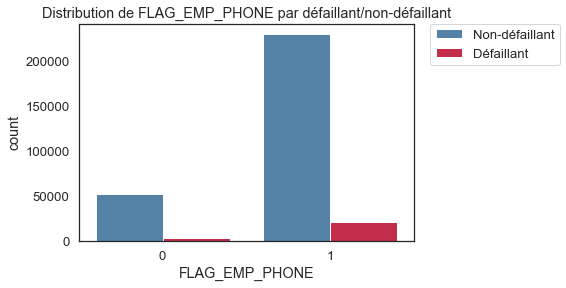

In [22]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_EMP_PHONE')

**Bilan** :
***
Cette variable contient deux catégories, à savoir si le demandeur a fourni ou non son numéro de téléphone professionnel lors du processus d'inscription/demande.

- Dans le premier sous-graphe, nous constatons que la plupart des demandeurs fournissent leur numéro de téléphone professionnel (82%) et que seulement 18% ne l'ont pas fourni.
- On peut également constater que la tendance des personnes en défaillance de paiement qui fournissent leur numéro de téléphone professionnel est plus importante que ceux qui ne sont pas défaillant. Cette caractéristique pourrait être attribuée au fait que les personnes en défaut de paiement fournissent leur numéro de téléphone professionnel afin de ne pas être dérangées sur leur téléphone personnel.

**Variable REGION_RATING_CLIENT_W_CITY**

- Notre évaluation de la région où vit le demandeur en tenant compte de la ville (1 ou 2 ou 3).
- Cette variable correspond à la note attribuée par le Crédit immobilier à la région de chaque demandeur sur la base des enquêtes qu'il a pu réaliser. Cette notation tient également compte de la ville dans laquelle vit le demandeur.
- La prise en compte de la ville est importante, car même si certaines régions ont une bonne note dans une ville particulière, mais que cette ville n'a pas une note élevée, le demandeur se verra attribuer une note moyenne et non une note élevée.
- Les notes sont comprises entre 1 et 3.

In [23]:
# Let us first see the unique categories of 'REGION_RATING_CLIENT_W_CITY'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'REGION_RATING_CLIENT_W_CITY')

# Plotting the Pie Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_pie(application_train,
                                   column_name='REGION_RATING_CLIENT_W_CITY')

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'REGION_RATING_CLIENT_W_CITY' sont :
[2 1 3]
-------------------------------------------------------------------------------


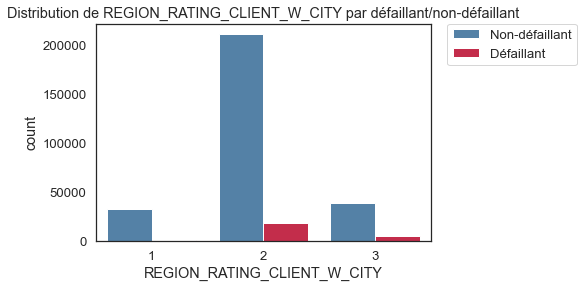

In [24]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'REGION_RATING_CLIENT_W_CITY')

**Bilan** :
***
Les graphiques ci-dessus nous permettent de tirer les conclusions suivantes :

- Dans le premier sous-graphe, nous constatons que :
    - la plupart des demandeur (74,6 %) ont un indice de région de 2. Il s'agit de la valeur moyenne qui correspond à la plupart des demandeurs.
    - très peu de demandeurs ont un classement régional de 1 (seulement 11,1%) et certains ont un classement de 3 (14,3%).
- Parmi les défaillants, on constate que :
    - la plupart d'entre eux ont un classement régional de 3 (11,4% cf survol sur le schéma, pourcentage parmi les notes de chaque catégorie), ce qui est comparativement plus élevé que les deux autres classements, c'est-à-dire que les demandeurs ayant un classement de 1 ont un pourcentage de défaillance de seulement 4,84% (cf survol) et ceux ayant un classement de 2 ont un pourcentage de 7,92% (cf survol).
    
Cela montre que la note 3 pourrait être un attribut important pour prendre une décision sur les caractéristiques de défaillance.

**Variable NAME_EDUCATION_TYPE**

Cette variable décrit/énumére le niveau d'éducation le plus élevée obtenu par le demandeur.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_EDUCATION_TYPE' sont :
['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_EDUCATION_TYPE = 5


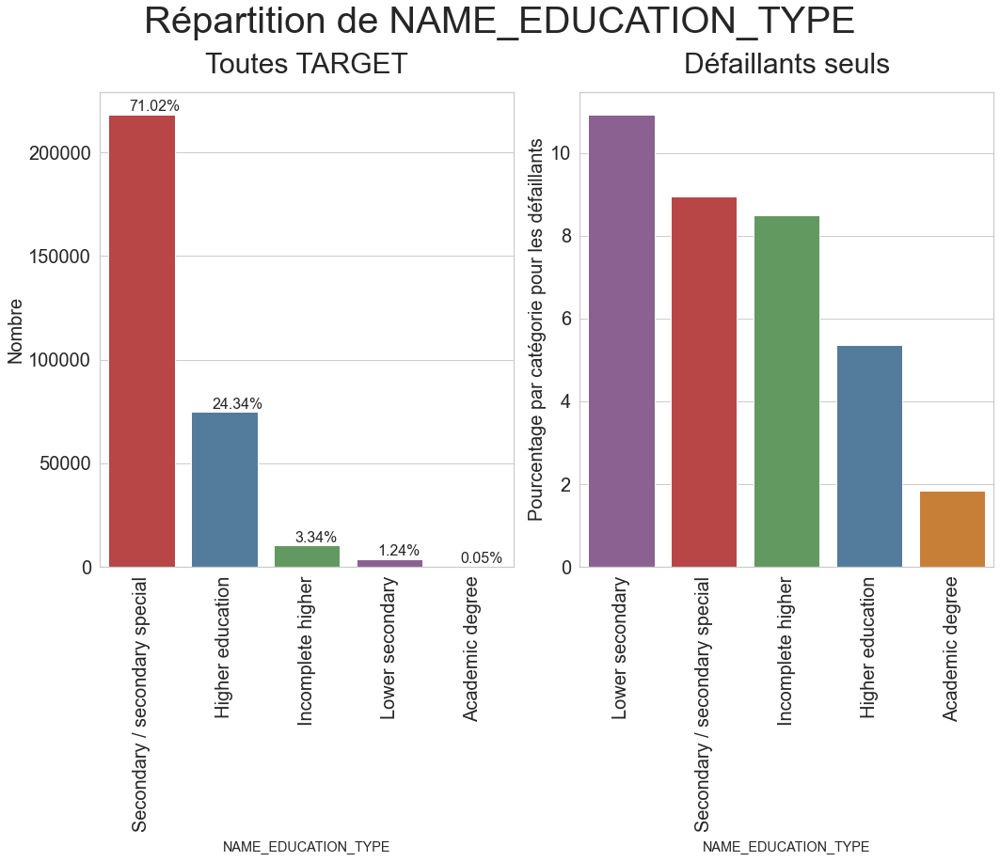

In [25]:
# Let us first see the unique categories of 'NAME_EDUCATION_TYPE'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'NAME_EDUCATION_TYPE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_EDUCATION_TYPE',
                                   figsize=(15, 13), rotation=90,
                                   horizontal_adjust=0.25,
                                   fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20'],
                                   palette2=['#905998', '#cb3335',
                                             '#59a257', '#477ca8',
                                             '#df7f20'])

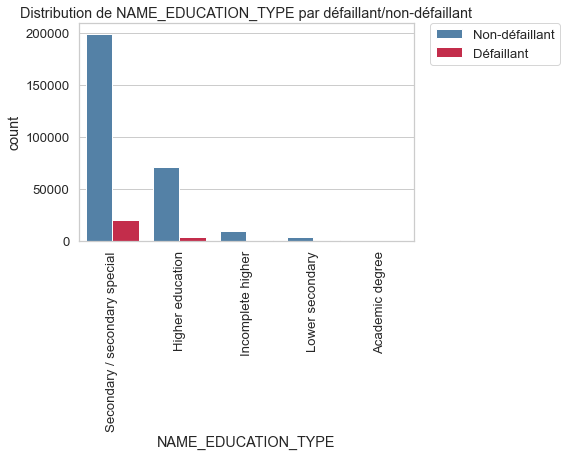

In [26]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_EDUCATION_TYPE',
                                              rotation=90)

**Bilan** :
***
En regardant les graphiques ci-dessus, nous pouvons conclure ce qui suit :

- Environ 71% des personnes n'ont fait que des études secondaires ou des études secondaires spéciales et 24,34% des demandeurs ont fait des études supérieures. Cela suggère que la plupart des demandeurs/emprunteurs n'ont pas un niveau d'éducation élevé.
- Le deuxième graphique montre que :
    - les personnes qui ont fait leurs études jusqu'au premier cycle du secondaire seulement, ont les taux de défaillance les plus élevés, les études dans le cycle secondaire et dans le cycle supérieur incomplet ayant des tendances similaires.
    - Le groupe des personnes ayant fait des études supérieures a une tendance à la défaillance comparativement plus faible, ce qui est aussi logique.
    - De même, les personnes titulaires d'un diplôme universitaire présentent le taux de défaillance le plus faible. Cependant, le groupe des titulaires d'un diplôme universitaire est très peu nombreux, ce qui peut ne pas être très utile.

**Variable OCCUPATION_TYPE**

- Cette variable indique la catégorie socio-professionnelle du demandeur. 
- Il peut s'agir d'une variable très importante qui pourrait décrire les variables de défaillance d'un demandeur. 

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'OCCUPATION_TYPE' sont :
['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers'
 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries'
 'IT staff' 'HR staff']
-------------------------------------------------------------------------------
Nombre de catégories uniques pour OCCUPATION_TYPE = 19


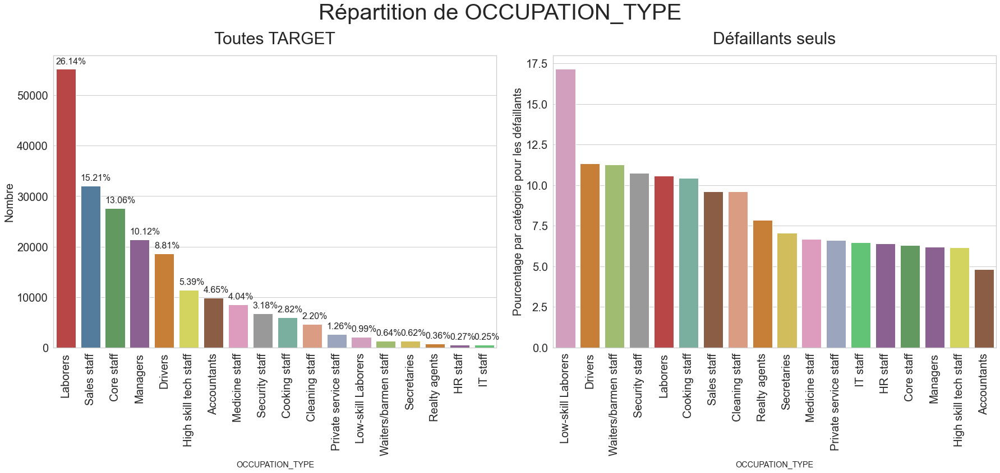

In [27]:
# Let us first see the unique categories of 'OCCUPATION_TYPE'
eda_kernel_fonctions.print_unique_categories(application_train,
                                             'OCCUPATION_TYPE')

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='OCCUPATION_TYPE',
                                   figsize=(25, 12), rotation=90,
                                   fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675', '#95a3c3',
                                             '#db96c0', '#a2c865',
                                             '#e5c949', '#df7f20',
                                             '#905998', '#52d26c'],
                                   palette2=['#db96c0', '#df7f20',
                                             '#a2c865', '#999999',
                                             '#cb3335', '#72b6a1',
                                             '#965a38', '#e99675',
                                             '#df7f20', '#e5c949',
                                             '#e890be', '#95a3c3',
                                             '#52d26c', '#905998',
                                             '#59a257', '#905998',
                                             '#e6e64c', '#965a38'])

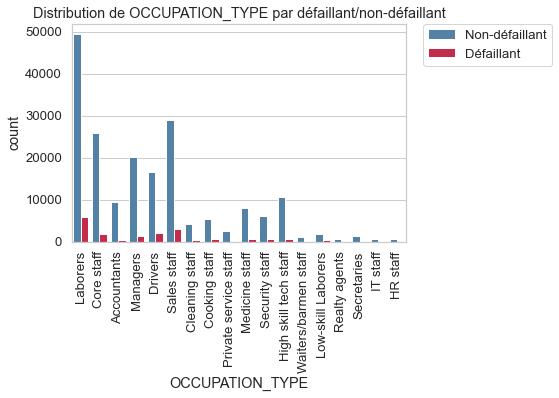

In [28]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'OCCUPATION_TYPE',
                                              rotation=90)

**Bilan** :
***
À partir des graphiques sur la catégorie socio-professionnelle, nous pouvons tirer les observations suivantes :

 - Parmi les demandeurs, la catégorie socio-professionnelle la plus courante est celle des ouvriers, qui représente près de 26 % des demandes. - La deuxième profession la plus fréquente est celle des responsables de vente, suivie par le personnel administratif publique et exécutif et les managers.
- Le taux de défaillance des travailleurs peu qualifiés est le plus élevé de tous les catégories (~17,5 %). Viennent ensuite les chauffeurs, les serveurs, le personnel de sécurité, les ouvriers, le personnel de cuisine, etc. Tous ces emplois sont des emplois de bas niveau. Cela montre que les personnes occupant des emplois de bas niveau ont tendance à avoir un taux de défaillance plus élevé.
- Le taux de défaillance le plus faible se trouve parmi les comptables, le personnel administratif et exécutif publique, les gestionnaires, le personnel technique hautement qualifié, le personnel des RH, etc. qui sont des emplois de niveau moyen à élevé.
- On peut donc conclure que les travailleurs des emplois de bas niveau ont tendance à avoir un taux de défaillance plus élevé que ceux des emplois de niveau moyen à élevé.

**Variable ORGANIZATION_TYPE**

- Tout comme la catégorie socio-professionnelle, le secteur d'activité auquel le demandeur appartient pourrait également être une caractéristique importante pour prédire le risque de défaillance de ce demandeur.

Nombre de catégorie de la variable ORGANIZATION_TYPE = 58


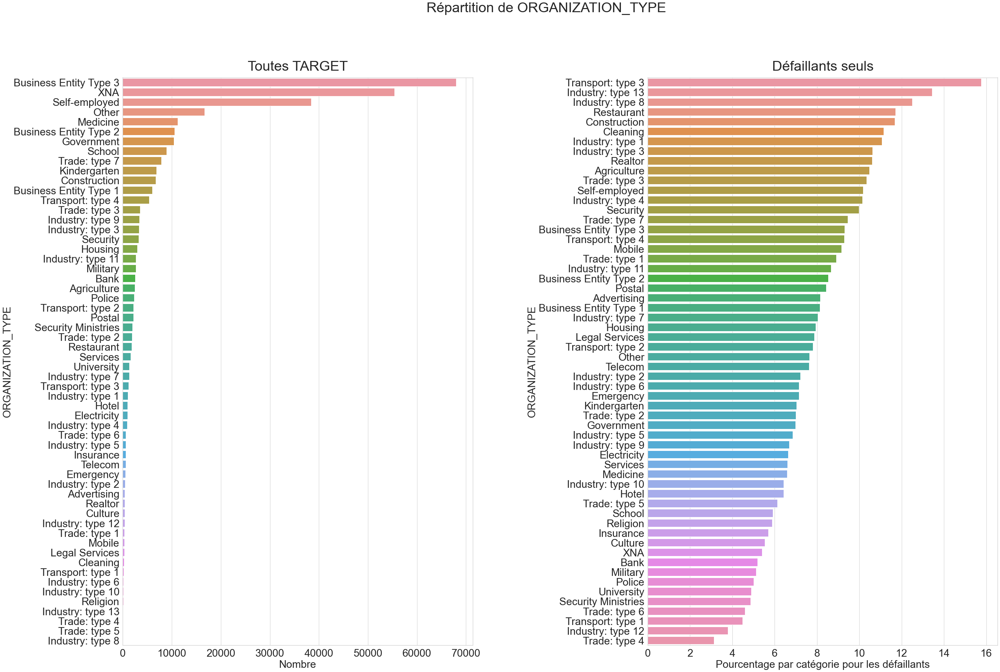

In [29]:
print(f"Nombre de catégorie de la variable ORGANIZATION_TYPE = \
{len(application_train.ORGANIZATION_TYPE.unique())}")

plt.figure(figsize=(45, 30))
sns.set(style='whitegrid', font_scale=1.2)
plt.subplots_adjust(wspace=0.5)

plt.subplot(1, 2, 1)
count_organization = application_train.ORGANIZATION_TYPE.value_counts() \
    .sort_values(ascending=False)
sns.barplot(x=count_organization, y=count_organization.index)
plt.title('Toutes TARGET', pad=20, fontsize=40)
plt.xlabel('Nombre', fontsize=30)
plt.ylabel('ORGANIZATION_TYPE', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(1, 2, 2)
percentage_default_per_organization = \
    application_train[application_train.TARGET == 1].ORGANIZATION_TYPE. \
    value_counts() * 100 / count_organization
percentage_default_per_organization = \
    percentage_default_per_organization.dropna(). \
    sort_values(ascending=False)
sns.barplot(x=percentage_default_per_organization,
            y=percentage_default_per_organization.index)
plt.title('Défaillants seuls', pad=20, fontsize=40)
plt.xlabel('Pourcentage par catégorie pour les défaillants', fontsize=30)
plt.ylabel('ORGANIZATION_TYPE', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.suptitle(f'Répartition de ORGANIZATION_TYPE', fontsize=40)
plt.show()

**Bilan** :
***
Le demandeur appartient à un grand nombre de types d'organisations, 58 pour être précis. 

Les graphiques ci-dessus donnent les observations suivantes :

- 1. Le premier graphique montre que la plupart des demandeurs travaillent dans des organisations de type "entité commercialy Type3", "XNA" ou "Travailleurs indépendants". Le type d'organisation "XNA" pourrait probablement désigner une organisation non classée en TYPE.
- 2. Dans le deuxième graphique, nous remarquons que les candidats appartenant à "Transport : type 3" ont la plus forte tendance à la défaillance par rapport aux autres. Ils sont suivis par les organisations de type : "Industrie : type 13", "Industrie : type 8", "Restaurant", "Construction"...
- Les organisations qui affichent les taux de défaillance les plus bas sont "Commerce : type 4", "Industrie : type 12"...

Ces numéros de type pourraient également en dire plus sur l'organisation, cependant, nous n'avons pas d'informations à ce sujet, donc nous nous en tiendrons à la dénomination qui nous a été fournie.

**Variables REG_CITY_NOT_LIVE_CITY - REG_CITY_NOT_WORK_CITY - LIVE_CITY_NOT_WORK_CITY**

- **REG_CITY_NOT_LIVE_CITY** et **REG_CITY_NOT_WORK_CITY** : ces variables comprennent des indicateurs informant si l'adresse permanente du demandeur correspond ou non à son adresse de contact pour la demande de prêt ou à son adresse professionnelle au niveau de la région.
    - **1** pour des **adresses différentes**,
    - **0** pour des **adresses identiques**.    
- **LIVE_CITY_NOT_WORK_CITY** : cette variable indique si l'adresse permanente du demandeur correspond ou non à son adresse de contact donnée pour la demande de prêt au niveau de la ville.
    - **1** pour des **adresses différentes**,
    - **0** pour des **adresses identiques**.    

Nombre de catégories uniques pour REG_CITY_NOT_LIVE_CITY = 2


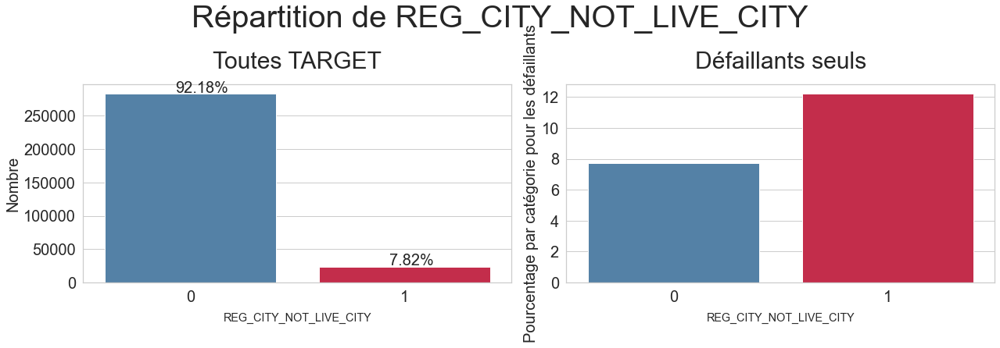

-------------------------------------------------------------------------------
Nombre de catégories uniques pour REG_CITY_NOT_WORK_CITY = 2


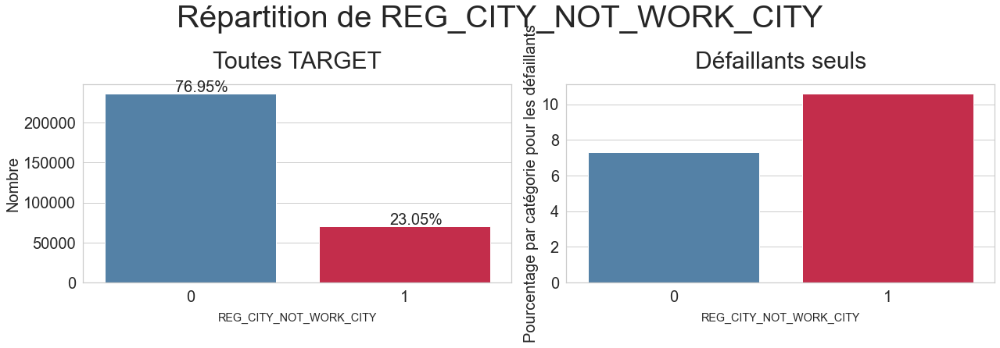

-------------------------------------------------------------------------------
Nombre de catégories uniques pour LIVE_CITY_NOT_WORK_CITY = 2


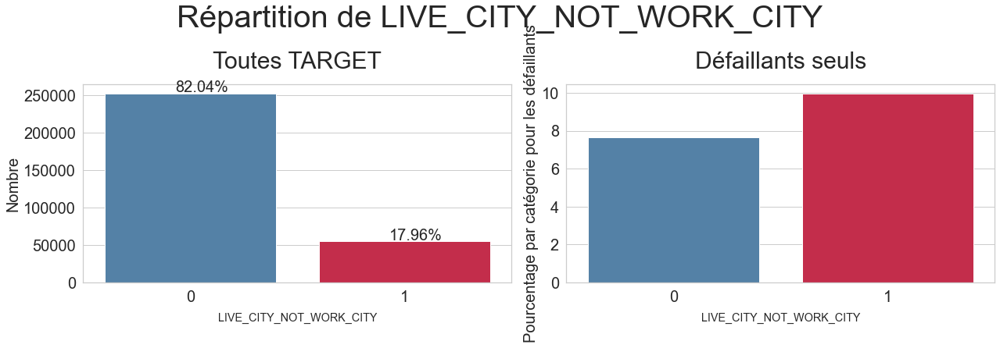

In [30]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='REG_CITY_NOT_LIVE_CITY',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])
print('-'*79)
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='REG_CITY_NOT_WORK_CITY',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])
print('-'*79)
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='LIVE_CITY_NOT_WORK_CITY',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

**Bilan** :
***
Les trois graphiques ci-dessus permettent de tirer les conclusions suivantes :

- 1.Parmi tous les demandeurs, il n'y a qu'une minorité de demandeurs dont les adresses ne correspondent pas.
    - Seulement 7,52% des personnes ont une adresse permanente différente de leur adresse de contact au niveau régional.
    - Environ 23,05% de personnes ont une adresse permanente différente de leur adresse professionnelle au niveau régional. Ce chiffre plus élevé s'explique par le fait qu'il est possible qu'elles travaillent dans une région différente de celle de leur adresse permanente.
    - Environ 17,96 % des personnes ont une adresse permanente différente de leur adresse de contact au niveau de la ville.
- 2. Si nous examinons les caractéristiques de défaillance, nous constatons que la tendance à la défaillance est maximale chez les personnes dont l'adresse permanente et l'adresse de contact sont différentes au niveau de la région, suivie de l'adresse permanente et de l'adresse de travail différentes et enfin de l'adresse permanente et de l'adresse de contact différentes au niveau de la ville.

Dans tous les cas, on constate que la tendance au défaut de paiement des personnes ayant des adresses différentes est plus élevée que celle des personnes ayant la même adresse. Cela signifie que quelque part, cette différence d'adresse peut suggérer un risque de défaillance.

**Variable FLAG_DOCUMENT_3**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_3 = 2


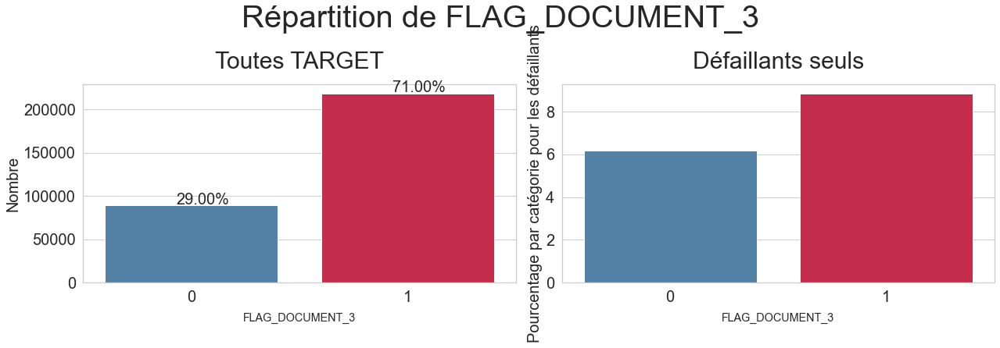

In [31]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_3',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [32]:
application_train[['FLAG_DOCUMENT_3', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_3  TARGET
1                0         199028
0                0          83658
1                1          19312
0                1           5513
dtype: int64

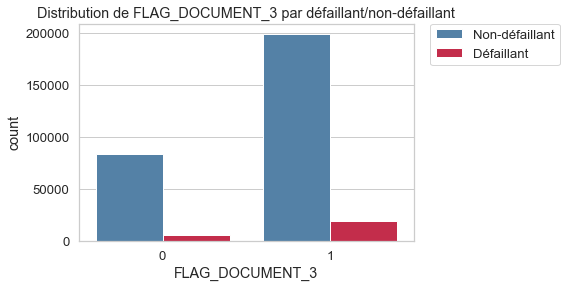

In [33]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_3')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la plupart des demandeurs n'ont pas fourni ce document (~71%) et que seulement 29% l'ont fait.
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni. Cela signifie que les demandeurs qui ont fourni le Document_3 ont tendance à manquer à leurs engagements plus que ceux qui ne l'ont pas fait.
- Il pourrait peut-être s'agir d'un certificat BPL ou autre, mais nous n'avons pas reçu cette information et nous ne pouvons donc rien dire sur le type de ce document.

**Variable FLAG_DOCUMENT_2**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_2 = 2


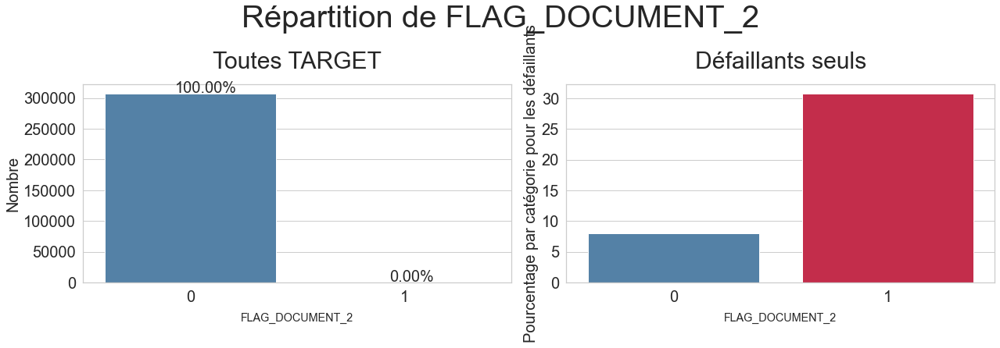

In [34]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_2',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [35]:
application_train[['FLAG_DOCUMENT_2', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_2  TARGET
0                0         282677
                 1          24821
1                0              9
                 1              4
dtype: int64

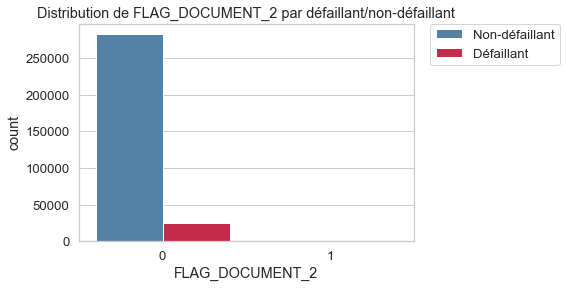

In [36]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_2')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~100%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni. Cela signifie que les demandeurs qui n'ont pas fourni le Document_2 ont tendance à manquer à leurs engagements plus que ceux qui ne l'ont pas fait.

**Variable FLAG_DOCUMENT_4**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_4 = 2


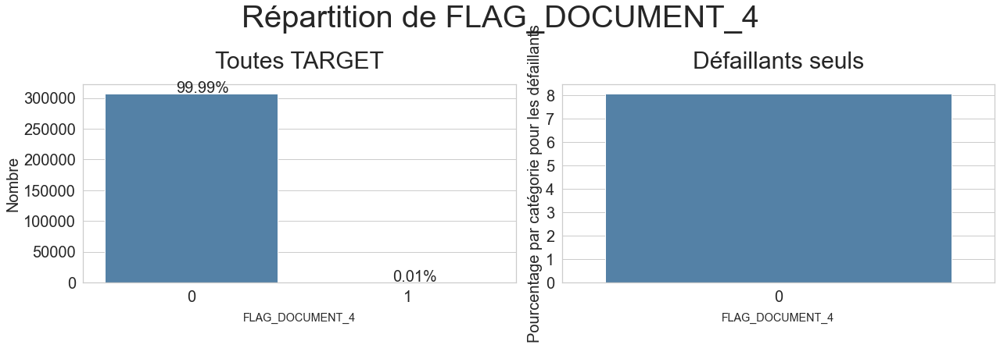

In [37]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_4',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [38]:
application_train[['FLAG_DOCUMENT_4', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_4  TARGET
0                0         282661
                 1          24825
1                0             25
dtype: int64

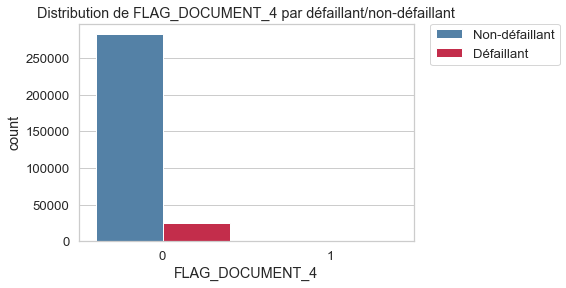

In [39]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_4')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~100%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui n'ont pas fourni ce document ont un taux de défaillance moins élevé que ceux qui l'ont fourni.

**Variable FLAG_DOCUMENT_5**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_5 = 2


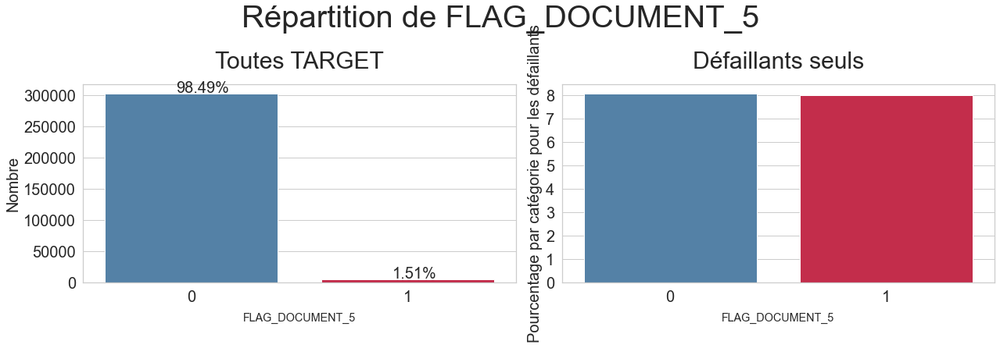

In [40]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_5',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [41]:
application_train[['FLAG_DOCUMENT_5', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_5  TARGET
0                0         278410
                 1          24453
1                0           4276
                 1            372
dtype: int64

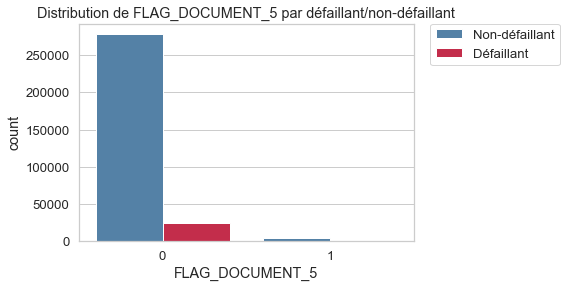

In [42]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_5')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~98.5%).
- Dans le deuxième sous-graphe, nous constatons qu'il n'y a pas de différence entre ceux qui ont fourni ce document et ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_6**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_6 = 2


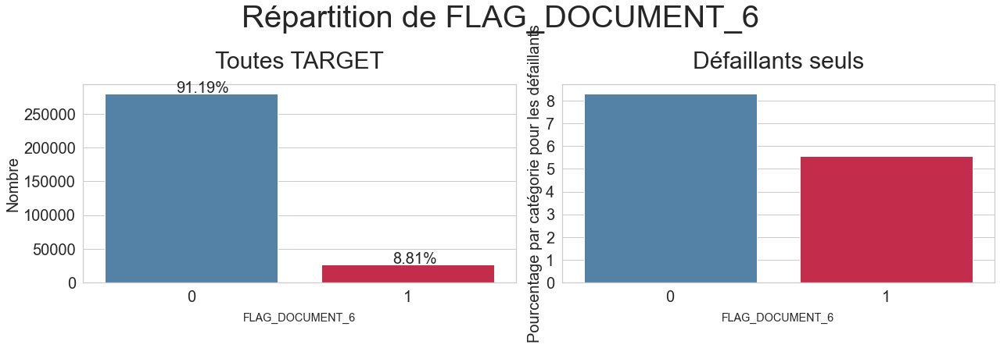

In [43]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_6',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [44]:
application_train[['FLAG_DOCUMENT_6', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_6  TARGET
0                0         257115
1                0          25571
0                1          23318
1                1           1507
dtype: int64

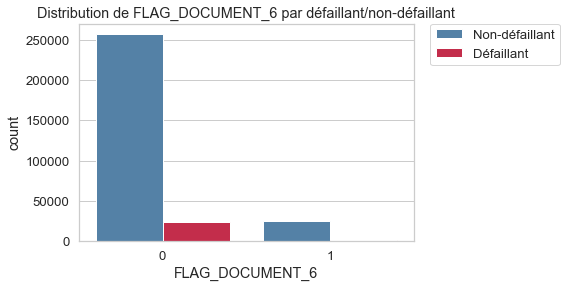

In [45]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_6')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~91%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_7**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_7 = 2


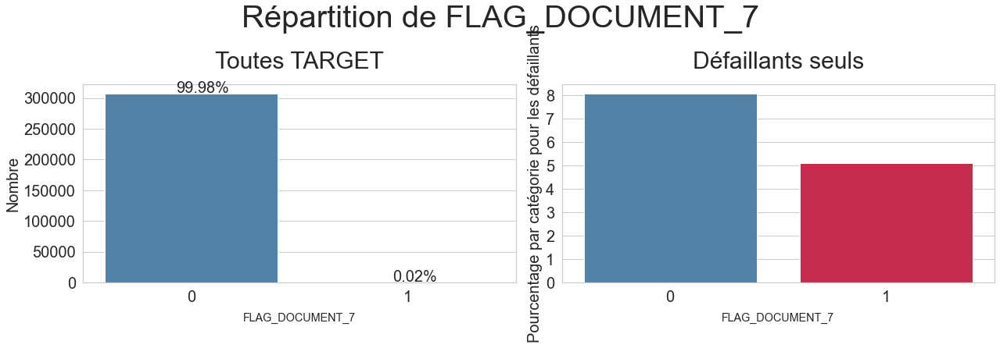

In [46]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_7',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [47]:
application_train[['FLAG_DOCUMENT_7', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_7  TARGET
0                0         282630
                 1          24822
1                0             56
                 1              3
dtype: int64

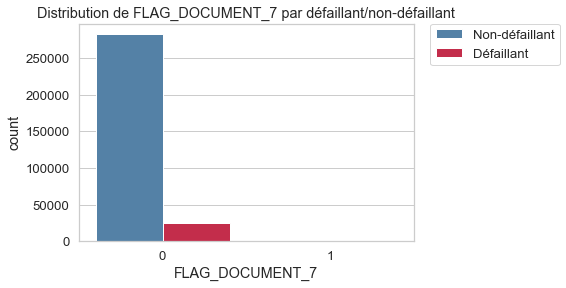

In [48]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_7')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_8**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_8 = 2


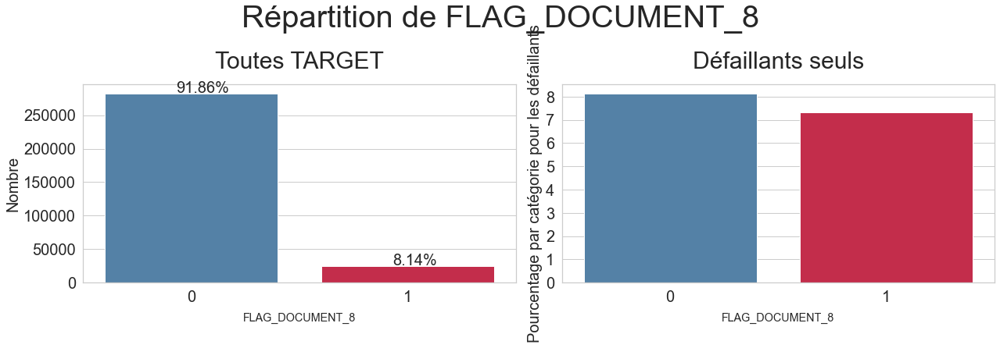

In [49]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_8',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [50]:
application_train[['FLAG_DOCUMENT_8', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_8  TARGET
0                0         259498
1                0          23188
0                1          22989
1                1           1836
dtype: int64

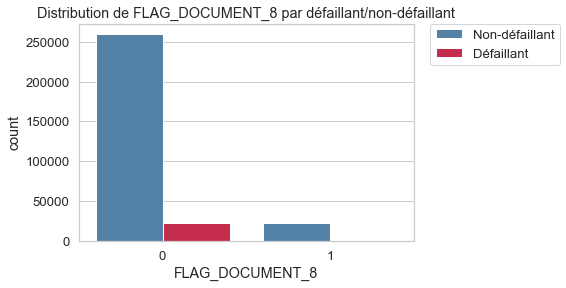

In [51]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_8')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~92%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance légèrement plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_9**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_9 = 2


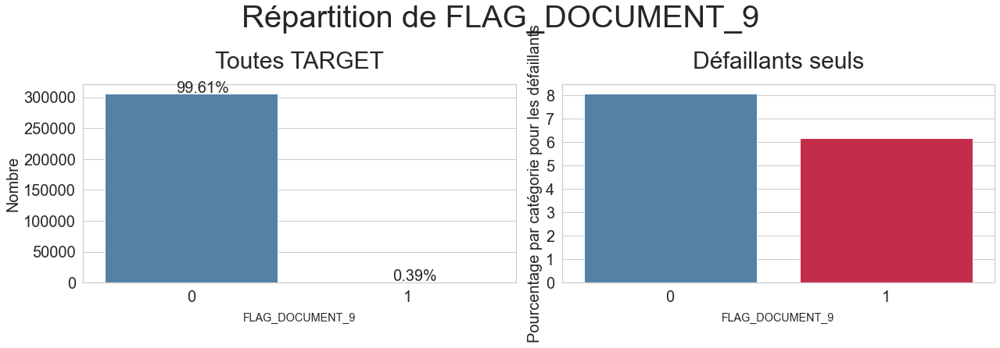

In [52]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_9',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [53]:
application_train[['FLAG_DOCUMENT_7', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_7  TARGET
0                0         282630
                 1          24822
1                0             56
                 1              3
dtype: int64

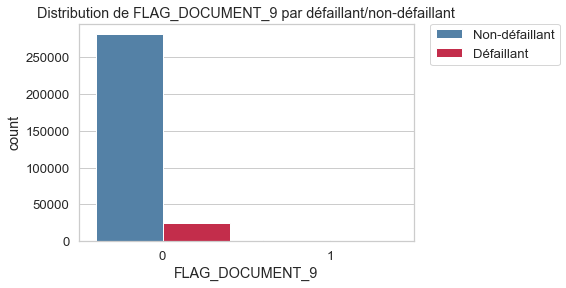

In [54]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_9')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_10**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_10 = 2


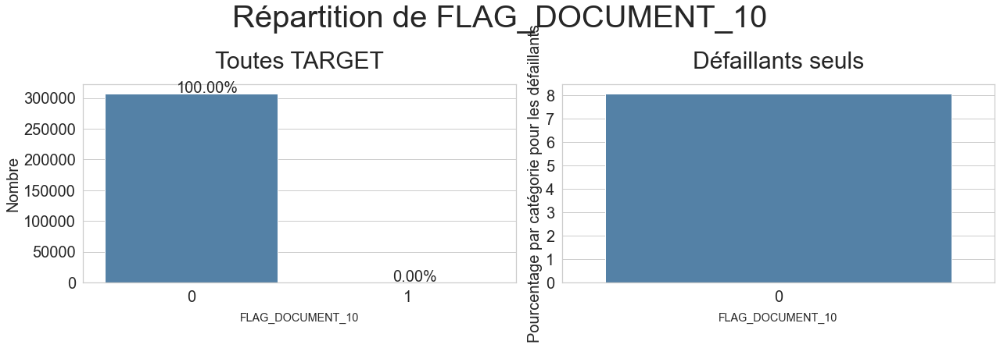

In [55]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_10',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [56]:
application_train[['FLAG_DOCUMENT_10', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_10  TARGET
0                 0         282679
                  1          24825
1                 0              7
dtype: int64

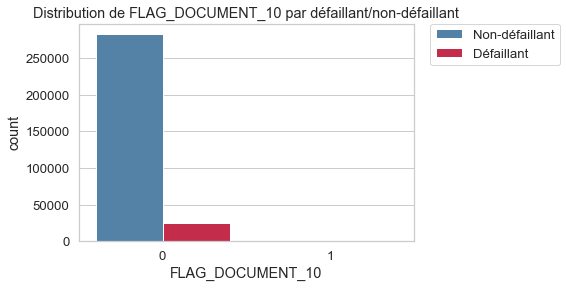

In [57]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_10')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~100%).

**Variable FLAG_DOCUMENT_11**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_11 = 2


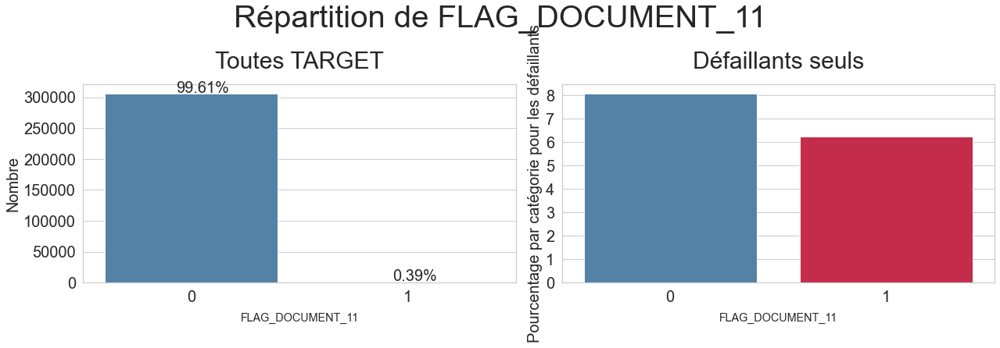

In [58]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_11',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [59]:
application_train[['FLAG_DOCUMENT_11', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_11  TARGET
0                 0         281558
                  1          24750
1                 0           1128
                  1             75
dtype: int64

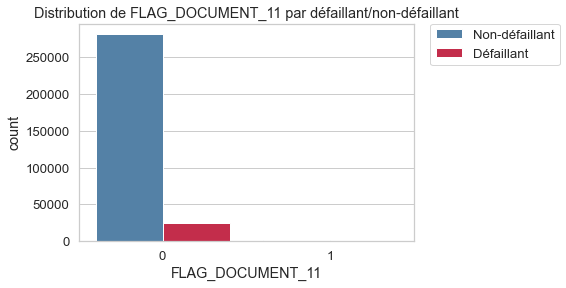

In [60]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_11')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_12**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_12 = 2


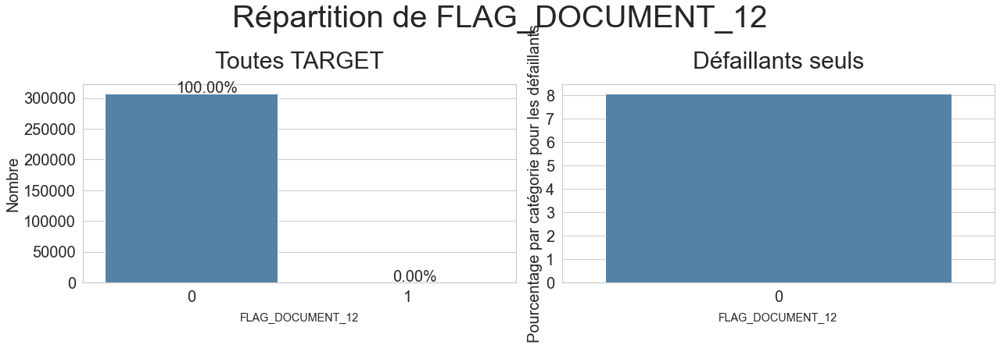

In [61]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_12',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [62]:
application_train[['FLAG_DOCUMENT_12', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_12  TARGET
0                 0         282684
                  1          24825
1                 0              2
dtype: int64

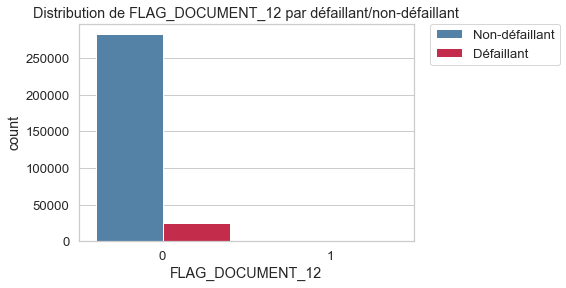

In [63]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_12')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (~100%).

**Variable FLAG_DOCUMENT_13**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_13 = 2


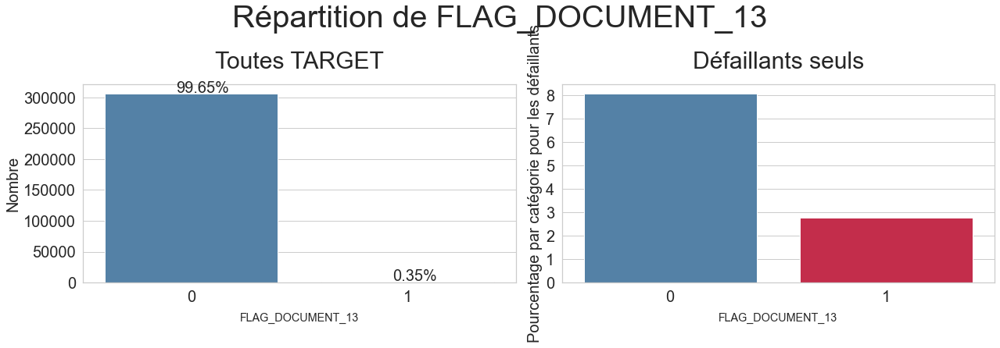

In [64]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_13',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [65]:
application_train[['FLAG_DOCUMENT_13', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_13  TARGET
0                 0         281632
                  1          24795
1                 0           1054
                  1             30
dtype: int64

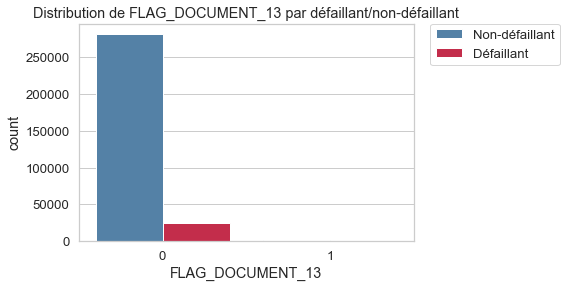

In [66]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_13')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_14**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_14 = 2


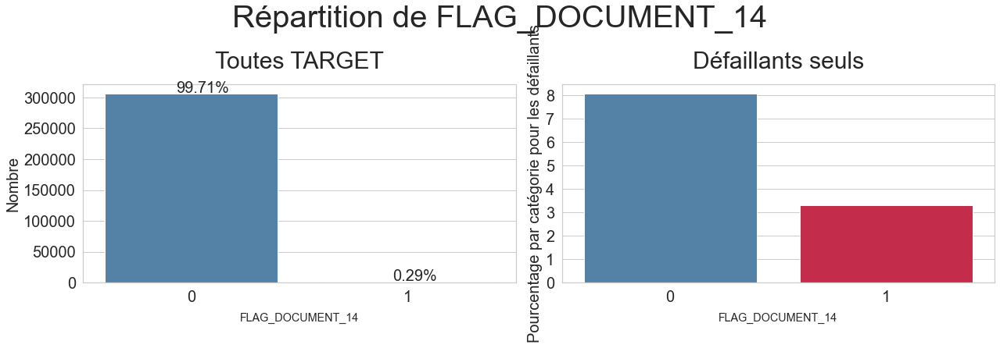

In [67]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_14',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [68]:
application_train[['FLAG_DOCUMENT_14', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_14  TARGET
0                 0         281813
                  1          24795
1                 0            873
                  1             30
dtype: int64

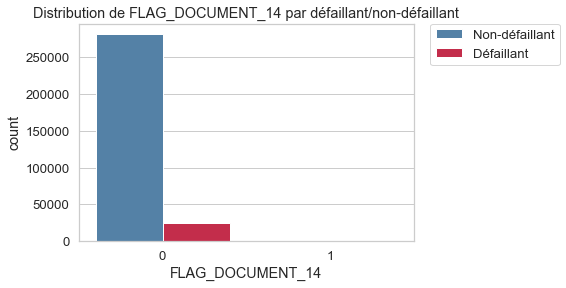

In [69]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_14')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_15**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_15 = 2


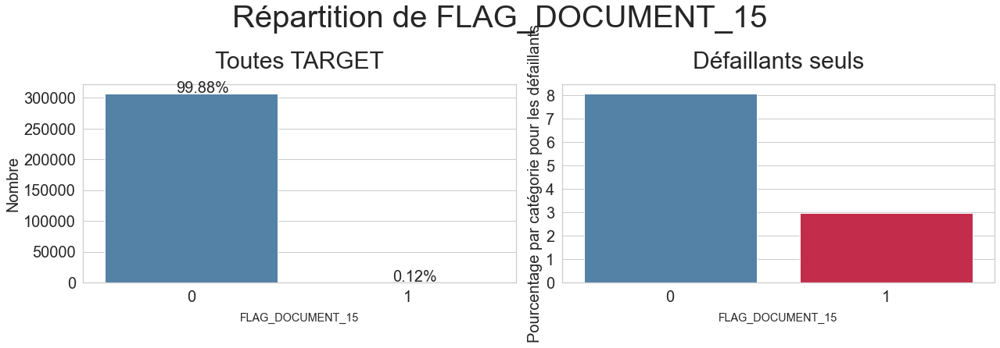

In [70]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_15',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [71]:
application_train[['FLAG_DOCUMENT_15', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_15  TARGET
0                 0         282325
                  1          24814
1                 0            361
                  1             11
dtype: int64

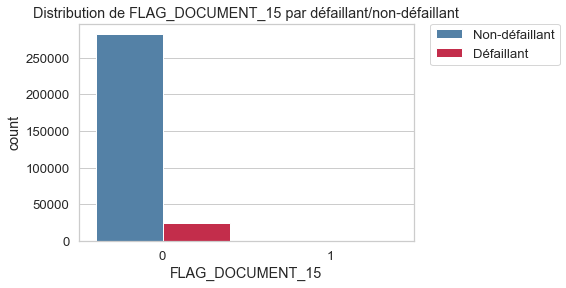

In [72]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_15')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_16**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_16 = 2


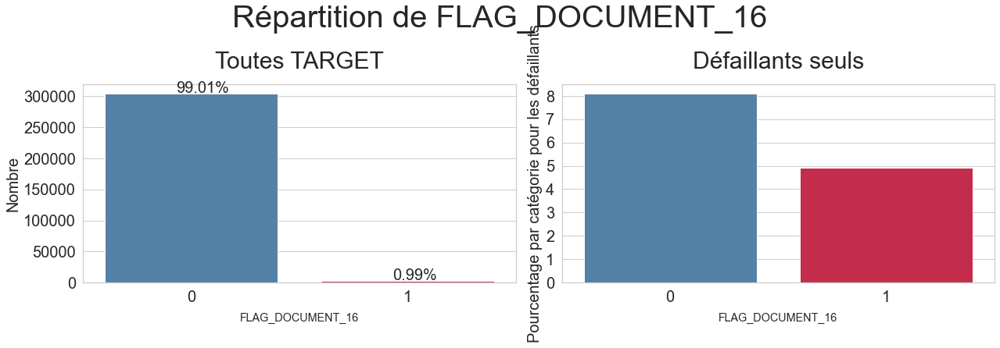

In [73]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_16',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [74]:
application_train[['FLAG_DOCUMENT_16', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_16  TARGET
0                 0         279783
                  1          24675
1                 0           2903
                  1            150
dtype: int64

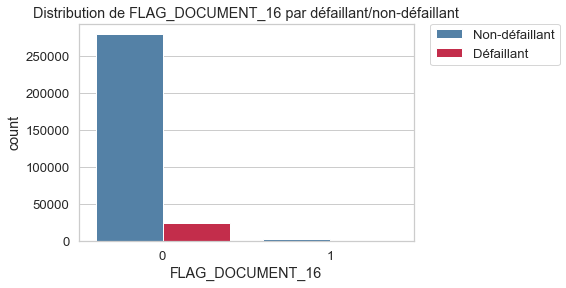

In [75]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_16')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_17**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_17 = 2


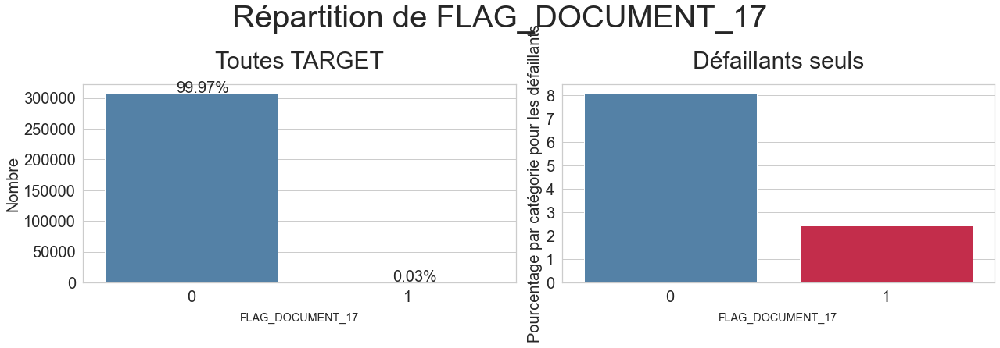

In [76]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_17',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [77]:
application_train[['FLAG_DOCUMENT_17', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_17  TARGET
0                 0         282606
                  1          24823
1                 0             80
                  1              2
dtype: int64

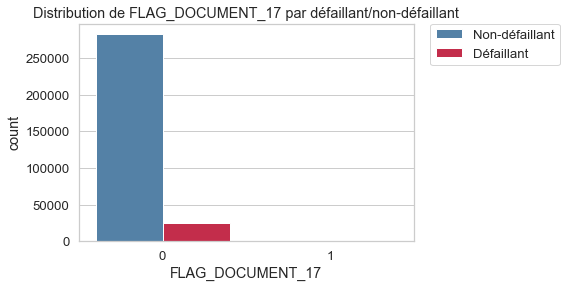

In [78]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_17')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_18**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_18 = 2


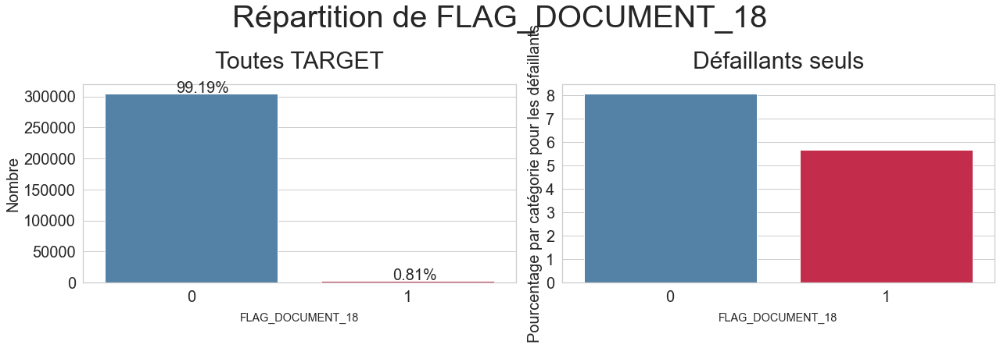

In [79]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_18',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [80]:
application_train[['FLAG_DOCUMENT_18', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_18  TARGET
0                 0         280328
                  1          24683
1                 0           2358
                  1            142
dtype: int64

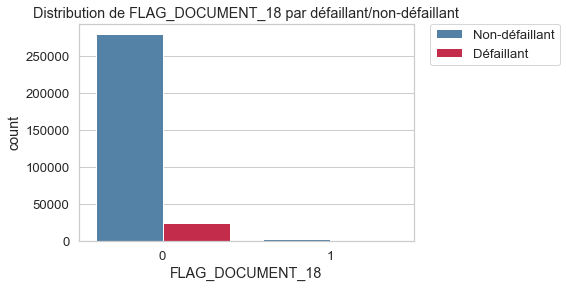

In [81]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_18')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_19**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_19 = 2


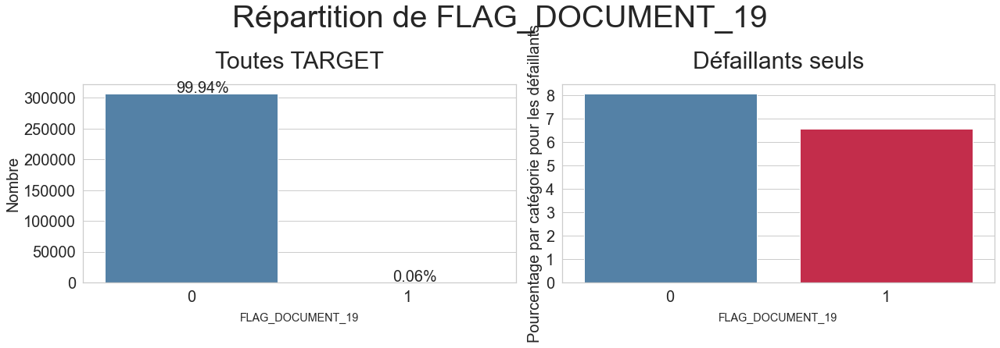

In [82]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_19',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [83]:
application_train[['FLAG_DOCUMENT_19', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_19  TARGET
0                 0         282515
                  1          24813
1                 0            171
                  1             12
dtype: int64

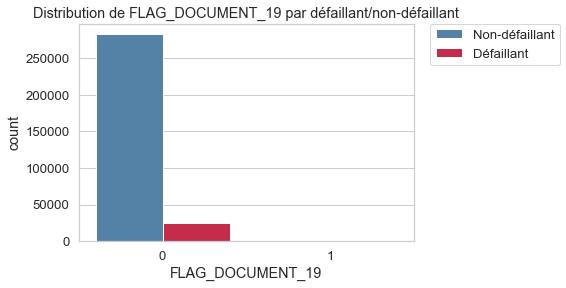

In [84]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_19')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_20**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_20 = 2


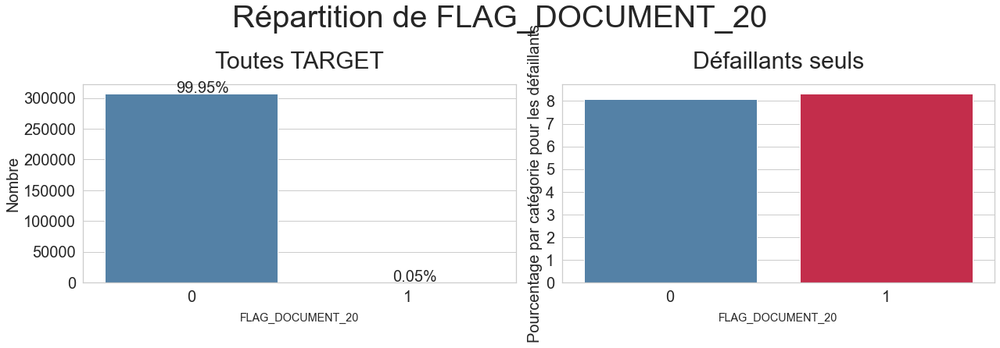

In [85]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_20',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [86]:
application_train[['FLAG_DOCUMENT_7', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_7  TARGET
0                0         282630
                 1          24822
1                0             56
                 1              3
dtype: int64

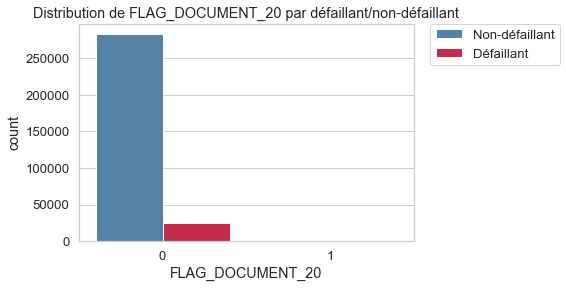

In [87]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_20')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance moins élevé que ceux qui ne l'ont pas fourni.

**Variable FLAG_DOCUMENT_21**

Cette variable contient l'indicateur (0 ou 1) d'un document qui devait être présenté par le demandeur du prêt.
- **0** si le demandeur a **fourni le document** 
- et **1** dans le cas contraire, **document non fourni**.

Nombre de catégories uniques pour FLAG_DOCUMENT_21 = 2


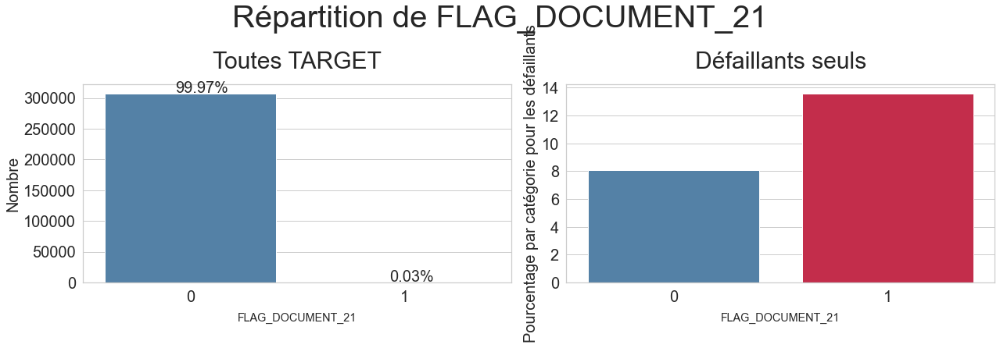

In [88]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_DOCUMENT_21',
    figsize=(18, 6), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['SteelBlue', 'Crimson'])

In [89]:
application_train[['FLAG_DOCUMENT_21', 'TARGET']] \
    .value_counts().sort_values(ascending=False)

FLAG_DOCUMENT_21  TARGET
0                 0         282597
                  1          24811
1                 0             89
                  1             14
dtype: int64

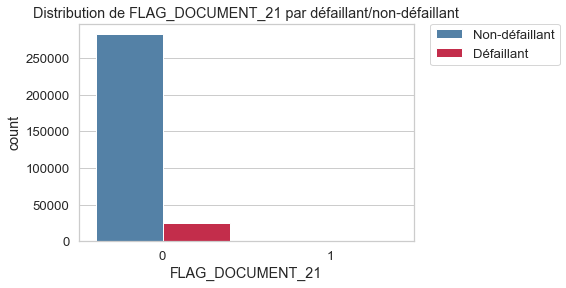

In [90]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_DOCUMENT_21')

**Bilan** :
***
D'après le graphique ci-dessus, nous voyons que :

- Dans le premier sous-graphe, nous voyons que la majorité des demandeurs ont fourni ce document (>99%).
- Dans le deuxième sous-graphe, nous constatons que ceux qui ont fourni ce document ont un taux de défaillance plus élevé que ceux qui ne l'ont pas fourni.

**Variable NAME_HOUSING_TYPE**

Quelle est la situation du demandeur en matière de logement (location, logement chez les parents...) ?

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_HOUSING_TYPE' sont :
['House / apartment' 'Rented apartment' 'With parents'
 'Municipal apartment' 'Office apartment' 'Co-op apartment']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_HOUSING_TYPE = 6


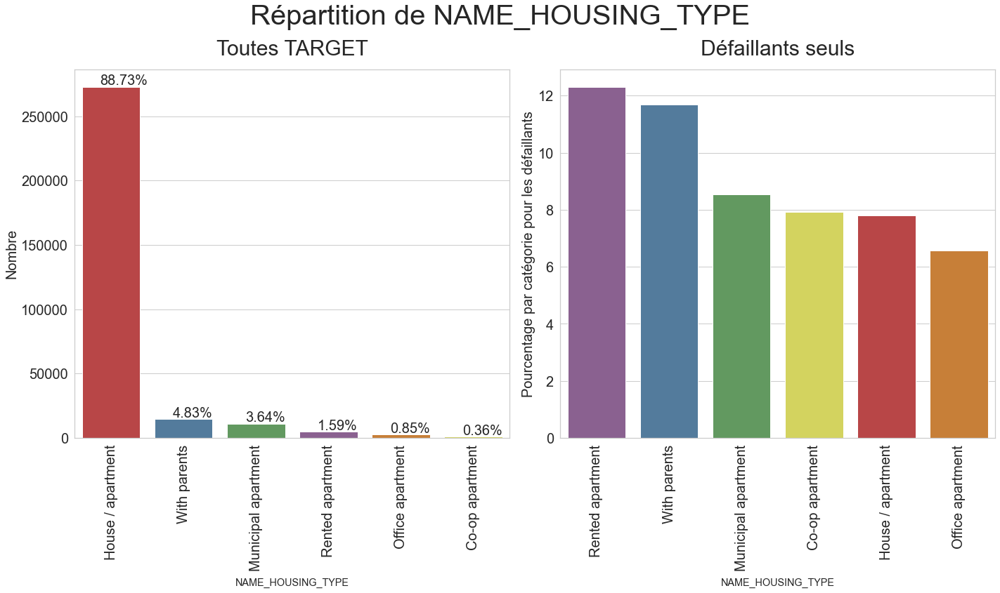

In [91]:
# Let us first see the unique categories of 'NAME_HOUSING_TYPE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_HOUSING_TYPE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_HOUSING_TYPE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c'],
                                   palette2=['#905998', '#477ca8',
                                             '#59a257', '#e6e64c',
                                             '#cb3335', '#df7f20'])

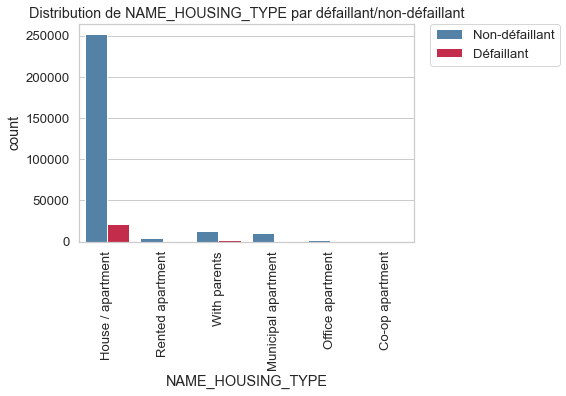

In [92]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_HOUSING_TYPE',
                                              rotation=90)

**Bilan** :
***
- Le premier graphique général montre :
    - que la majorité (89%)des demandeurs sont propriétaires d'une maison ou d'un appartement.
    - que 5% des demandeurs vivent chez leurs parents.
    - et les 5 autres pourcent concernent les appartements de location, municipaux ou les co-locations.
- Le second graphique, qui effectue un zoom sur les défaillants, montre que les personnes qui ont le taux de défaillance le plus élevé, font partie des 5% restant du graphique général : la majorité loue un appartement ou habitent chez leurs parents mais ne sont pas propriétaire.

La situation du logement du demandeur pourra donc avoir une influence sur la défaillance potentielle du demandeur.

**Variable NAME_FAMILY_STATUS**

Cette variable indique la Situation familiale du demandeur (Célibataire, marié, pacsé, séparé, divorcé, veuf...).

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_FAMILY_STATUS' sont :
['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated'
 'Unknown']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_FAMILY_STATUS = 6


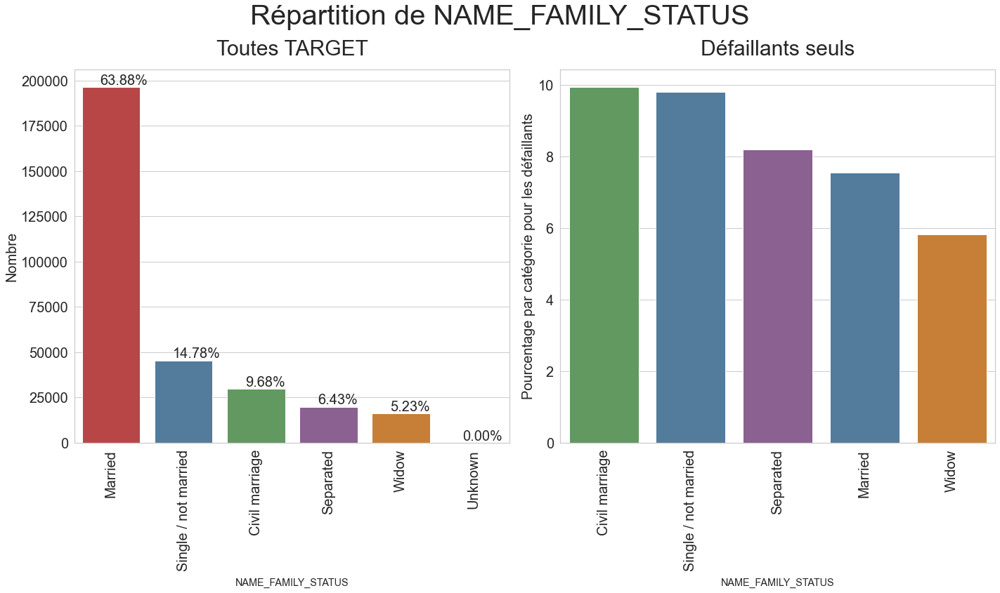

In [93]:
# Let us first see the unique categories of 'NAME_FAMILY_STATUS'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_FAMILY_STATUS',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_FAMILY_STATUS',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c'],
                                   palette2=['#59a257', '#477ca8',
                                             '#905998', '#477ca8',
                                             '#df7f20'])

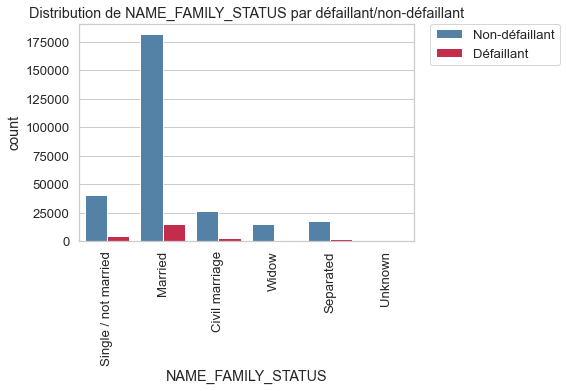

In [94]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_FAMILY_STATUS',
                                              rotation=90)

**Bilan** :
***
- Le premier graphique général montre que :
    - la majorité (74%) des demandeurs sont mariés (64% mariés religieusement, 10% mariés civilement).
    - près de 15% des demandeurs sont célibataires.
    - le reste est réparti entre les séparés (6.5%) et les veufs (%).
- Concernant les défaillants seuls, la règle du graphique général n'est pas respecté. Les demandeurs ayant les taux de défaillance le plus élevé sint mariés civilement ou célibataires (autour de 10%), puis suivent les séparés (8%), les mariés (7.5%) et les veufs (6%).

La situation familiale du demandeur pourra donc avoir une influence sur la défaillance du demandeur.

**Variable NAME_INCOME_TYPE**

Cette variable représente le type des revenus des demandeurs (homme d'affaires, travailleur, congé de maternité...)

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_INCOME_TYPE' sont :
['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_INCOME_TYPE = 8


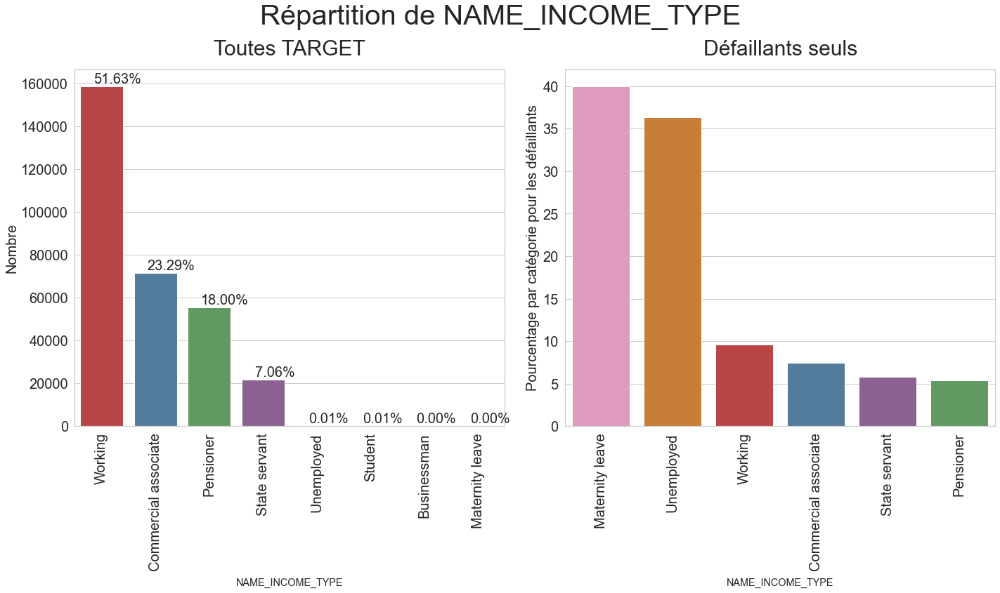

In [95]:
# Let us first see the unique categories of 'NAME_INCOME_TYPE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_INCOME_TYPE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_INCOME_TYPE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be'],
                                   palette2=['#e890be', '#df7f20',
                                             '#cb3335', '#477ca8',
                                             '#905998', '#59a257'])

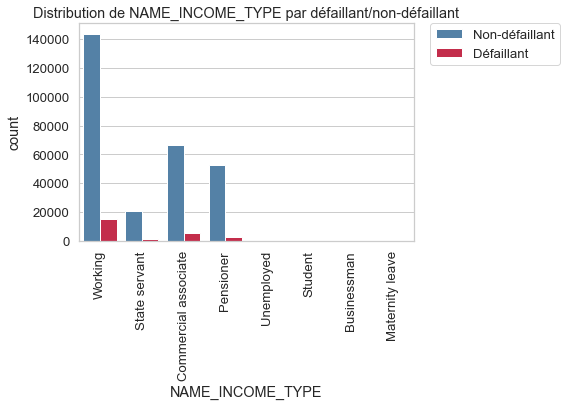

In [96]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_INCOME_TYPE',
                                              rotation=90)

**Bilan** :
***
- Le premier graphique général montre que :
    - la majorité des demandeurs sont des travailleurs (52%),
    - puis 23% de commerciaux, 18% de retraités et 7 % des vendeurs.
    - très peu de type de revenus passifs : non salariés, étudiants, hommes d'affaires et en congés de maternité : autour de 0%.
- Concernant les défaillants, les pourcentages du graphique général ne sont pas respectés :
    - la majorité des demandeurs ayant le taux de défaillance le plus élevé sont les catégories les plus rares du graphique général : les congés de maternité et les non salariés (près de 40%),
    - puis seulement 10% de la classe majoritaire des travailleurs 
    - et 5% de la classe des commerciaux.
    - Seulement 5% des 7% des retraités ne remboursent pas leurs dettes.

Le type de revenu du demandeur pourra donc avoir une influence sur la défaillance du demandeur.

**Variable FLAG_OWN_CAR**

Cette variable contient l'indicateur (N ou Y) indiquant si le demandeur possède un véhicule ou non.
- **Y** : le demandeur possède une voiture, 
- et **N** : le demandeur ne possède pas de voiture.

Nombre de catégories uniques pour FLAG_OWN_CAR = 2


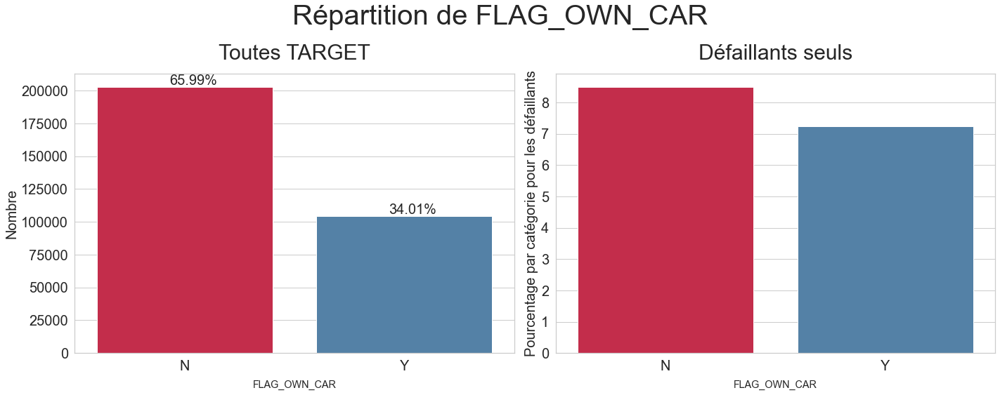

In [97]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_OWN_CAR',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

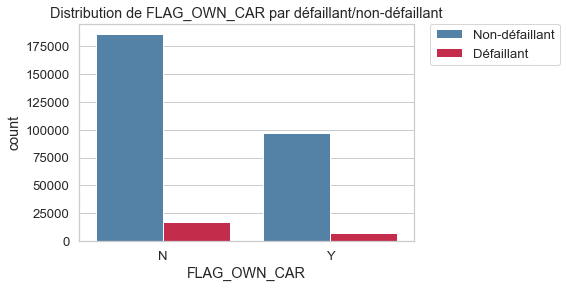

In [98]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_OWN_CAR')

**Bilan** :
***
- Seulement 34% des demandeurs possèdent un véhicule.
- Parmi les défaillants 7% possèdent un véhicule et 8.5%.

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession ou non d'un véhicule.

**Variable FLAG_OWN_REALTY**

Cette variable indique si le demandeur possède une maison ou un appartement.
- **Y** : le demandeur possède une maison ou un appartement, 
- et **N** : le demandeur ne possède pas de maison ou d'appartement.

Nombre de catégories uniques pour FLAG_OWN_REALTY = 2


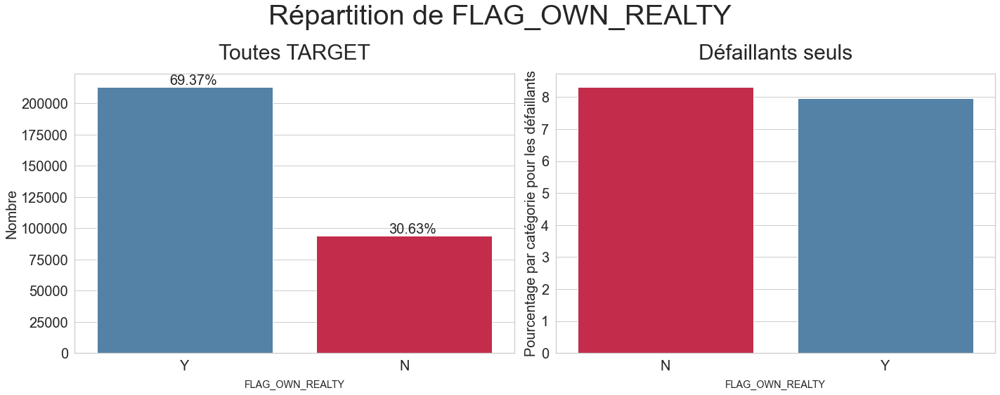

In [99]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_OWN_REALTY',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['Crimson', 'SteelBlue'])

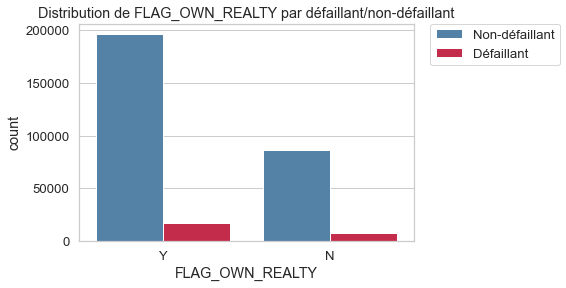

In [100]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_OWN_REALTY')

**Bilan** :
***
- 69% des demandeurs possèdent un une maion ou un appartement.
- Parmi les défaillants, les défaillants possédant ou non une maison ou un appartement sont très proches (autour de 8%).

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession ou non d'une maison ou d'un appartement.

**Variable NAME_TYPE_SUITE**

Qui accompagnait le demandeur lorsqu'il a demandé le prêt ?

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'NAME_TYPE_SUITE' sont :
['Unaccompanied' 'Family' 'Spouse, partner' 'Children' 'Other_A' nan
 'Other_B' 'Group of people']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_TYPE_SUITE = 8


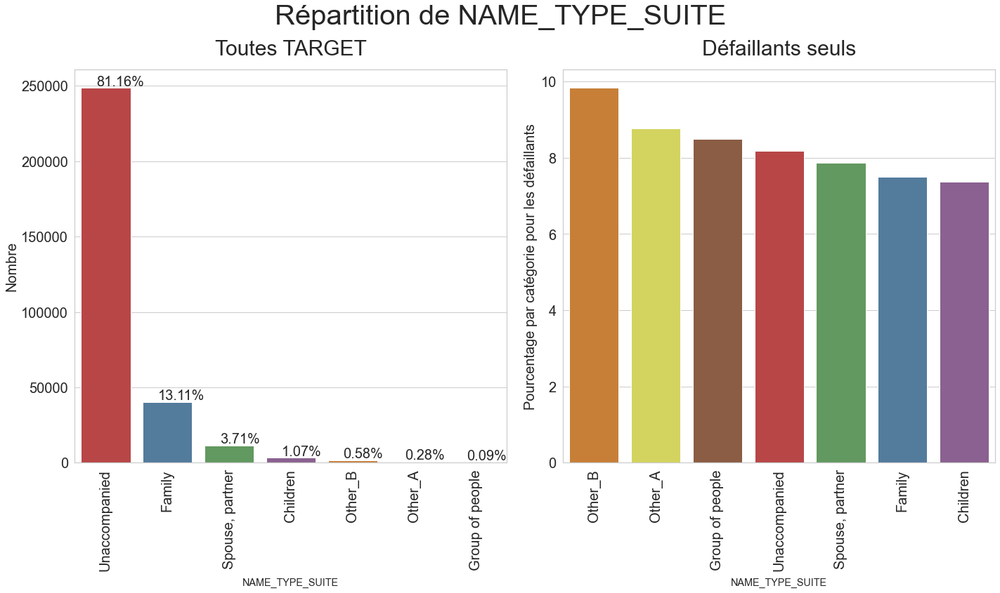

In [101]:
# Let us first see the unique categories of 'NAME_TYPE_SUITE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'NAME_TYPE_SUITE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='NAME_TYPE_SUITE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#df7f20', '#e6e64c',
                                             '#965a38', '#cb3335',
                                             '#59a257', '#477ca8',
                                             '#905998'])

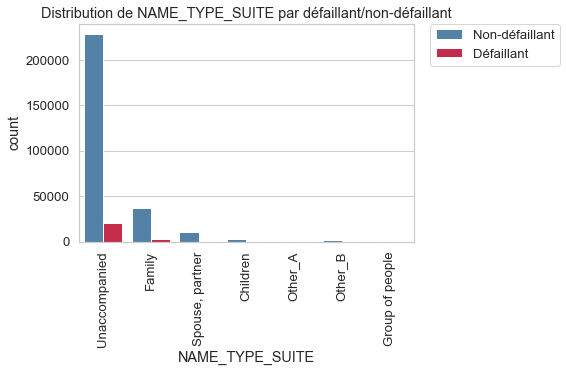

In [102]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'NAME_TYPE_SUITE',
                                              rotation=90)

**Bilan** :
***
- Le premier graphique général montre que :
    - la majorité des demandeurs n'ont pas été accompagnés leur du rendez-vous pour la demande de prêt (81%),
    - puis 13% ont été accompagnés par leur famille,
    - 4% par leur épouse ou conjoint,
    - très peu ont été accompagnés par un enfant (1%), ou d'autres personnes (<0.6% et 0.3% mais comment différencier Other_B de Other_A? pas précisé dans la documentation).
- Concernant les défaillants, les pourcentages du graphique général ne sont pas respectés :
    - les 3 catégories les plus défaillantes sont les 3 catégories représentant moins de 0.6% et 0.3% sur le graphique général :
        - 10% des défaillants ont été accompagnés par les autres personnes Other_B qui ne représentent que 0.6% des classes du graphique général.
        - 8.5% des autres personnes Other_A,
        - et 8% par un groupe de personnes.

L'accompagnateur du demandeur lors du rendez-vous de la demande de prêt pourra donc avoir une influence sur la défaillance du demandeur.

**Variable WEEKDAY_APPR_PROCESS_START**

Quel jour de la semaine le demandeur a-t-il demandé le prêt ?

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'WEEKDAY_APPR_PROCESS_START' sont :
['WEDNESDAY' 'MONDAY' 'THURSDAY' 'SUNDAY' 'SATURDAY' 'FRIDAY' 'TUESDAY']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
TUESDAY      53901
WEDNESDAY    51934
MONDAY       50714
THURSDAY     50591
FRIDAY       50338
SATURDAY     33852
SUNDAY       16181
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour WEEKDAY_APPR_PROCESS_START = 7


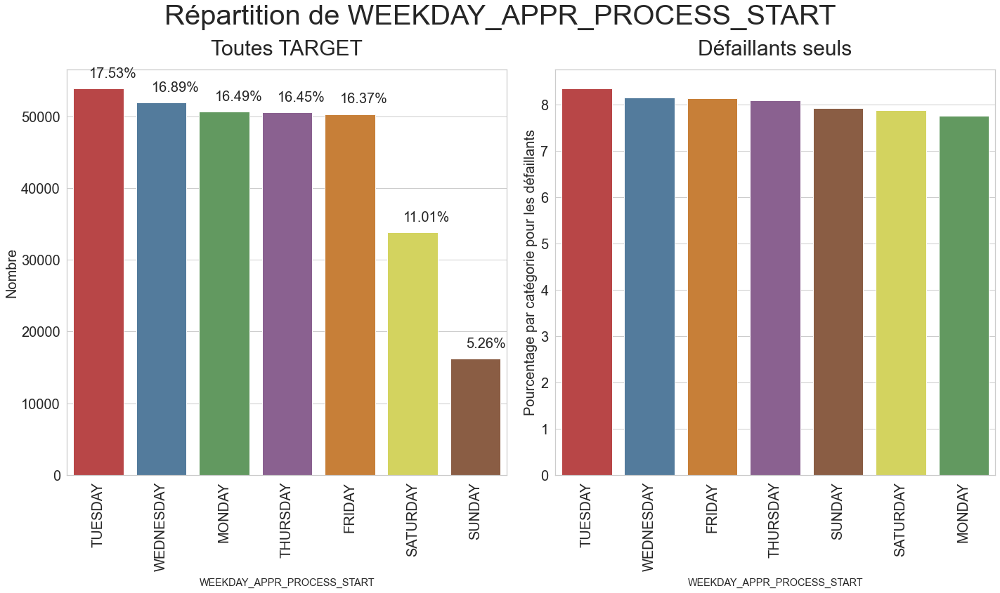

In [103]:
# Let us first see the unique categories of 'WEEKDAY_APPR_PROCESS_START'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'WEEKDAY_APPR_PROCESS_START',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='WEEKDAY_APPR_PROCESS_START',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#cb3335', '#477ca8',
                                             '#df7f20', '#905998',
                                             '#965a38', '#e6e64c',
                                             '#59a257'])

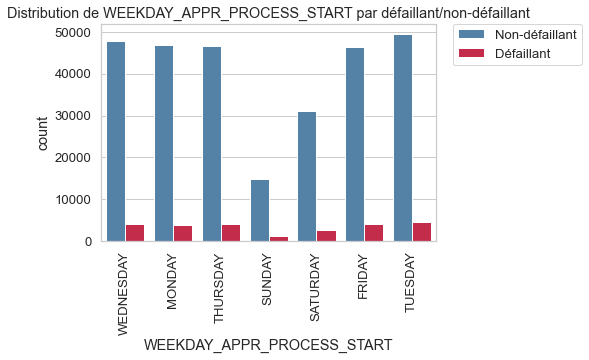

In [104]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'WEEKDAY_APPR_PROCESS_START',
                                              rotation=90)

**Bilan** :
***
- La majorité du jour de la demande de prêt est effectuée en semaine plutôt qu'en week-end avec une répartition sur tous les jours de la semaine avec un petit avantage le jeudi. Tout cela semble logique.
- Au niveau du graphique sur les défaillants seuls, la demande a été effectuée tous les jours de la semaine avec un pourentage autour de 8%.

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur l'information du jour de demande du prêt.

**Variable FONDKAPREMONT_MODE**

Informations normalisées sur l'immeuble où vit le demandeur qu'il s'agisse de la taille moyenne (suffixe AVG), du modus (suffixe MODE) ou de la médiane (suffixe MEDI) de l'appartement, de la surface commune, de la surface habitable, de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées, de l'état de l'immeuble, du nombre d'étages...

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'FONDKAPREMONT_MODE' sont :
['reg oper account' nan 'org spec account' 'reg oper spec account'
 'not specified']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
reg oper account         73830
reg oper spec account    12080
not specified             5687
org spec account          5619
Name: FONDKAPREMONT_MODE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour FONDKAPREMONT_MODE = 5


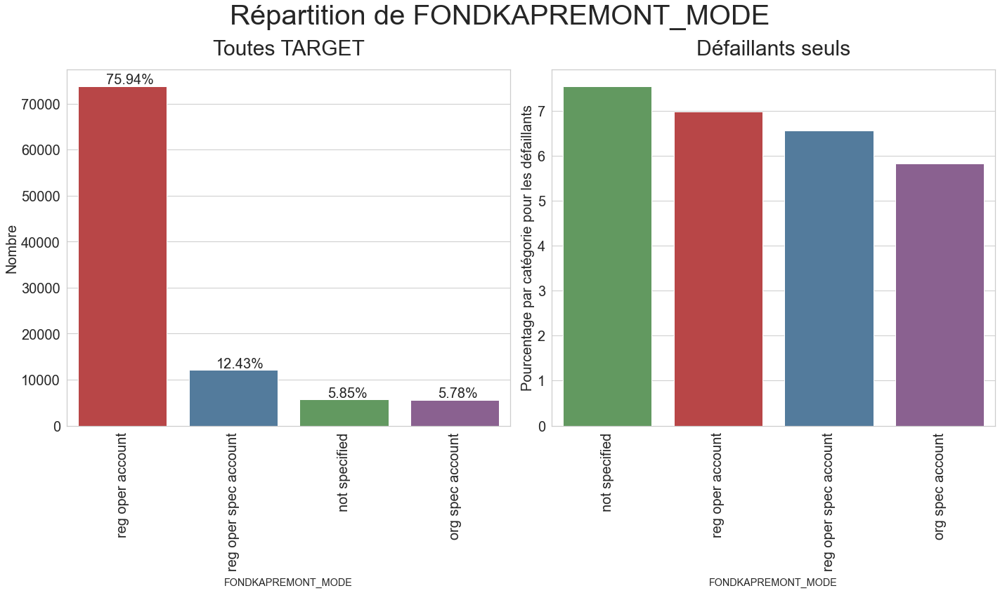

In [105]:
# Let us first see the unique categories of 'FONDKAPREMONT_MODE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'FONDKAPREMONT_MODE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='FONDKAPREMONT_MODE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#59a257', '#cb3335',
                                             '#477ca8', '#905998'])

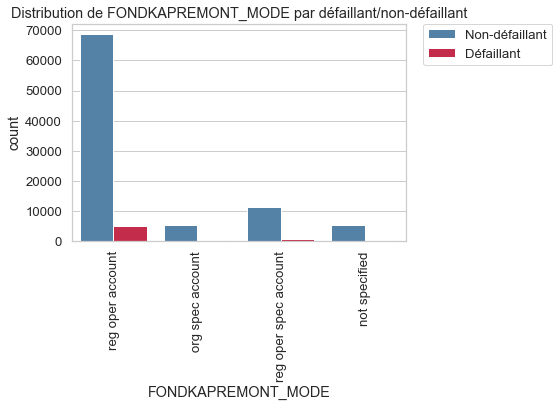

In [106]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FONDKAPREMONT_MODE',
                                              rotation=90)

**Bilan** :
***
Cette variable est difficile à comprendre puisque les libellés sont raccourcis et aucune des catégories ne se distinguent sur le graphique du zoom des défaillants seuls à droite. 
Cette variable sera peu utile pour départager les défaillants des non défaillants.

**Variable HOUSETYPE_MODE**

Informations normalisées sur l'immeuble où vit le demandeur qu'il s'agisse de la taille moyenne (suffixe AVG), du modus (suffixe MODE) ou de la médiane (suffixe MEDI) de l'appartement, de la surface commune, de la surface habitable, de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées, de l'état de l'immeuble, du nombre d'étages...

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'HOUSETYPE_MODE' sont :
['block of flats' nan 'terraced house' 'specific housing']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
block of flats      150503
specific housing      1499
terraced house        1212
Name: HOUSETYPE_MODE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour HOUSETYPE_MODE = 4


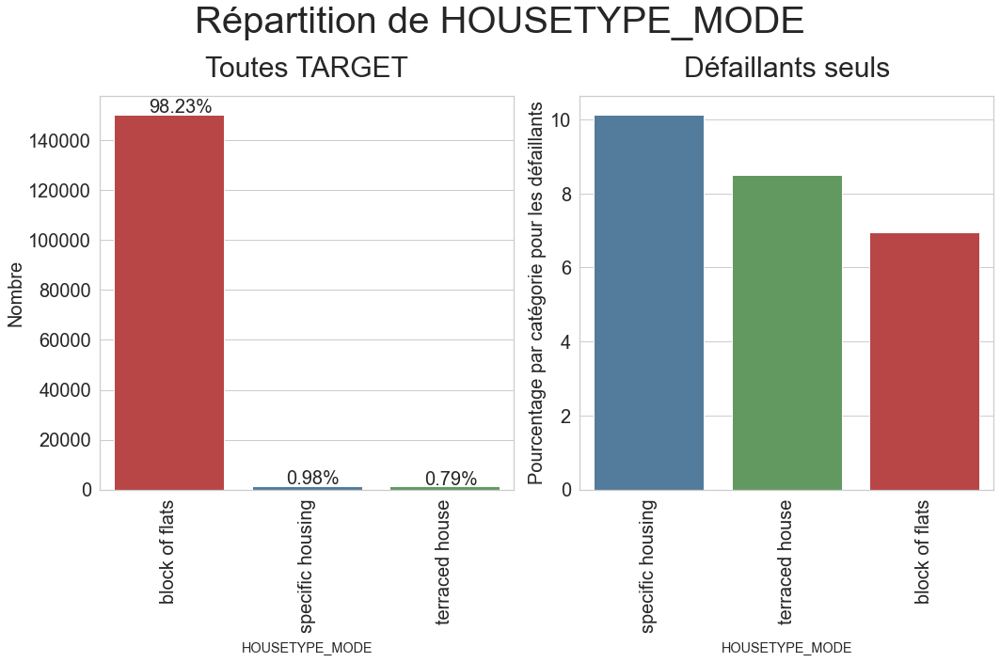

In [107]:
# Let us first see the unique categories of 'HOUSETYPE_MODE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'HOUSETYPE_MODE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='HOUSETYPE_MODE',
                                   figsize=(15, 10),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257'],
                                   palette2=['#477ca8', '#59a257',
                                             '#cb3335'])

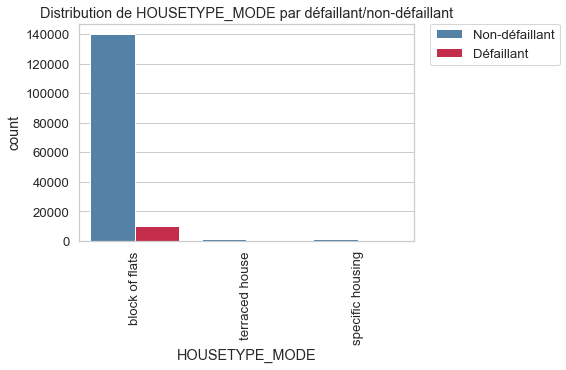

In [108]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'HOUSETYPE_MODE',
                                              rotation=90)

**Bilan** :
***
Cette variable est diffcile à comprendre et relativement bien partagée sur les défaillants donc ne sera pas primordiale pour départager les défaillants, des non-défaillants.

**Variable WALLSMATERIAL_MODE**

Informations normalisées sur l'immeuble où vit le demandeur qu'il s'agisse de la taille moyenne (suffixe AVG), du modus (suffixe MODE) ou de la médiane (suffixe MEDI) de l'appartement, de la surface commune, de la surface habitable, de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées, de l'état de l'immeuble, du nombre d'étages...

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'WALLSMATERIAL_MODE' sont :
['Stone, brick' 'Block' nan 'Panel' 'Mixed' 'Wooden' 'Others' 'Monolithic']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Panel           66040
Stone, brick    64815
Block            9253
Wooden           5362
Mixed            2296
Monolithic       1779
Others           1625
Name: WALLSMATERIAL_MODE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour WALLSMATERIAL_MODE = 8


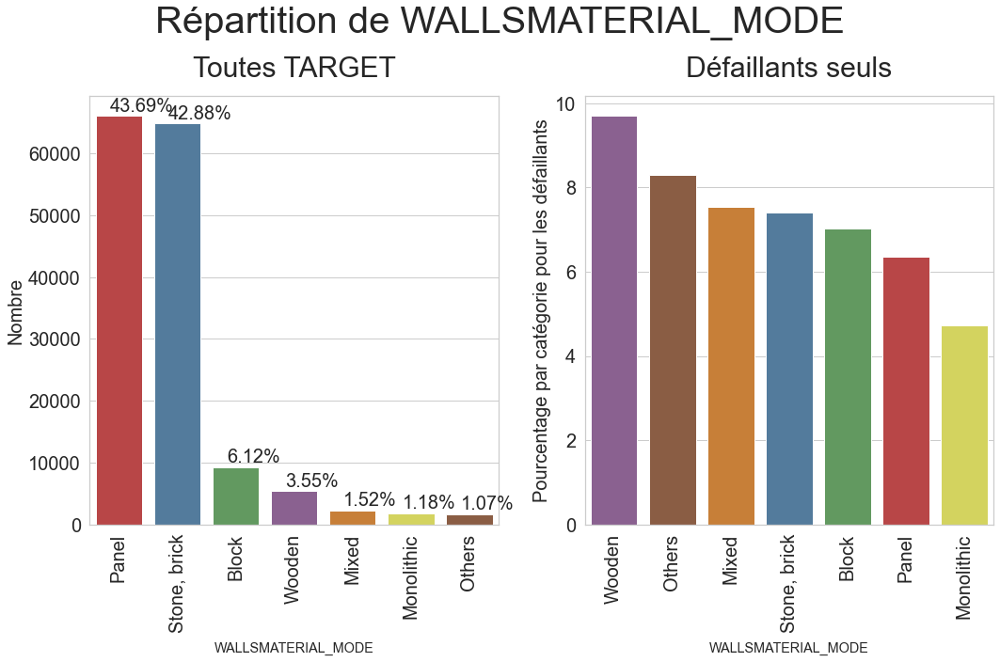

In [109]:
# Let us first see the unique categories of 'WALLSMATERIAL_MODE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'WALLSMATERIAL_MODE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='WALLSMATERIAL_MODE',
                                   figsize=(15, 10),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#905998', '#965a38',
                                             '#df7f20', '#477ca8',
                                             '#59a257', '#cb3335',
                                             '#e6e64c'])

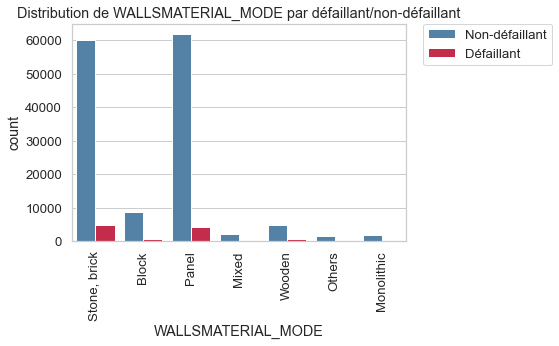

In [110]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'WALLSMATERIAL_MODE',
                                              rotation=90)

**Bilan** :
***
Cette variable est relativement bien partagée sur le graphique des défaillants donc ne sera pas primordiale pour départager les défaillants, des non-défaillants.

**Variable EMERGENCYSTATE_MODE**

Informations normalisées sur l'immeuble où vit le demandeur qu'il s'agisse de la taille moyenne (suffixe AVG), du modus (suffixe MODE) ou de la médiane (suffixe MEDI) de l'appartement, de la surface commune, de la surface habitable, de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées, de l'état de l'immeuble, du nombre d'étages...

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'EMERGENCYSTATE_MODE' sont :
['No' nan 'Yes']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
No     159428
Yes      2328
Name: EMERGENCYSTATE_MODE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour EMERGENCYSTATE_MODE = 3


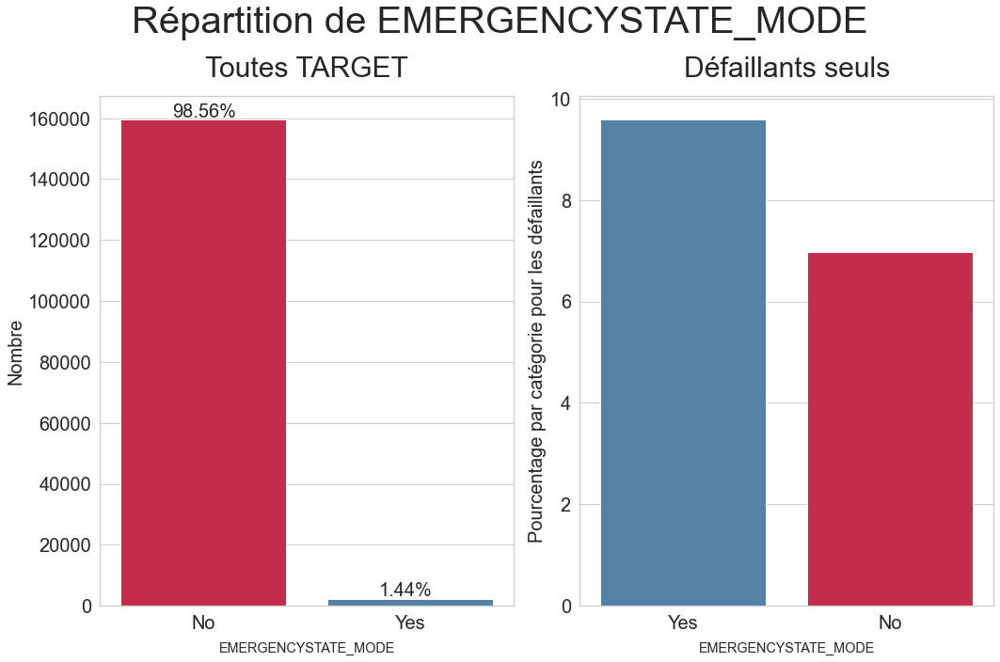

In [111]:
# Let us first see the unique categories of 'EMERGENCYSTATE_MODE'
eda_kernel_fonctions. \
    print_unique_categories(application_train, 'EMERGENCYSTATE_MODE',
                            show_counts=True)

# plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(application_train,
                                   column_name='EMERGENCYSTATE_MODE',
                                   figsize=(15, 10),
                                   rotation=0, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['Crimson', 'SteelBlue'],
                                   palette2=['SteelBlue', 'Crimson'])

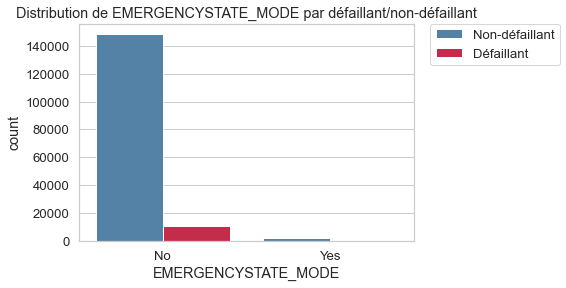

In [112]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'EMERGENCYSTATE_MODE')

**Bilan** :
***
La majorité n'est pas en état d'urgence mais plus de défaillants sont dans un état d'urgence.

**Variable FLAG_MOBIL**

Le demandeur a-t-il fourni un téléphone portable ? :
- **1** : OUI, 
- et **0** : NON.

Nombre de catégories uniques pour FLAG_MOBIL = 2


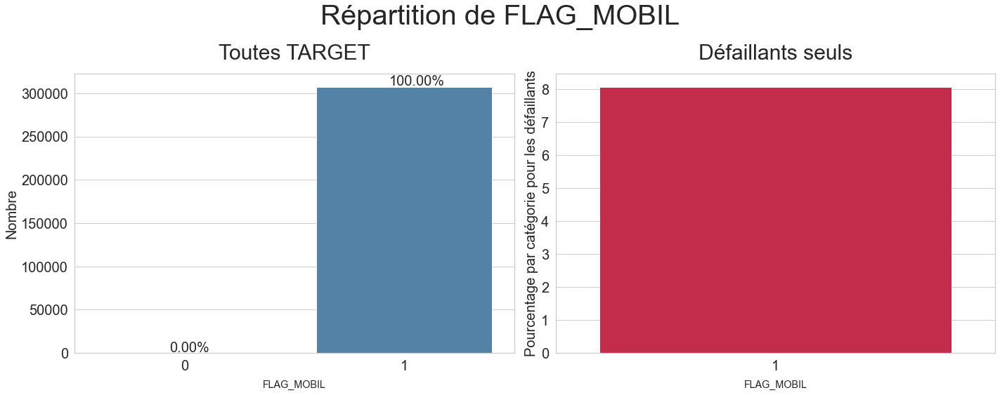

In [113]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_MOBIL',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

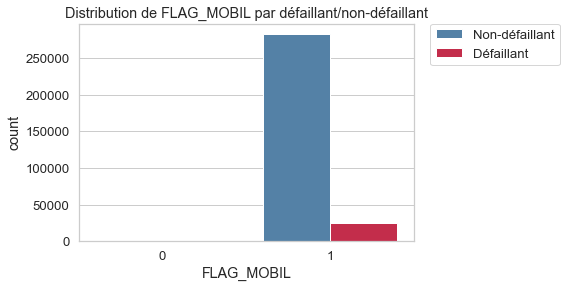

In [114]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_MOBIL')

**Bilan** :
***
- 100% des demandeurs ont fourni un numéro de téléphone portable.

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession ou non d'un téléphone portable.

**Variable FLAG_WORK_PHONE**

Le demandeur a-t-il fourni un téléphone de travailfixe ? :
- **1** : OUI, 
- et **0** : NON.

Nombre de catégories uniques pour FLAG_WORK_PHONE = 2


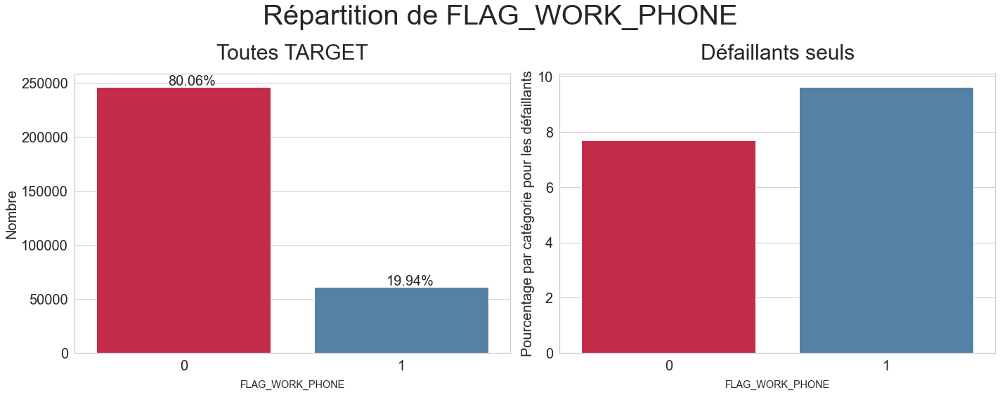

In [115]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_WORK_PHONE',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

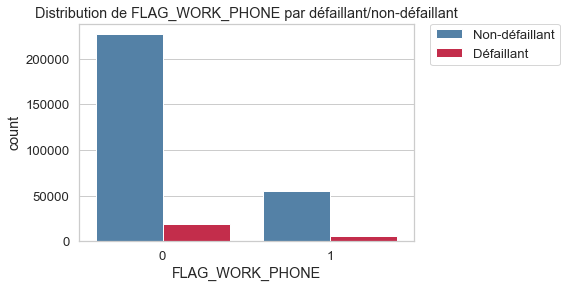

In [116]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_WORK_PHONE')

**Bilan** :
***
- 80% des demandeurs ont un téléphone de travailfixe, pour les défaillants la tendance est inverse avec un peu plus (10% au lieu de 8%) de possesseur d'une ligne fixe au travail que pour les défaillants mais le pourcentage est assez proche.

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession ou non d'une ligne de travail fixe.

**Variable FLAG_CONT_MOBILE**

Le téléphone portable était-il joignable ? :
- **1** : OUI, 
- et **0** : NON.

Nombre de catégories uniques pour FLAG_CONT_MOBILE = 2


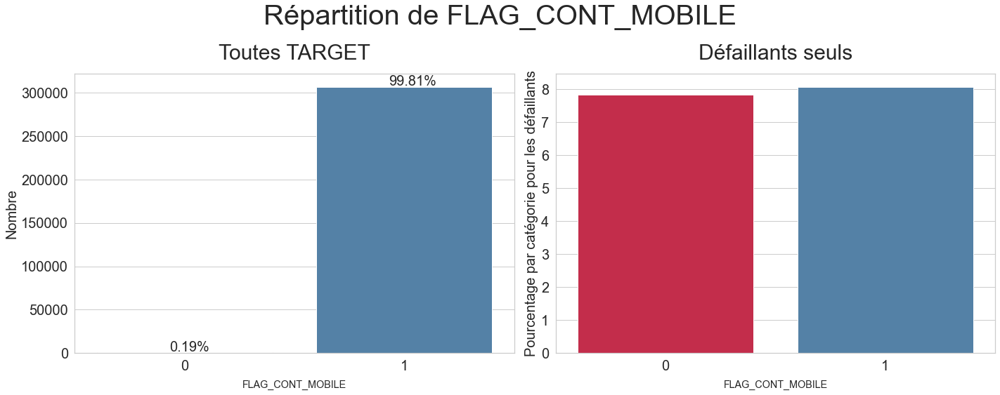

In [117]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_CONT_MOBILE',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

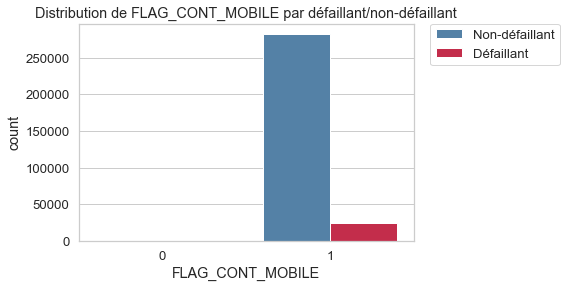

In [118]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_CONT_MOBILE')

**Bilan** :
***
- sur l'ensemble des demandeurs, le téléphone portable est joignable à 99,8% mais pour les défaillants le pourcentage passe à 50%.

Cette variable pourra être utile pour départager les défaillants des non-défaillants sur la joignabilité du téléphone portable.

**Variable FLAG_PHONE**

Le demandeur a-t-il fourni un numéro de téléphone fixe de domicile ? :
- **1** : OUI
- et **0** : NON

Nombre de catégories uniques pour FLAG_PHONE = 2


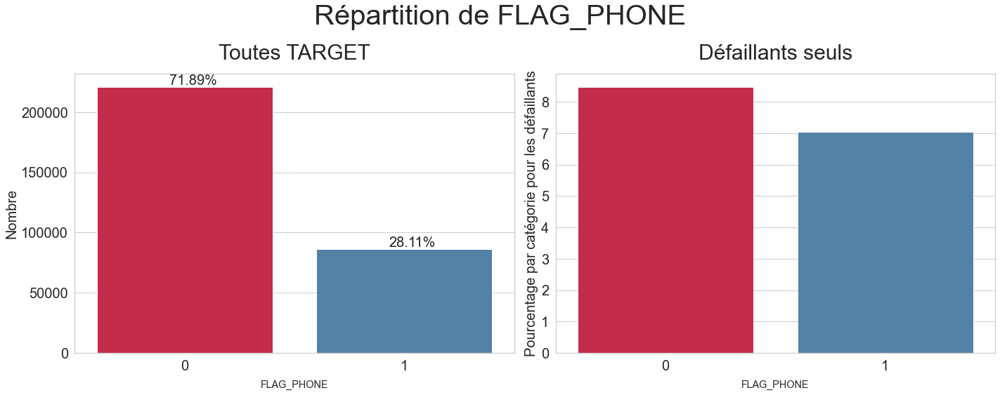

In [119]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_PHONE',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

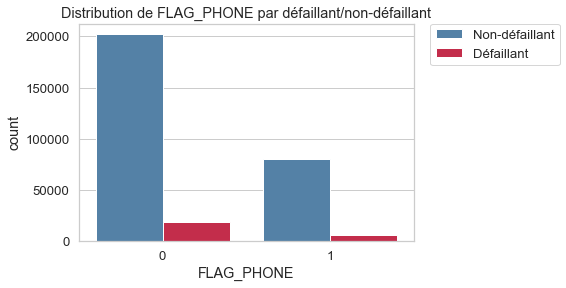

In [120]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_PHONE')

**Bilan** :
***
- 72% des demandeurs n'ont pas fourni de numéro de téléphone fixe de domicile mais parmi les défaillants seuls plus de personnes ont transmis leur numéro fixe que non.

Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession d'un numéro de téléphone fixe de domicile.

**Variable FLAG_EMAIL**

Le demandeur a-t-il fourni une adresse électronique ? :
- **1** : OUI, 
- et **0** : NON.

Nombre de catégories uniques pour FLAG_EMAIL = 2


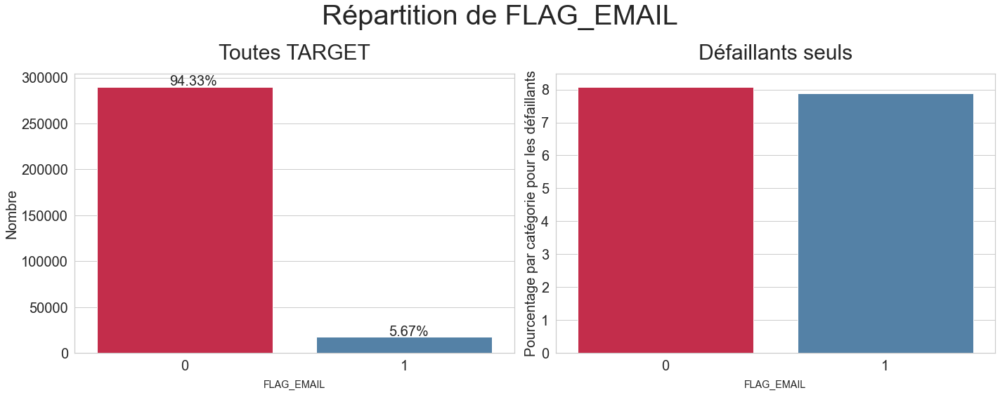

In [121]:
eda_kernel_fonctions.plot_categorical_variables_bar(
    application_train, column_name='FLAG_EMAIL',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['Crimson', 'SteelBlue'], palette2=['Crimson', 'SteelBlue'])

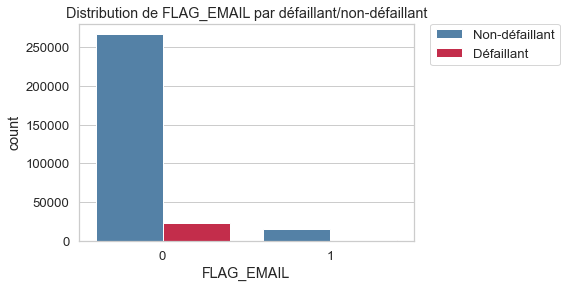

In [122]:
# Distribution par défaillants/non-défaillants
eda_kernel_fonctions.plot_barplot_comp_target(application_train,
                                              'FLAG_EMAIL')

**Bilan** :
***
Cette variable ne sera pas très utile pour départager les défaillants des non-défaillants sur la possession ou non d'une adresse de messagerie.

***
### **Distribution des variables quantitatives**
***

In [123]:
# Liste des variables quantitatives
cols_num = \
    application_train.select_dtypes(include=[np.number]).columns.to_list()
cols_num

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAR

**Variable DAYS_BIRTH**

- Âge du demandeur en jours au moment de la demande.
- Pour l'ensemble de données donné, l'âge est indiqué en jours, ce qui peut être plus difficile à interpréter. 
- Nous allons donc créer une variable latente pour stocker les âges en années, ce qui sera plus facile à analyser et à interpréter.

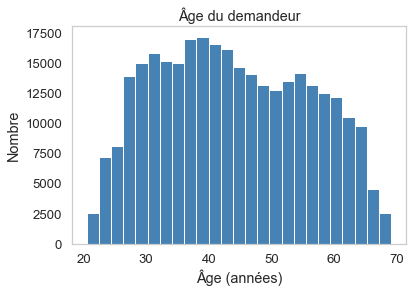

In [124]:
plt.hist(application_train['DAYS_BIRTH']*-1/365, color='SteelBlue',
         bins=25)
plt.title('Âge du demandeur')
plt.xlabel('Âge (années)')
plt.ylabel('Nombre')
plt.grid(False)
plt.show()

In [125]:
# Transformer l'âge en années à partir du nombre de jours
application_train['AGE_YEARS'] = \
    application_train['DAYS_BIRTH'] * -1 / 365

-------------------------------------------------------------------------------
Pecentiles de la variable AGE_YEARS
Pecentile 0 = 20.517808219178082
Pecentile 25 = 34.00821917808219
Pecentile 50 = 43.15068493150685
Pecentile 75 = 53.92328767123288
Pecentile 90 = 60.76986301369863
Pecentile 92 = 61.87397260273973
Pecentile 94 = 62.99452054794521
Pecentile 96 = 64.1945205479452
Pecentile 98 = 65.6027397260274
Pecentile 100 = 69.12054794520547
-------------------------------------------------------------------------------


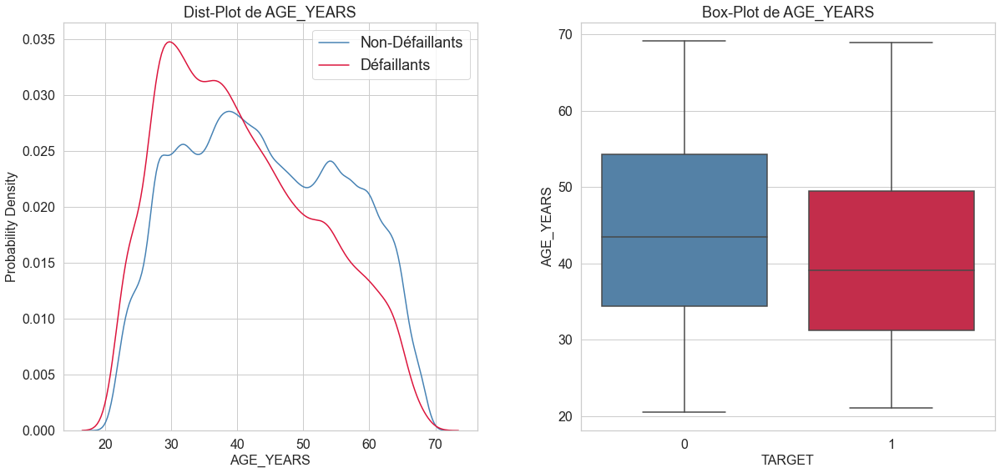

In [126]:
# Affiche les quantiles
eda_kernel_fonctions.print_percentiles(application_train, 'AGE_YEARS')
# Affiche boxplot, distplot pour l'âge
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AGE_YEARS',
                                               plots=['distplot', 'box'])
# Suppression de la variable nouvellement ajoutée
_ = application_train.pop('AGE_YEARS')

Les deux graphiques ci-dessus nous permettent de tirer quelques enseignements importants.

- Dans le distplot, nous pouvons observer le pic d'âge des défaillants se rapproche de 30 ans. De plus, à ce stade, les personnes qui ne sont pas en défaut de paiement ont un PDF assez faible. Une autre chose à noter est que la PDF de l'âge des défaillants commence un peu à gauche de celle des non défaillants, et qu'elle est également un peu plus étirée sur tous les âges. Cela signifie que les défaillants sont généralement plus jeunes que les non-défaillants.
- Le box-plot nous permet également de mieux visualiser la même chose. L'âge des défaillants est généralement inférieur à celui des non-défaillants. Tous les quantiles d'âge des défaillants sont inférieurs à ceux des non-défaillants. La valeur du 75e percentile des non-défaillants est d'environ 54 ans, tandis que celle des défaillants est proche de 49 ans.

Ces observations impliquent que les défaillants sont généralement plus jeunes que les non-défaillants.

**Variable DAYS_EMPLOYED**

**Bilan** :
***
- Cette variable indique le nombre de jours depuis le jour de la demande où le demandeur a été employé.
- Pour faciliter l'interprétation, nous allons convertir les jours en années.

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_EMPLOYED
Pecentile 0 = -17912.0
Pecentile 25 = -2760.0
Pecentile 50 = -1213.0
Pecentile 75 = -289.0
Pecentile 90 = 365243.0
Pecentile 92 = 365243.0
Pecentile 94 = 365243.0
Pecentile 96 = 365243.0
Pecentile 98 = 365243.0
Pecentile 100 = 365243.0
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
Pecentiles de la variable YEARS_EMPLOYED
Pecentile 0 = -1000.6657534246575
Pecentile 25 = 0.7917808219178082
Pecentile 50 = 3.3232876712328765
Pecentile 75 = 7.561643835616438
Pecentile 90 = 13.372602739726027
Pecentile 92 = 14.726027397260275
Pecentile 94 = 16.958904109589042
Pecentile 96 = 20.134246575342466
Pecentile 98 = 25.15068493150685
Pecentile 100 = 49.07397260273972
-------------------------------------------------------------------------------


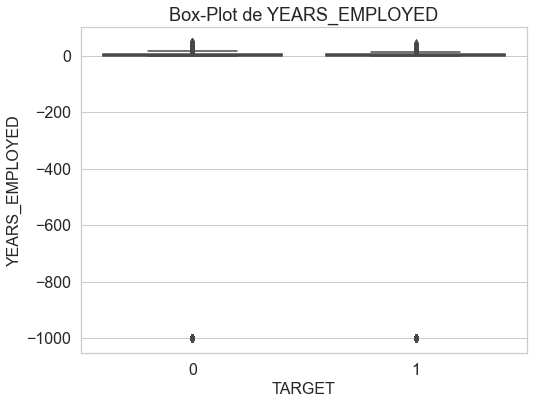

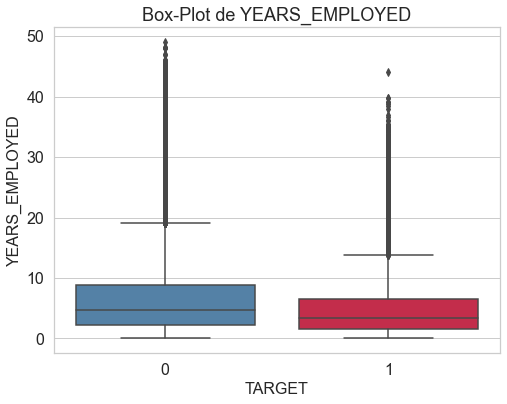

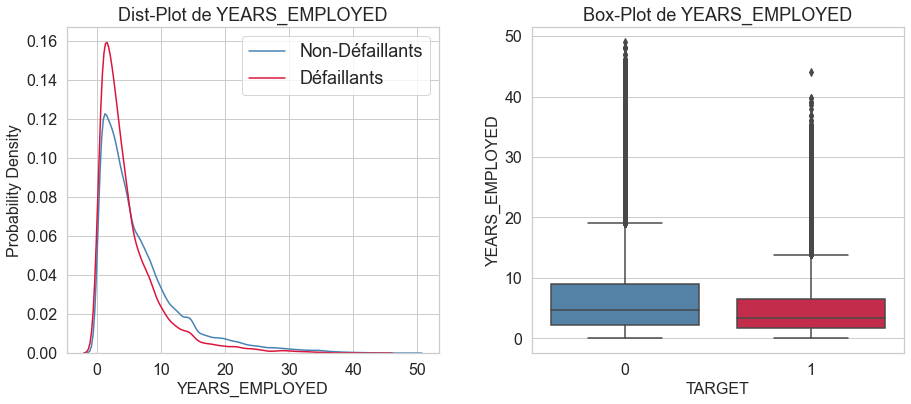

In [127]:
# Transformer en années à partir du nombre de jours
application_train['YEARS_EMPLOYED'] = \
    application_train['DAYS_EMPLOYED'] * -1 / 365
# Affiche les quantiles
eda_kernel_fonctions.print_percentiles(application_train, 'DAYS_EMPLOYED')
eda_kernel_fonctions.print_percentiles(application_train, 'YEARS_EMPLOYED')
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_EMPLOYED',
                                               plots=['box'],
                                               figsize=(8, 6))
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_EMPLOYED',
                                               plots=['box'],
                                               scale_limits=[0, 70],
                                               figsize=(8, 6))
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_EMPLOYED',
                                               plots=['distplot', 'box'],
                                               scale_limits=[0, 70],
                                               figsize=(15, 6))
# Suppression de la variable nouvellement ajoutée
_ = application_train.pop('YEARS_EMPLOYED')

**Bilan** :
***
- Nous voyons que la colonne DAYS_EMPLOYED contient quelques points de données erronés avec les valeurs 365243. Cela semble être des valeurs erronées/non sensorielles.
- Sur le boxplot, nous observons que les défaillants semblent avoir moins d'années d'emploi que les non-défaillants. Tous les quantiles 25, 50 et 75 des défaillants sont inférieurs à ceux des non-défaillants.

**Variable DAYS_REGISTRATION**

- Cette variable indique depuis combien de jours le demandeur a effectué une modification sur le formulaire informatique enregistré sur la demande.

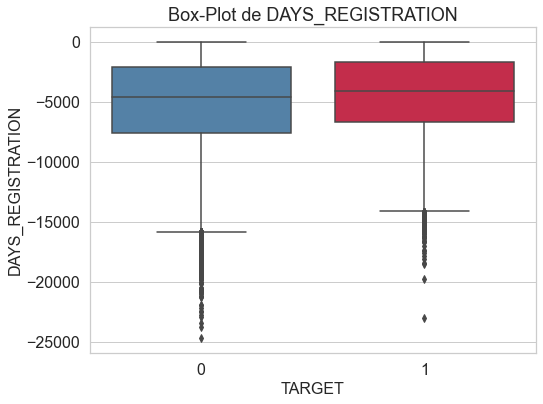

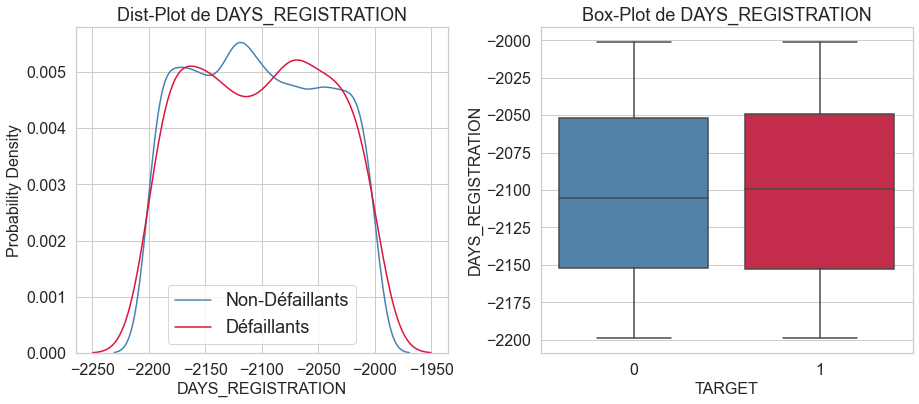

In [128]:
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DAYS_REGISTRATION',
                                               plots=['box'],
                                               figsize=(8, 6))
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DAYS_REGISTRATION',
                                               plots=['distplot', 'box'],
                                               scale_limits=[-2200, -2000],
                                               figsize=(15, 6))

**Bilan** :
***
- Le boxplot montre que le nombre de jours écoulés depuis le dernier enregistrement de modification de la demande des défaillants est généralement inférieur.
- Les non défaillants affichent un nombre de jours plus élevé pour tous les quantiles depuis qu'ils ont changé leur document d'identité.

**Variable DAYS_ID_PUBLISH**

- Cette variable indique depuis combien de jours, à partir du jour de l'enregistrement, le demandeur a changé le document d'identité avec lequel il a demandé le prêt.

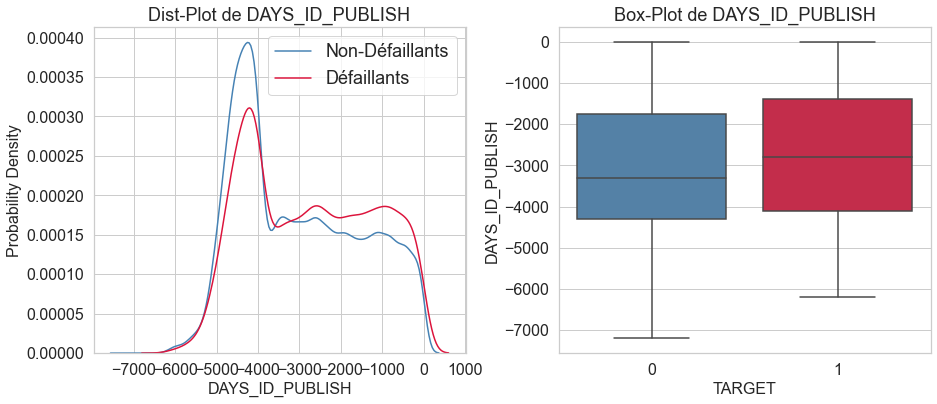

In [129]:
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DAYS_ID_PUBLISH',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan** :
***
- Le boxplot montre une tendance similaire à celle de DAYS_REGISTRATION, où le nombre de jours écoulés depuis le changement d'identité des défaillants est généralement inférieur.
- Les non défaillants affichent un nombre de jours plus élevé de dernier enregistrement de la demande pour tous les quantiles.

**Variables EXT_SOURCES_1, EXT_SOURCES_2, EXT_SOURCES_3**

- Il existe trois colonnes EXT_SOURCES, qui contiennent des valeurs comprises entre 0 et 1. 
- Il s'agit de scores normalisés provenant de différentes sources pour lesquels nous n'avons pas plus d'information.

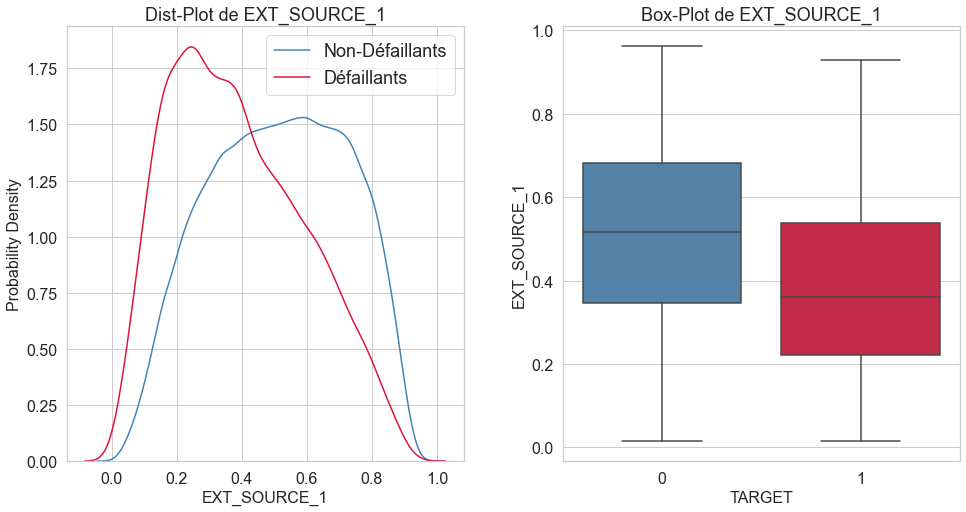

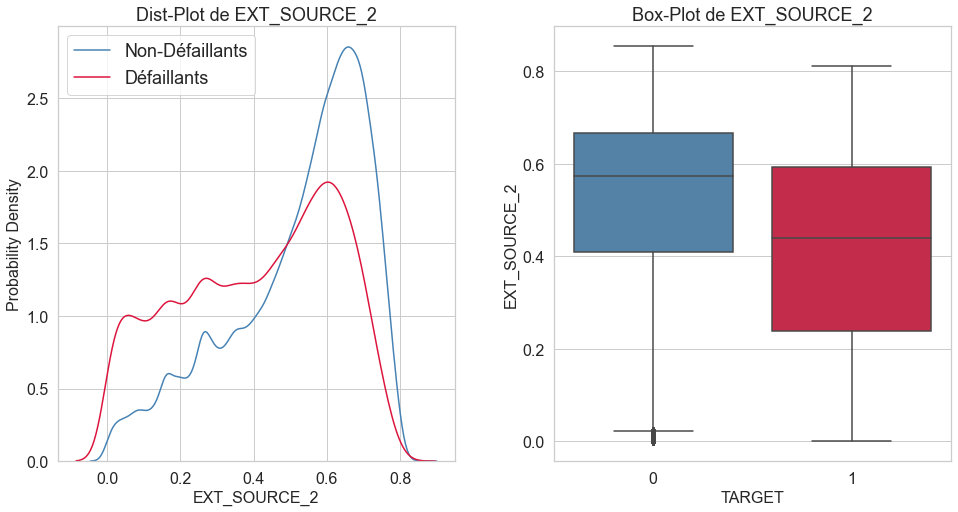

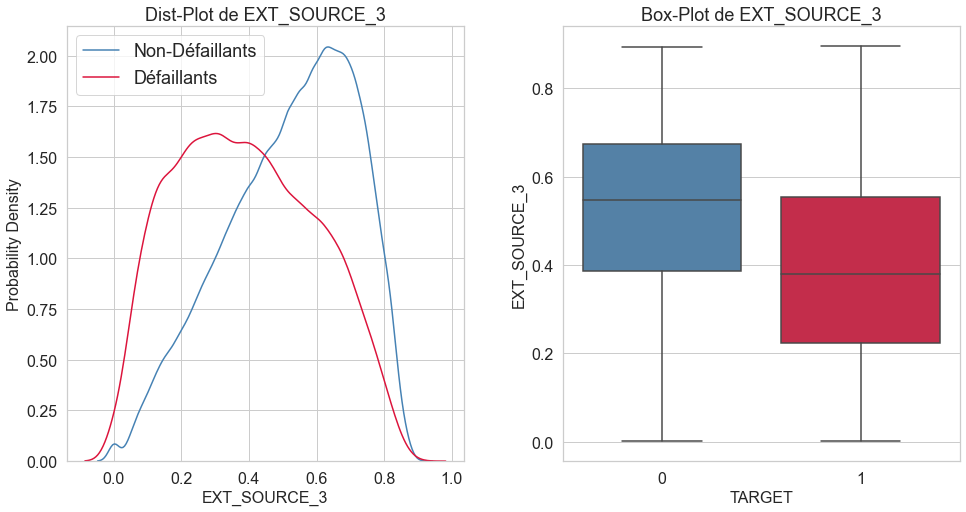

In [130]:
# Distplot et boxplot de EXT_SOURCE_1
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'EXT_SOURCE_1',
                                               plots=['distplot', 'box'],
                                               figsize=(16, 8))
# Distplot et boxplot de EXT_SOURCE_2
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'EXT_SOURCE_2',
                                               plots=['distplot', 'box'],
                                               figsize=(16, 8))
# Distplot et boxplot de EXT_SOURCE_3
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'EXT_SOURCE_3',
                                               plots=['distplot', 'box'],
                                               figsize=(16, 8))

**Bilan** :
***
À partir des trois graphiques ci-dessus, nous pouvons tirer les conclusions suivantes :

- Si nous examinons les box-plots, nous pouvons clairement voir une tendance similaire pour les trois colonnes EXT_SOURCE, à savoir que les valeurs des défaillants ont tendance à avoir des valeurs considérablement plus basses que les non-défaillants.
- Cette tendance peut également être observée avec les PDF. Les non-défaillants montrent un pic plus élevé pour les valeurs élevées de EXT_SOURCE, et les densités de probabilité sont très faibles pour les valeurs faibles. Cela implique que les non-défaillants ont généralement des valeurs élevées pour ces scores.
- Il est intéressant de noter que la valeur médiane des défaillants est presque égale ou inférieure aux valeurs du 25ème percentile des non-défaillants.
- Les variables EXT_SOURCE_1 et EXT_SOURCE_3 tendent à montrer une meilleure discrimination/séparabilité par rapport à la variable EXT_SOURCE_2.

Ces 3 variables semblent être les meilleurs pour séparer linéairement les défaillants et les non-défaillants parmi toutes les variables utilisées jusqu'à présent.

**Variable FLOORSMAX_AVG**

Cette variable décrit les scores normalisés de la moyenne du nombre maximum d'étages dans le bâtiment du demandeur.

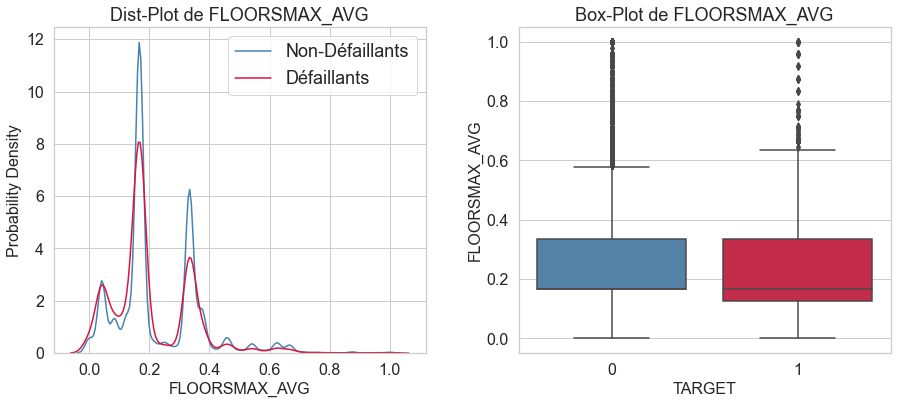

In [131]:
# Boxplot de FLOORSMAX_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMAX_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que les défaillants ont une valeur médiane de la caractéristique FLOORSMAX_AVG inférieure à celle des non-défaillants.
- Les valeurs du 75e percentile des défaillants et des non-défaillants sont plus ou moins les mêmes, mais la valeur du 25e percentile des non-défaillants est presque supérieure à la médiane des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

**Variable FLOORSMAX_MEDI**

Cette variable décrit les scores normalisés de la médiane du nombre maximum d'étages dans le bâtiment du demandeur.

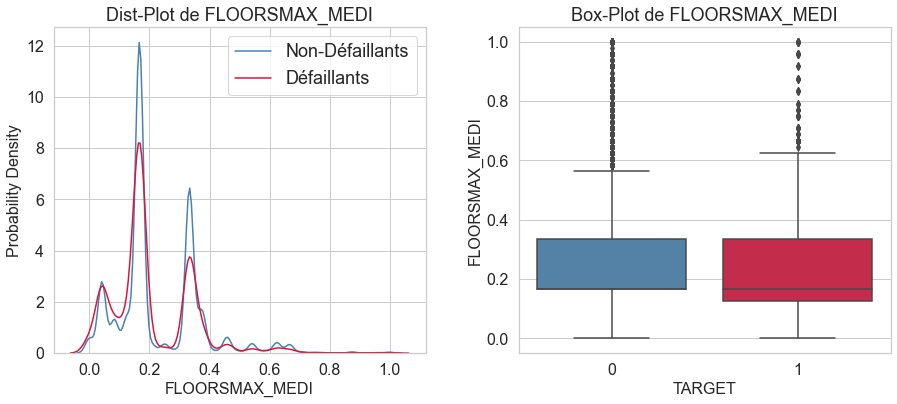

In [132]:
# Boxplot de FLOORSMAX_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMAX_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que les défaillants ont une valeur médiane de la caractéristique FLOORSMAX_MEDI inférieure à celle des non-défaillants.
- Les valeurs du 75e percentile des défaillants et des non-défaillants sont plus ou moins les mêmes, mais la valeur du 25e percentile des non-défaillants est presque supérieure à la médiane des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

**Variable FLOORSMAX_MODE**

Cette variable décrit les scores normalisés du mode du nombre maximum d'étages dans le bâtiment du demandeur

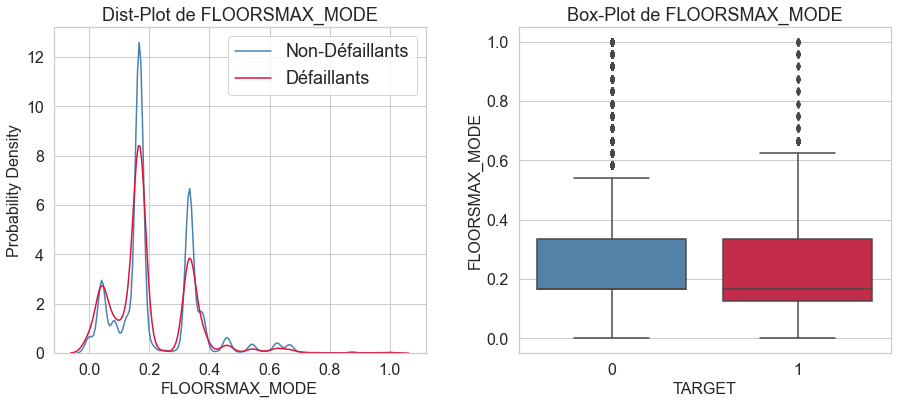

In [133]:
# Boxplot de FLOORSMAX_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMAX_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que les défaillants ont une valeur médiane de la variable FLOORSMAX_MODE inférieure à celle des non-défaillants.
- Les valeurs du 75e percentile des défaillants et des non-défaillants sont plus ou moins les mêmes, mais la valeur du 25e percentile des non-défaillants est presque supérieure à la médiane des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

**Variable FLOORSMIN_MODE**

Cette variable décrit les scores normalisés du mode du nombre minimum d'étages dans le bâtiment du demandeur.

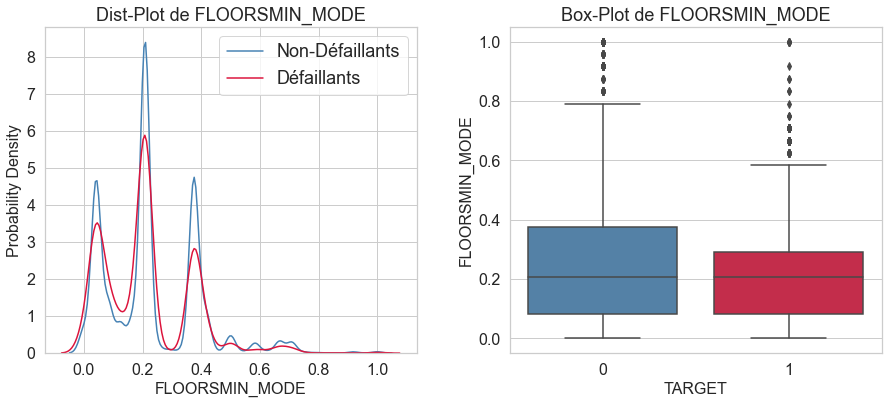

In [134]:
# Boxplot de FLOORSMIN_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMIN_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que non-défaillants ont tendance à montrer une valeur plus élevée de FLOORSMIN_MODE par rapport aux défaillants. 
- La valeur du 75ème percentile des non-défaillants est significativement plus élevée que celle du 75ème percentile des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

**Variable FLOORSMIN_AVG**

Cette variable décrit les scores normalisés de la moyenne du nombre minimum d'étages dans le bâtiment du demandeur.

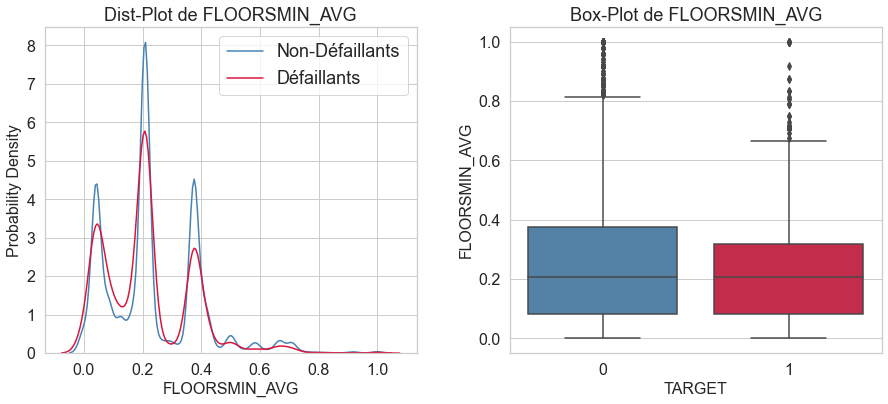

In [135]:
# Boxplot de FLOORSMIN_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMIN_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que non-défaillants ont tendance à montrer une valeur plus élevée de FLOORSMIN_AVG par rapport aux défaillants. 
- La valeur du 75ème percentile des non-défaillants est significativement plus élevée que celle du 75ème percentile des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

**Variable FLOORSMIN_MEDI**

Cette variable décrit les scores normalisés de la médiane du nombre minimum d'étages dans le bâtiment du demandeur.

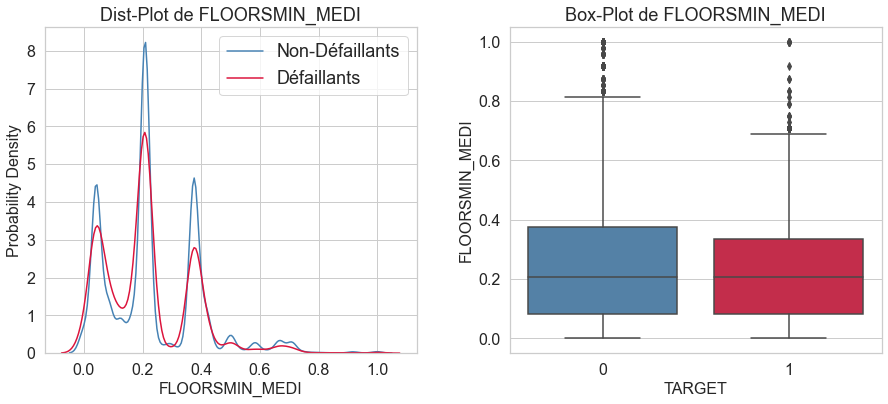

In [136]:
# Boxplot de FLOORSMIN_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'FLOORSMIN_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre que non-défaillants ont tendance à montrer une valeur plus élevée de FLOORSMIN_MEDI par rapport aux défaillants. 
- La valeur du 75ème percentile des non-défaillants est significativement plus élevée que celle du 75ème percentile des défaillants.

Cette variable pourrait être une variable importante pour départager les défaillants des non-défaillants.

**Variable AMT_GOODS_PRICE**

- Prix du bien que le demandeur a demandé (le cas échéant) sur la demande précédent.

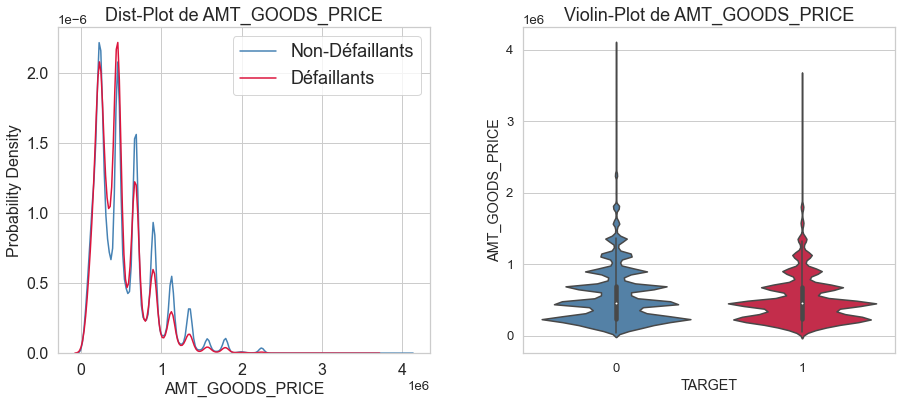

In [137]:
# Violinplot de AMT_GOODS_PRICE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_GOODS_PRICE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable CNT_CHILDREN**

- Nombre d'enfants du demandeur.

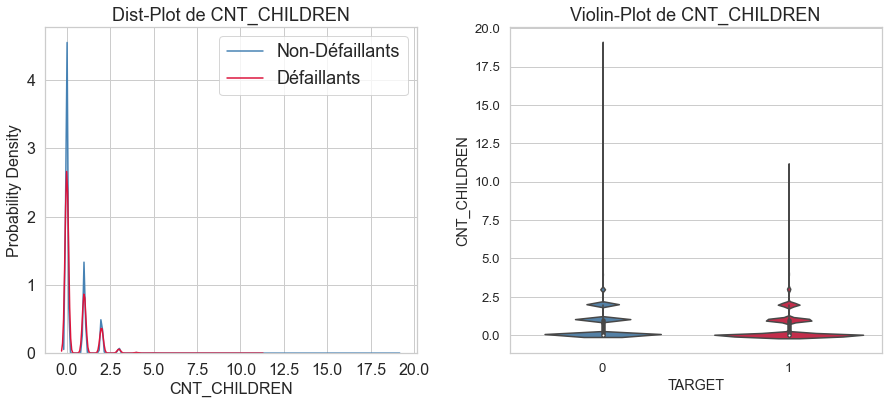

In [138]:
# Violinplot de CNT_CHILDREN
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'CNT_CHILDREN',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_INCOME_TOTAL**

- Revenu du demandeur.

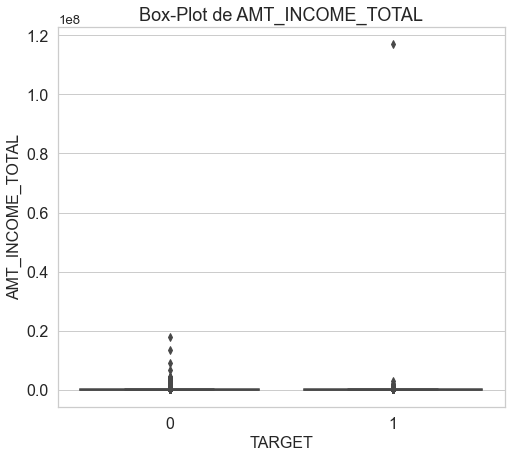

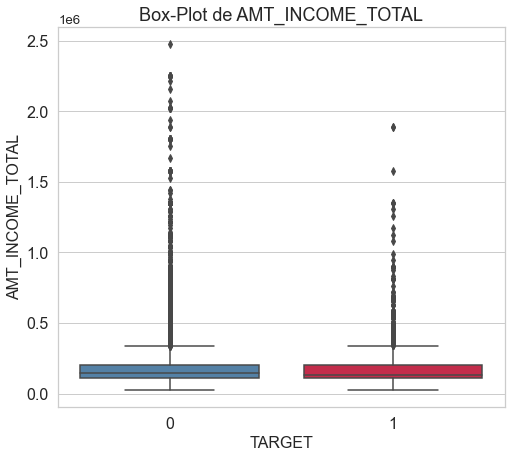

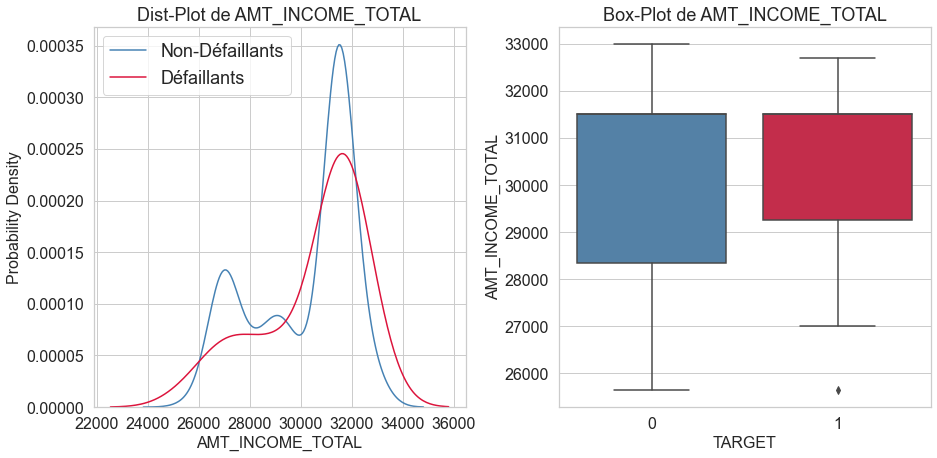

In [139]:
# Boxplot de CNT_CHILDREN
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_INCOME_TOTAL',
                                               plots=['box'],
                                               figsize=(8, 7))
# Zoom hors outlier
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_INCOME_TOTAL',
                                               plots=['box'],
                                               figsize=(8, 7),
                                               scale_limits=[0, 25e5])
# Zoom hors outlier
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_INCOME_TOTAL',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 7),
                                               scale_limits=[0, 33e3])

**Bilan**:
***
- Les défaillants n'ont pas forcément plus de revenus que les défaillants, les quantiles 75 sont identiques, les quantiles 25 des défaillants est plus élevé que le quantile 25 des défaillants.

Cette variable ne sera pas déterminante pour départager les non-défaillants des défaillants.

**Variable AMT_CREDIT**

- Montant du crédit du prêt.

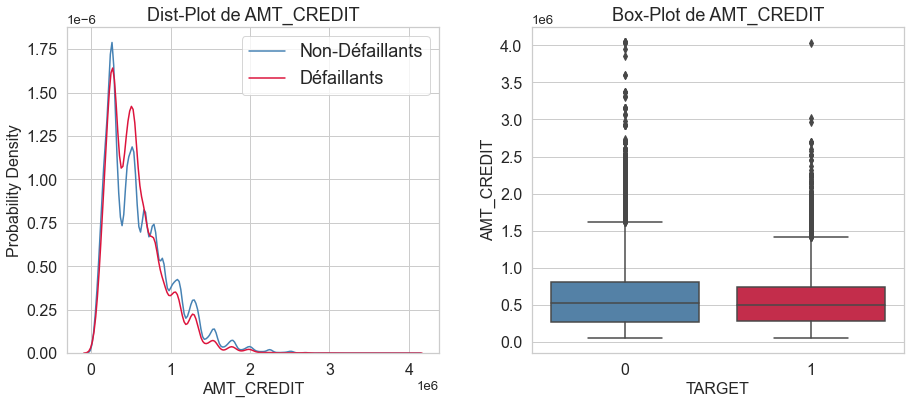

In [140]:
# Boxplot de AMT_CREDIT
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_CREDIT',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants. Les montants de crédit demandés sont un peu plus élevé pour les non défaillants surtout pour les outliers.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_ANNUITY**

- Annuité de prêt.

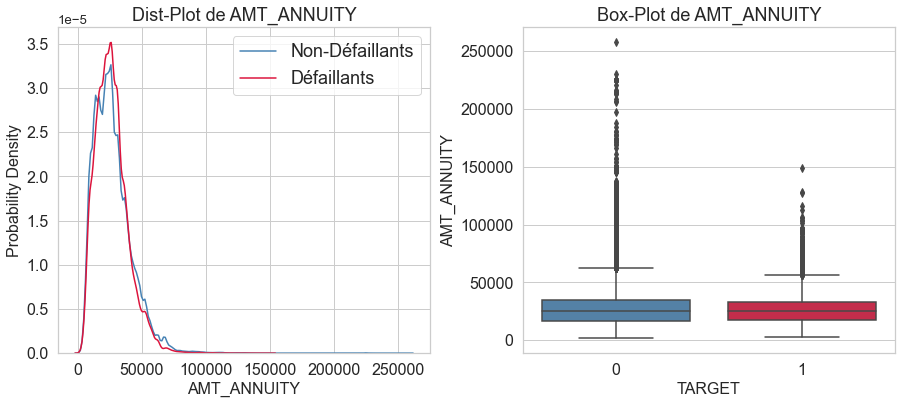

In [141]:
# Boxplot de AMT_ANNUITY
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_ANNUITY',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable REGION_POPULATION_RELATIVE**

- Population normalisée de la région où vit le demandeur (un chiffre plus élevé signifie que le demandeur vit dans une région plus peuplée).

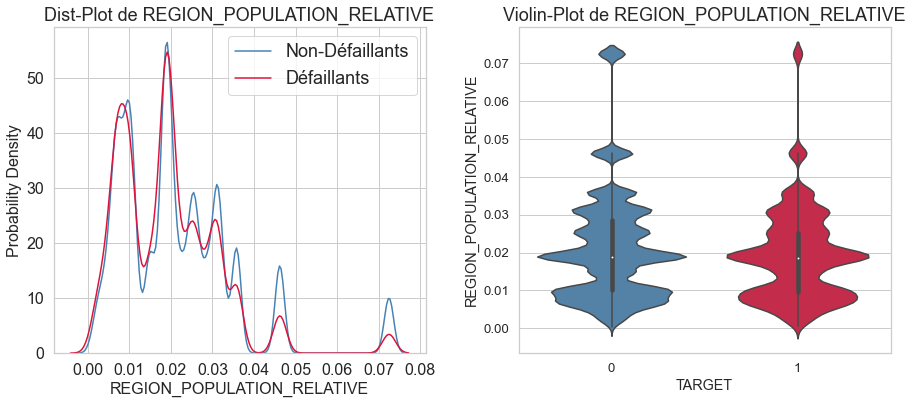

In [142]:
# Violinplot de AMT_ANNUITY
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'REGION_POPULATION_RELATIVE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence sur la Population normalisée de la région où vit le demandeur entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable OWN_CAR_AGE**

- Âge de la voiture du demandeur.

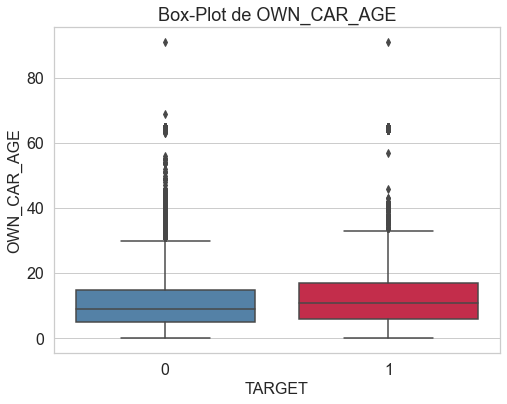

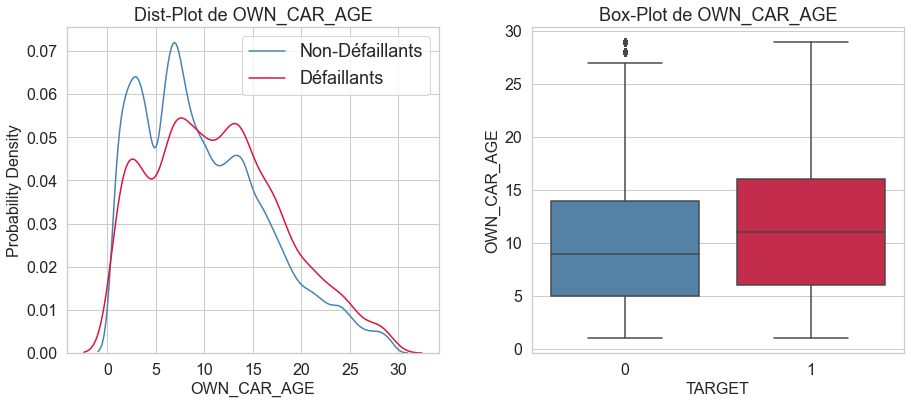

In [143]:
# Boxplot de OWN_CAR_AGE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'OWN_CAR_AGE',
                                               plots=['box'],
                                               figsize=(8, 6))
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'OWN_CAR_AGE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6),
                                               scale_limits=[0, 30])

**Bilan**:
***
- Les défaillants ont des voitures plus anciennes que les non-défaillants.

Cette variable pourra être utile pour départager les défaillants  des non-défaillants.

**Variable CNT_FAM_MEMBERS**

De combien de membres est constituée la famille du demandeur?

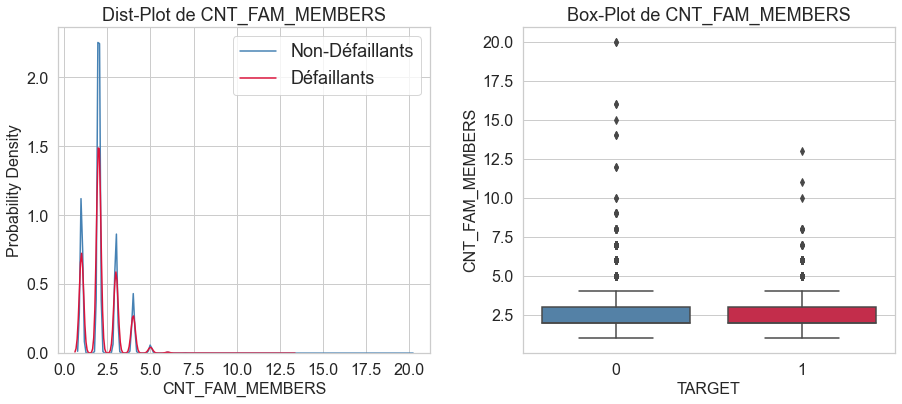

In [144]:
# Boxplot de CNT_FAM_MEMBERS
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'CNT_FAM_MEMBERS',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence sur le nombre de personnes composant le foyer entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable REGION_RATING_CLIENT**

- Notre évaluation de la région où vit le demandeur (1 ou 2 ou 3).

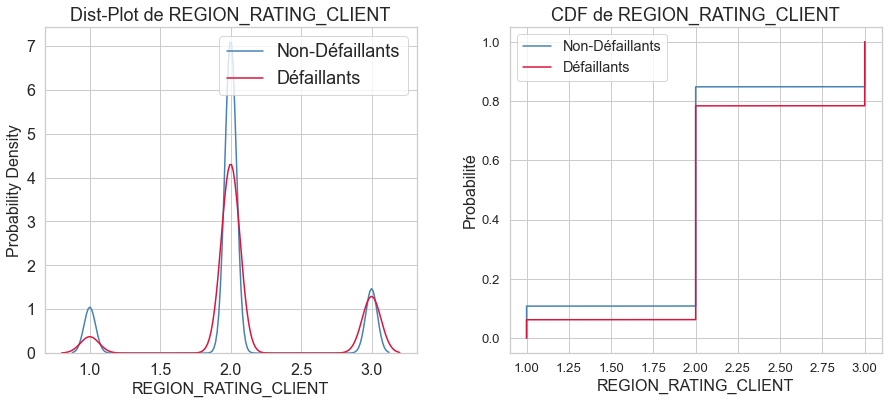

In [145]:
# CDF de REGION_RATING_CLIENT
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'REGION_RATING_CLIENT',
                                               plots=['distplot', 'CDF'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les non-défaillants ont tendance à être avoir une meilleure note sur l'évaluation où vivent les demandeurs que les défaillants mais la nuance n'est pas forte pour pouvoir être déterminante sur le partage des défaillants et des non-défaillants. 

**Variable REG_REGION_NOT_LIVE_REGION**

Indicateur si l'adresse permanente du demandeur ne correspond pas à l'adresse de contact au niveau de la région :
- **1** : adresses différents, 
- **0** : adresses identiques.

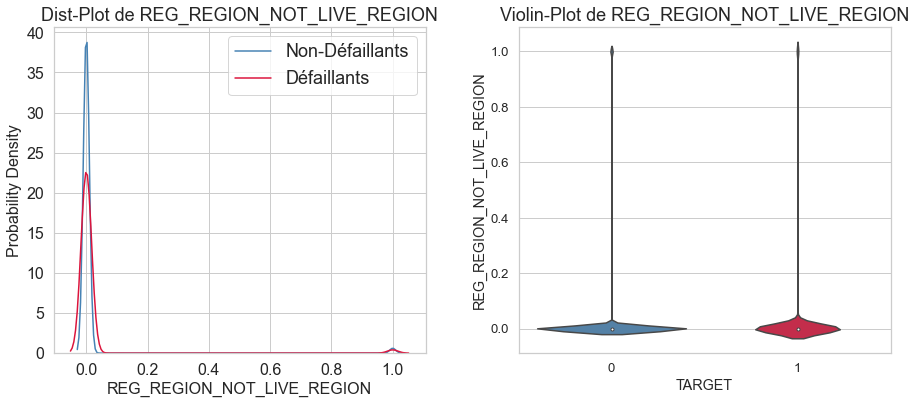

In [146]:
# Violinplot de REG_REGION_NOT_LIVE_REGION
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'REG_REGION_NOT_LIVE_REGION',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable REG_REGION_NOT_WORK_REGION**

Indicateur si l'adresse permanente du demandeur ne correspond pas à l'adresse professionnelle au niveau de la région.
- **1** : adresses différents, 
- **0** : adresses identiques.

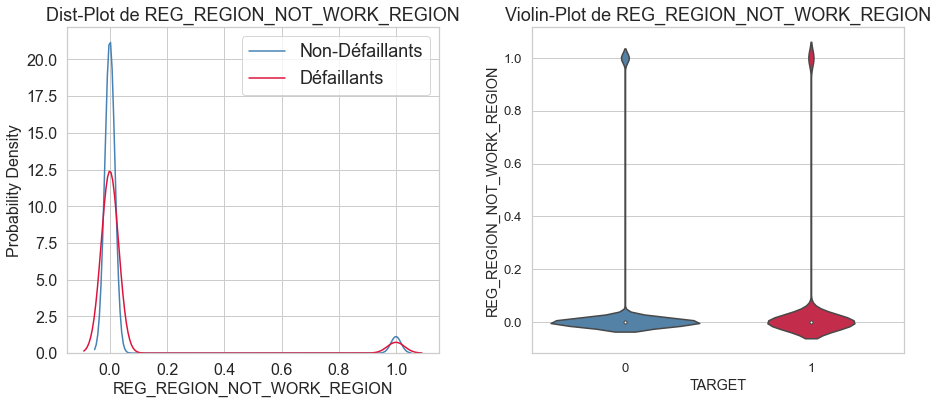

In [147]:
# Violinplot de REG_REGION_NOT_WORK_REGION
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'REG_REGION_NOT_WORK_REGION',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable LIVE_REGION_NOT_WORK_REGION**

Indicateur si l'adresse de contact du demandeur ne correspond pas à l'adresse de travail au niveau de la région :
- **1** : adresses différents, 
- **0** : adresses identiques.

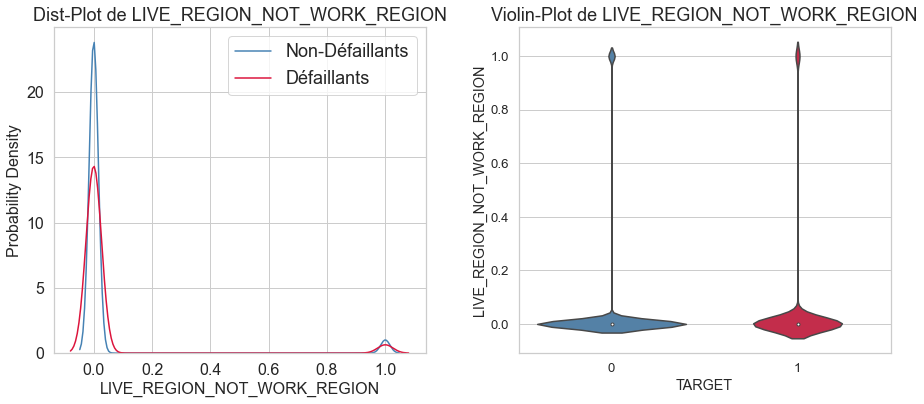

In [148]:
# Violinplot de LIVE_REGION_NOT_WORK_REGION
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVE_REGION_NOT_WORK_REGION',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable APARTMENTS_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de l'appartement.

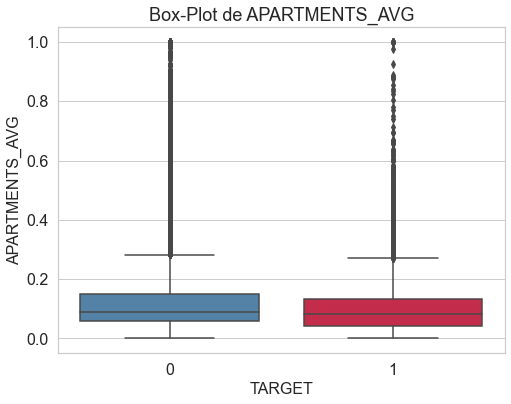

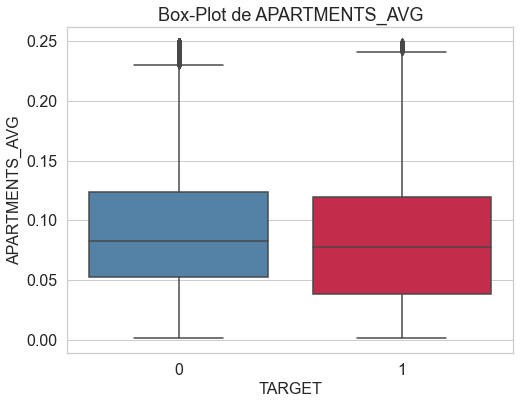

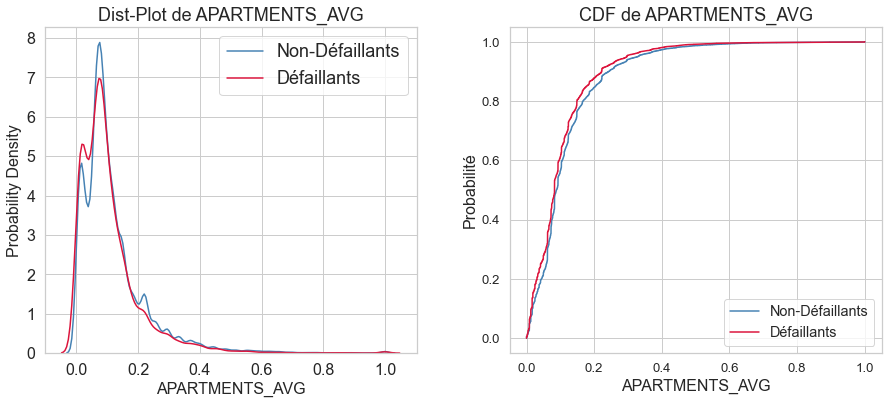

In [149]:
# Boxplot de APARTMENTS_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'APARTMENTS_AVG',
                                               plots=['box'],
                                               figsize=(8, 6))
# Zoom
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'APARTMENTS_AVG',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[0, 0.25])
# CDF
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'APARTMENTS_AVG',
                                               plots=['distplot', 'CDF'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre une tendance la taille moyenne des appartements des défaillants est généralement inférieure à celle des non-défaillants.
- Les défaillants vivent dans des appartements de taille moyenne plus petite que les non-défaillants (cf graphique CDF).

Mais cette différence est peu importante et la variable ne sera pas très utile pour départager les demandeurs non-défaillants des défaillants.

**Variable APARTMENTS_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur du mode de l'appartement.

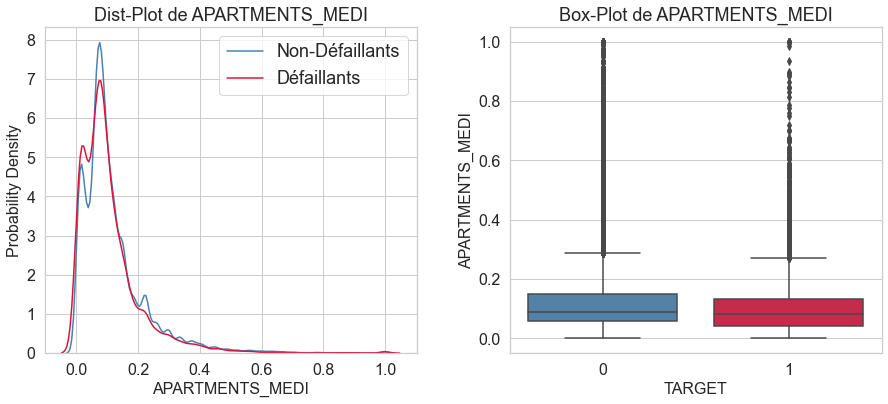

In [150]:
# Boxplot de APARTMENTS_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'APARTMENTS_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre une tendance le mode des appartements des défaillants est généralement inférieure à celle des non-défaillants.

Mais cette différence est peu importante et la variable ne sera pas très utile pour départager les demandeurs non-défaillants des défaillants.

**Variable APARTMENTS_MODE**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de l'appartement.

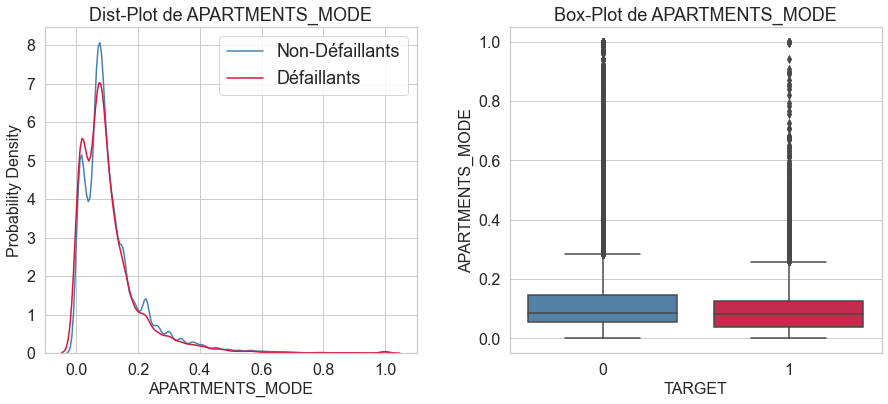

In [151]:
# Boxplot de APARTMENTS_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'APARTMENTS_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Le boxplot montre une tendance le mode des appartements des défaillants est généralement inférieure à celle des non-défaillants.

Mais cette différence est peu importante et la variable ne sera pas très utile pour départager les demandeurs non-défaillants des défaillants.

**Variable BASEMENTAREA_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de la surface habitable.

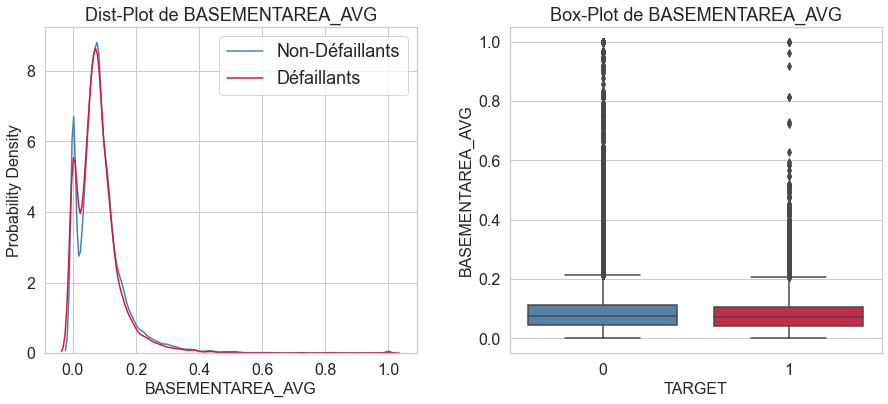

In [152]:
# Boxplot de BASEMENTAREA_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'BASEMENTAREA_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable BASEMENTAREA_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface du bâtiment.

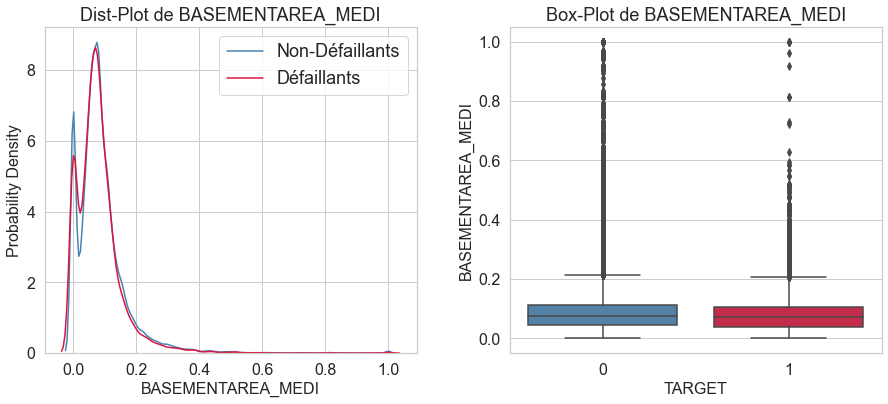

In [153]:
# Boxplot de BASEMENTAREA_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'BASEMENTAREA_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable BASEMENTAREA_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface du bâtiment.

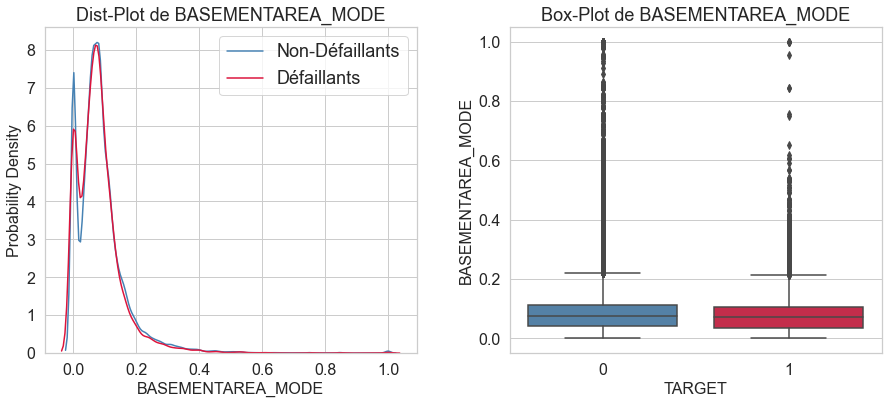

In [154]:
# Boxplot de BASEMENTAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'BASEMENTAREA_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable YEARS_BEGINEXPLUATATION_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de l'âge moyen de début d'exploitation de l'immeuble.

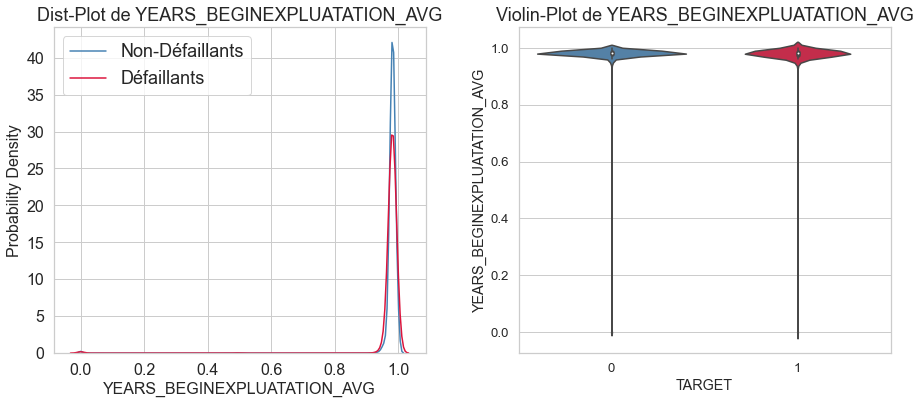

In [155]:
# Violinplot de YEARS_BEGINEXPLUATATION_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BEGINEXPLUATATION_AVG',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable YEARS_BEGINEXPLUATATION_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode de l'âge de début d'exploitation de l'immeuble.

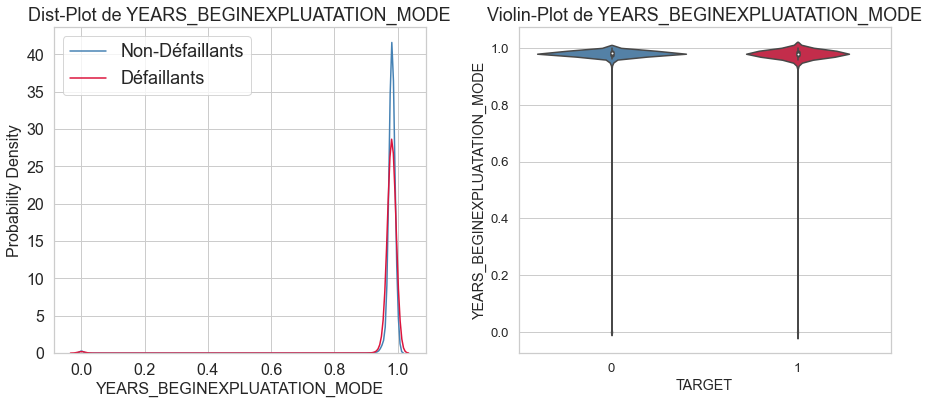

In [156]:
# Violinplot de YEARS_BEGINEXPLUATATION_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BEGINEXPLUATATION_MODE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable YEARS_BEGINEXPLUATATION_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de l'âge de début d'exploitation de l'immeuble.

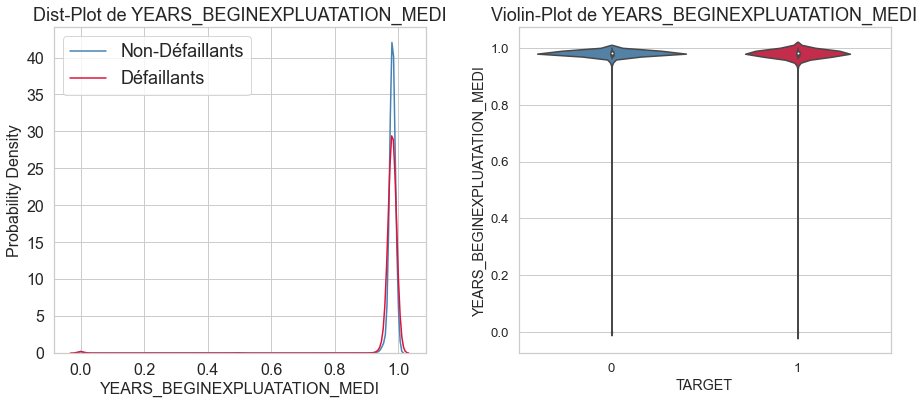

In [157]:
# Violinplot de YEARS_BEGINEXPLUATATION_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BEGINEXPLUATATION_MEDI',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable YEARS_BUILD_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de l'âge moyen de l'immeuble.

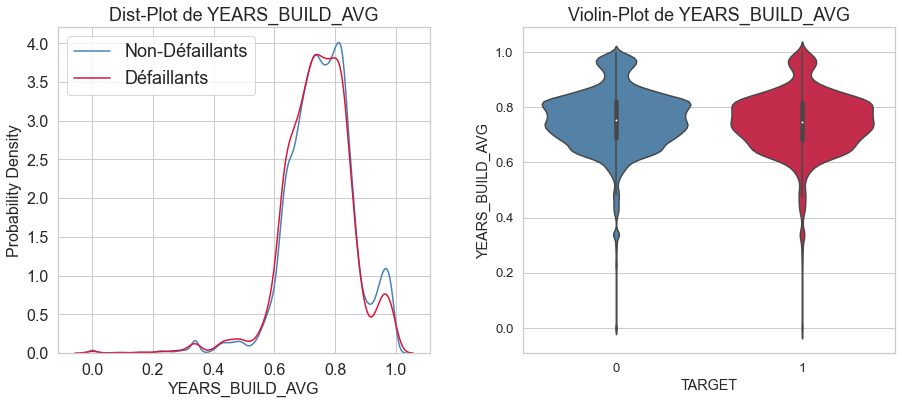

In [158]:
# Violinplot de YEARS_BUILD_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BUILD_AVG',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable YEARS_BUILD_MODE**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de l'âge de l'immeuble.

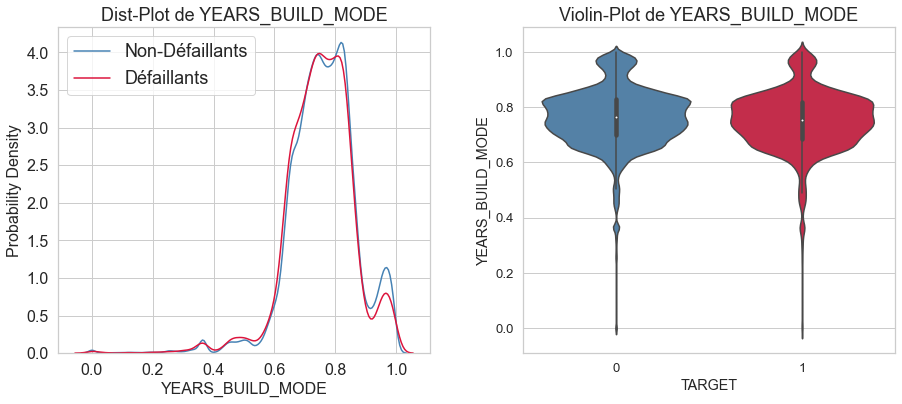

In [159]:
# Violinplot de YEARS_BUILD_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BUILD_MODE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable YEARS_BUILD_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur du mode de l'âge de l'immeuble.

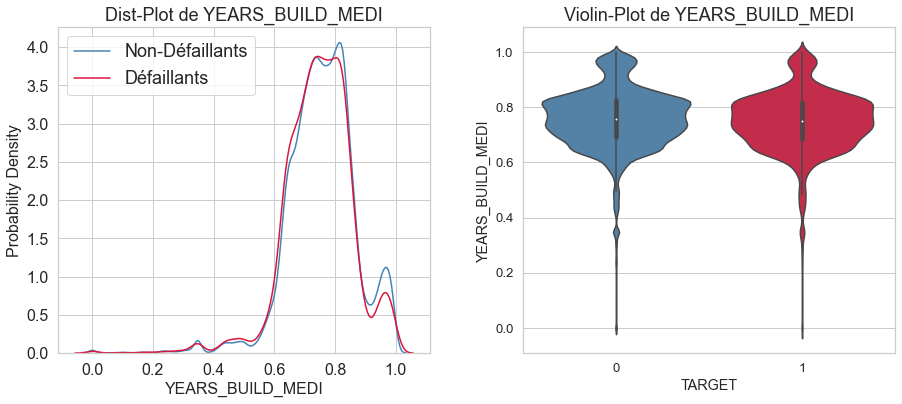

In [160]:
# Violinplot de YEARS_BUILD_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'YEARS_BUILD_MEDI',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable COMMONAREA_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de la surface commune.

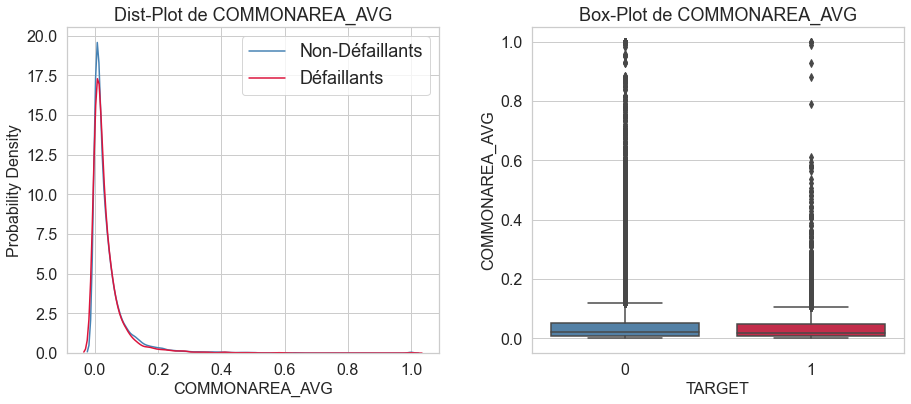

In [161]:
# Boxplot de COMMONAREA_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'COMMONAREA_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable COMMONAREA_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface commune.

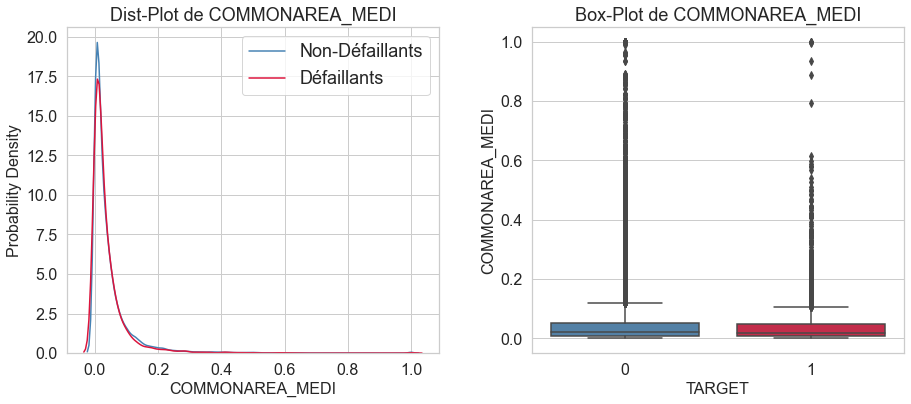

In [162]:
# Boxplot de COMMONAREA_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'COMMONAREA_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable COMMONAREA_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface commune.

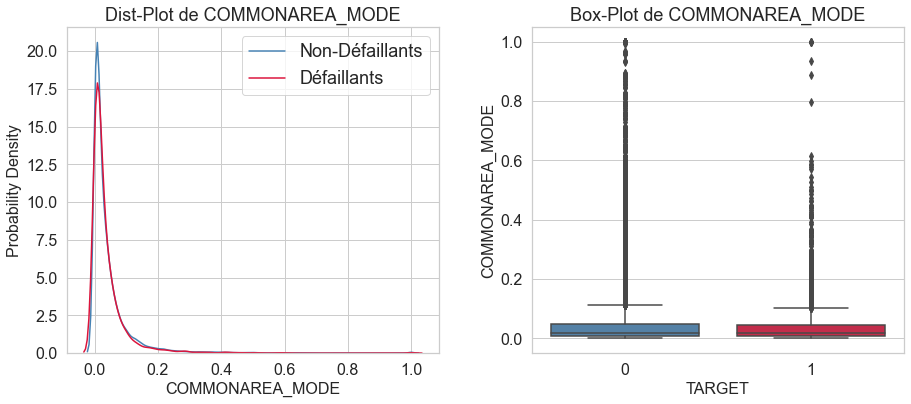

In [163]:
# Boxplot de COMMONAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'COMMONAREA_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable ELEVATORS_AVG**

Informations normalisées sur l'immeuble où vit le demandeur du nombre d'étages moyens.

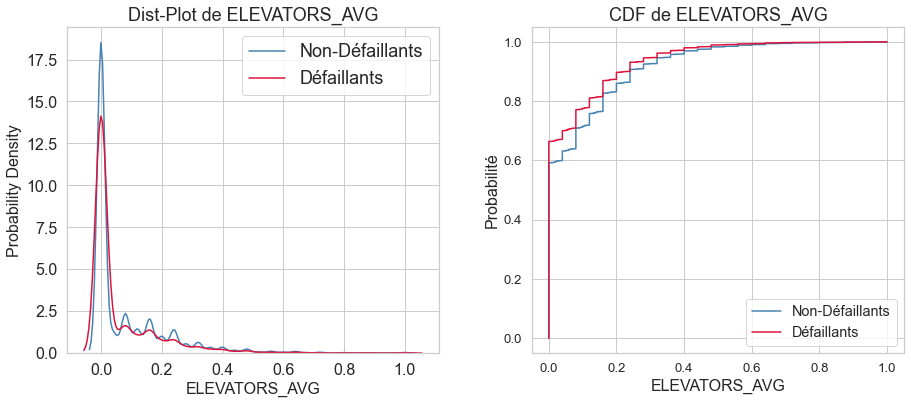

In [164]:
# CDF de ELEVATORS_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ELEVATORS_AVG',
                                               plots=['distplot', 'CDF'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les demandeurs défaillants habitent des maisons ou appartements avec plus d'étages que les non-défaillants, mais cet écart est faible.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable ELEVATORS_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode du nombre d'étages.

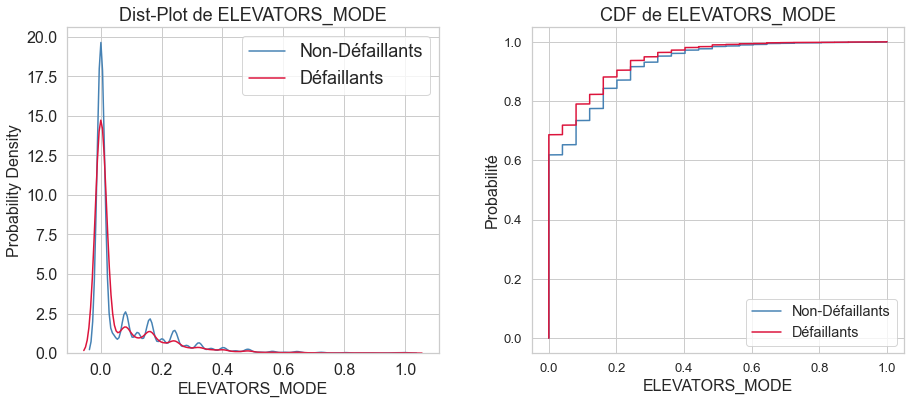

In [165]:
# CDF de ELEVATORS_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ELEVATORS_MODE',
                                               plots=['distplot', 'CDF'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les demandeurs défaillants habitent des maisons ou appartements avec plus d'étages que les non-défaillants, mais cet écart est faible.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable ELEVATORS_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane du nombre d'étages.

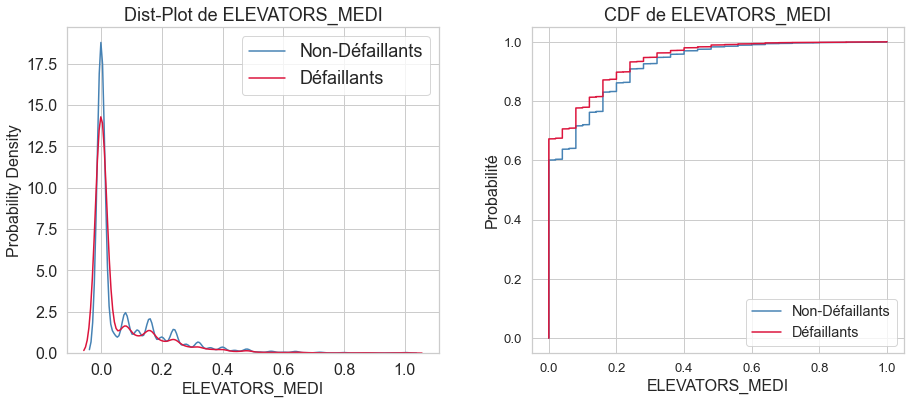

In [166]:
# CDF de ELEVATORS_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ELEVATORS_MEDI',
                                               plots=['distplot', 'CDF'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les demandeurs défaillants habitent des maisons ou appartements avec plus d'étages que les non-défaillants, mais cet écart est faible.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable ENTRANCES_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de la moyenne du nombre d'entrées.

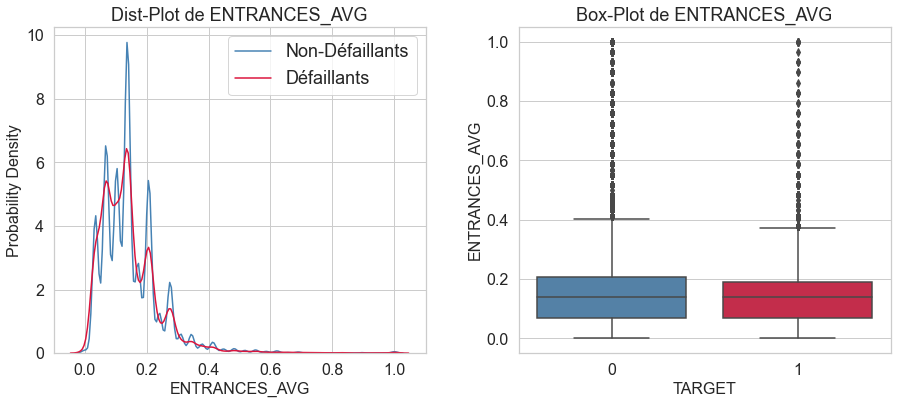

In [167]:
# Boxplot de ENTRANCES_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ENTRANCES_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***

**Variable ENTRANCES_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode du nombre d'entrées.

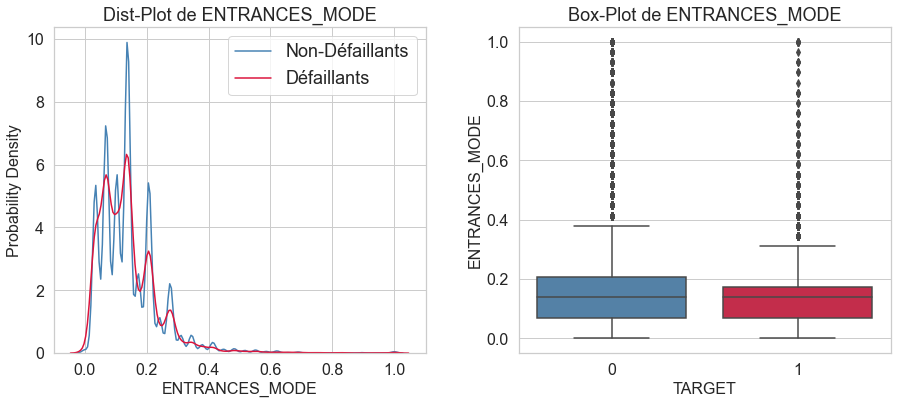

In [168]:
# Boxplot de ENTRANCES_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ENTRANCES_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable ENTRANCES_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane du nombre d'entrées.

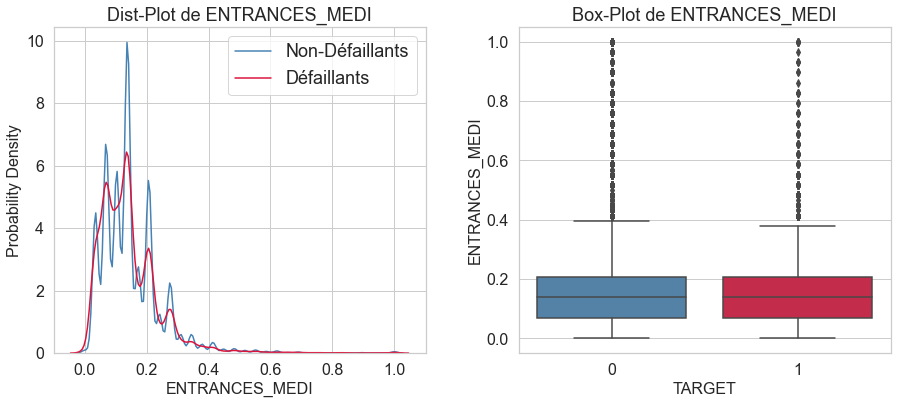

In [169]:
# Boxplot de ENTRANCES_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'ENTRANCES_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable LANDAREA_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de la surface du terrain.

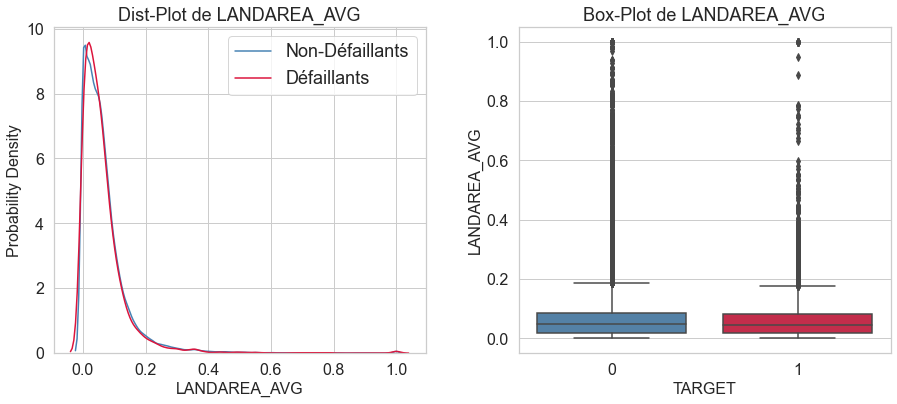

In [170]:
# Boxplot de LANDAREA_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LANDAREA_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable LANDAREA_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface du terrain.

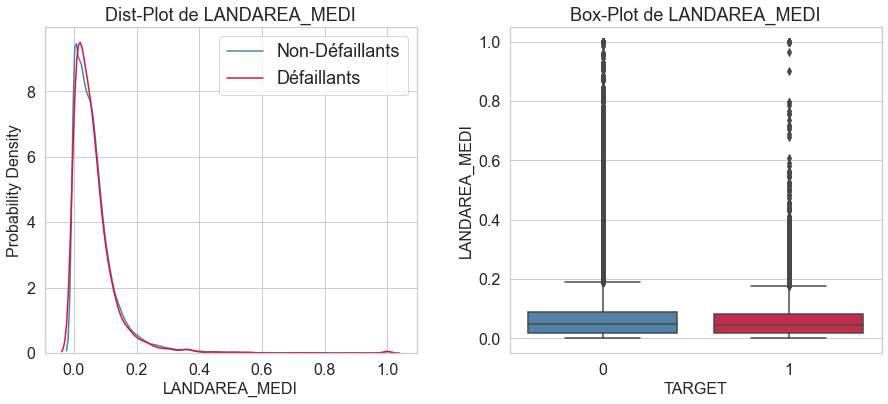

In [171]:
# Boxplot de LANDAREA_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LANDAREA_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable LANDAREA_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface du terrain.

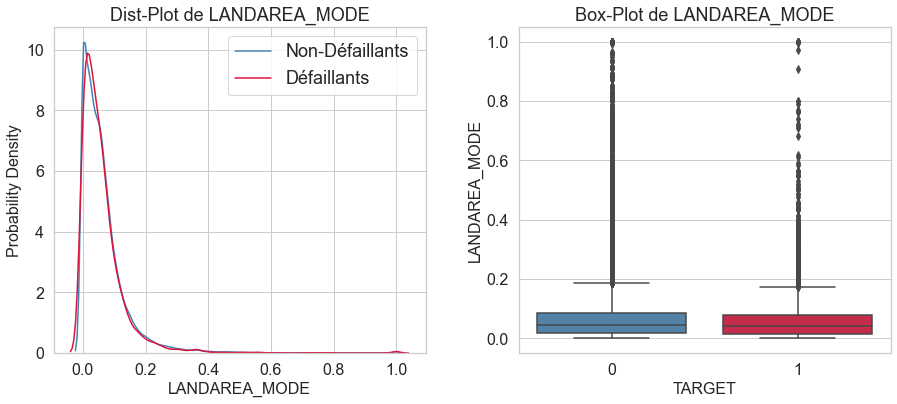

In [172]:
# Boxplot de LANDAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LANDAREA_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable LIVINGAPARTMENTS_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de l'appartement.

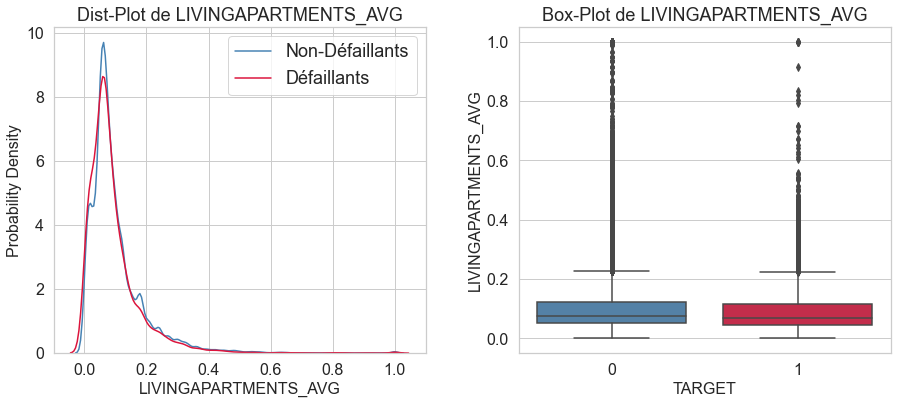

In [173]:
# Boxplot de LIVINGAPARTMENTS_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAPARTMENTS_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable LIVINGAPARTMENTS_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode de l'appartement.

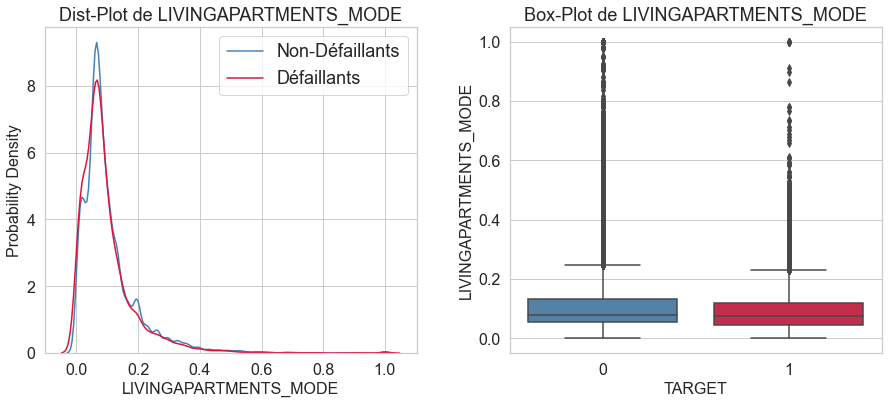

In [174]:
# Boxplot de LIVINGAPARTMENTS_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAPARTMENTS_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable LIVINGAPARTMENTS_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de l'appartement.

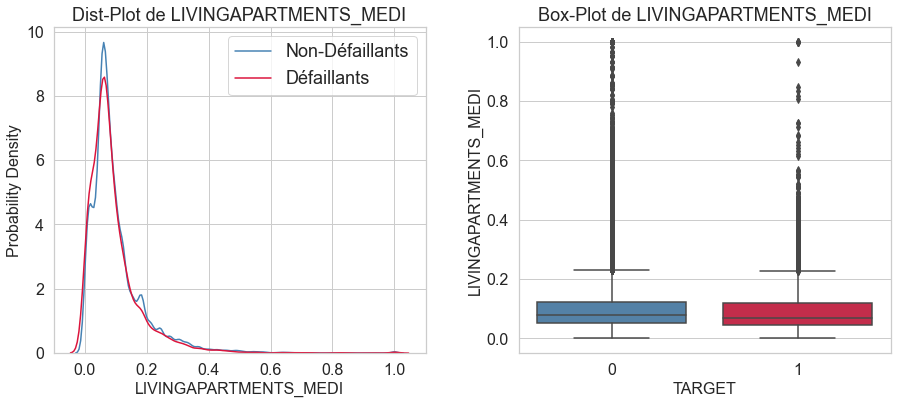

In [175]:
# Boxplot de LIVINGAPARTMENTS_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAPARTMENTS_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable LIVINGAREA_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de la surface habitable de l'appartement.

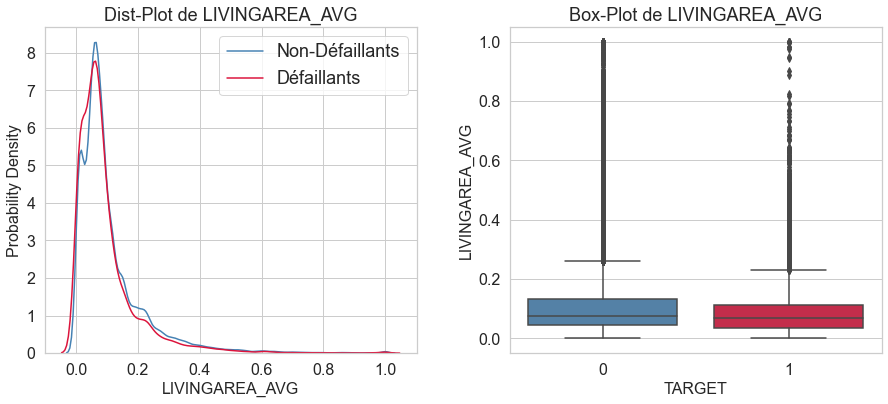

In [176]:
# Boxplot de LIVINGAREA_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAREA_AVG',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.


Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable LIVINGAREA_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface habitable de l'appartement.

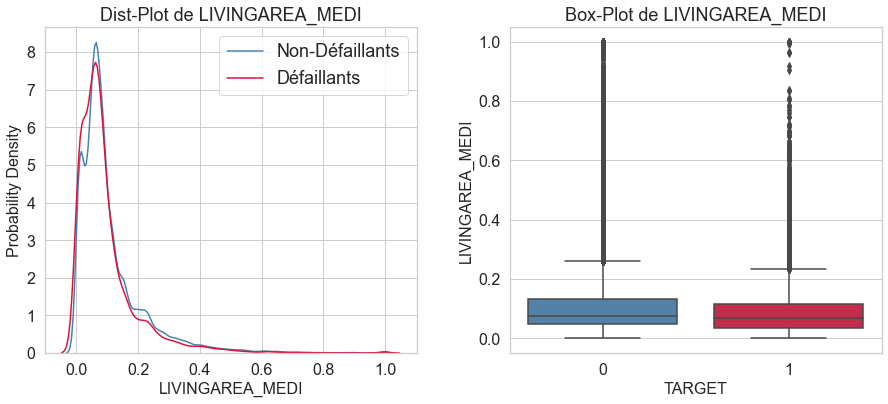

In [185]:
# Boxplot de LIVINGAPARTMENTS_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAREA_MEDI',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.**Bilan**:
***

**Variable LIVINGAREA_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface habitable de l'appartement.

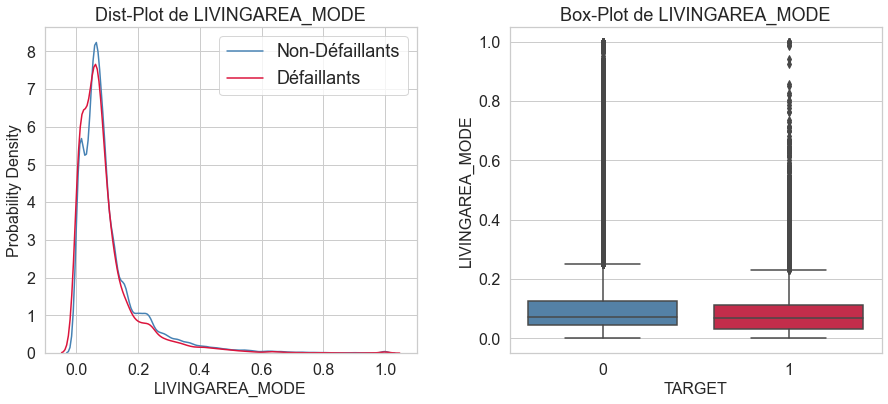

In [186]:
# Boxplot de LIVINGAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'LIVINGAREA_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable NONLIVINGAPARTMENTS_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de la taille moyenne de la surface commune de l'appartement.

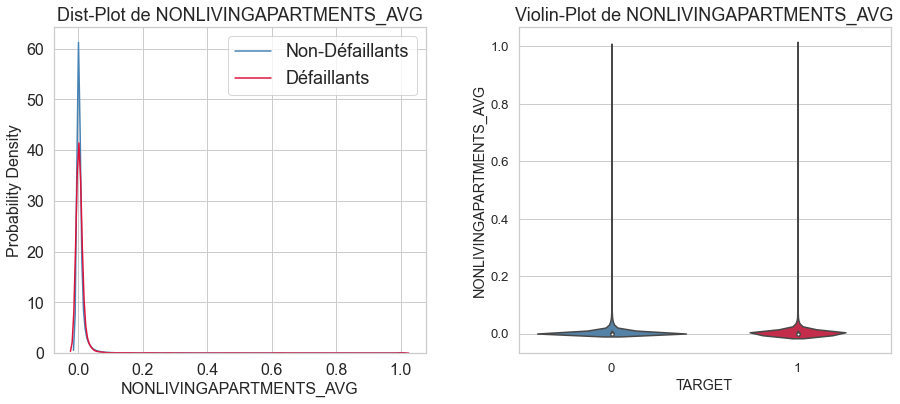

In [187]:
# Violinplot de NONLIVINGAPARTMENTS_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAPARTMENTS_AVG',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable NONLIVINGAPARTMENTS_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface commune de l'appartement.

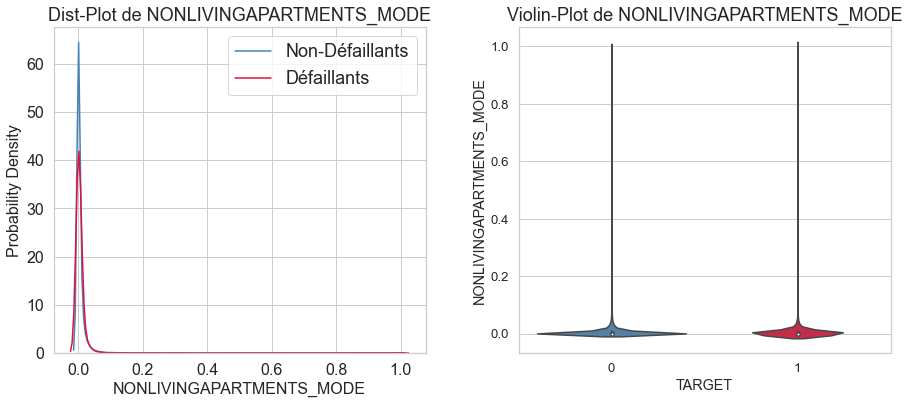

In [188]:
# Violinplot de NONLIVINGAPARTMENTS_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAPARTMENTS_MODE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable NONLIVINGAPARTMENTS_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface commune de l'appartement.

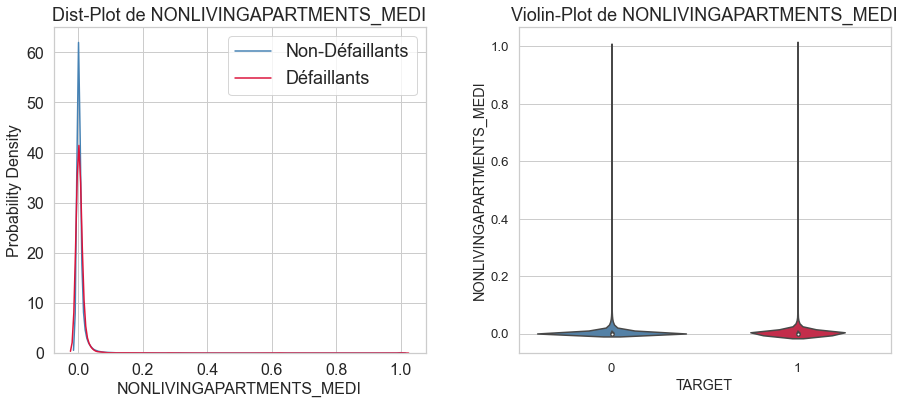

In [189]:
# Violinplot de NONLIVINGAPARTMENTS_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAPARTMENTS_MEDI',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable NONLIVINGAREA_AVG**

Informations normalisées sur l'immeuble où vit le demandeur de la moyenne de la surface habitable de l'appartement.

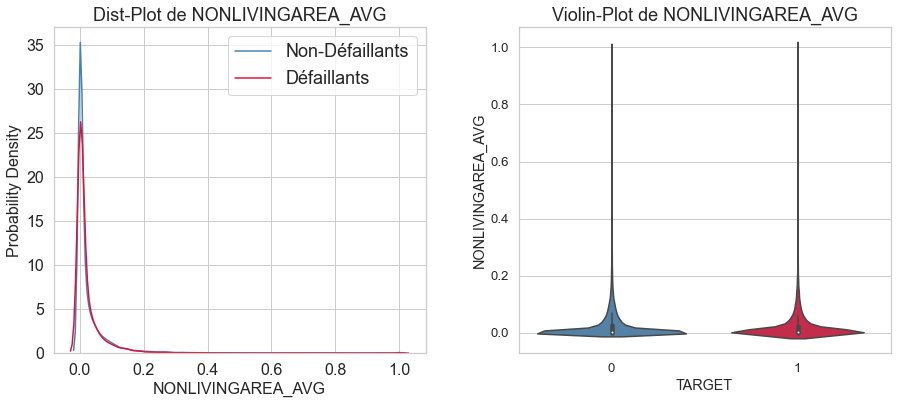

In [190]:
# Violinplot de NONLIVINGAREA_AVG
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAREA_AVG',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable NONLIVINGAREA_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface habitable de l'appartement.

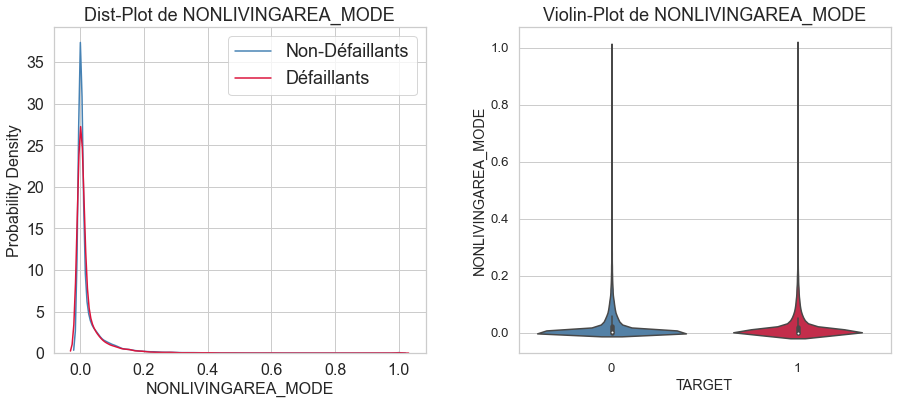

In [191]:
# Violinplot de NONLIVINGAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAREA_MODE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable NONLIVINGAREA_MEDI**

Informations normalisées sur l'immeuble où vit le demandeur de la médiane de la surface habitable de l'appartement.

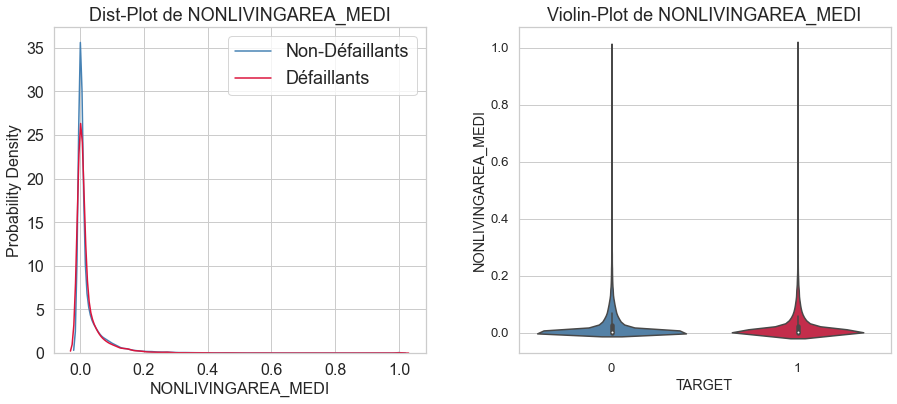

In [192]:
# Violinplot de NONLIVINGAREA_MEDI
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'NONLIVINGAREA_MEDI',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable TOTALAREA_MODE**

Informations normalisées sur l'immeuble où vit le demandeur du mode de la surface totale.

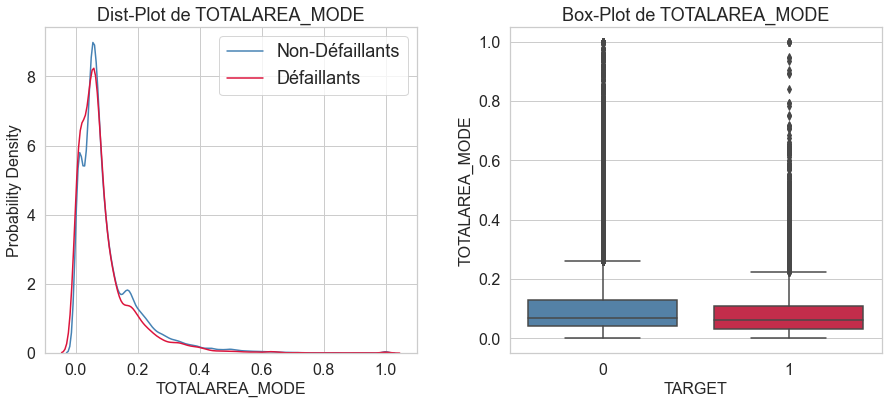

In [193]:
# Boxplot de TOTALAREA_MODE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'TOTALAREA_MODE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable OBS_30_CNT_SOCIAL_CIRCLE**

Combien d'observations de l'environnement social du demandeurs avec des défauts observables de 30 DPD (jours de retard) ?

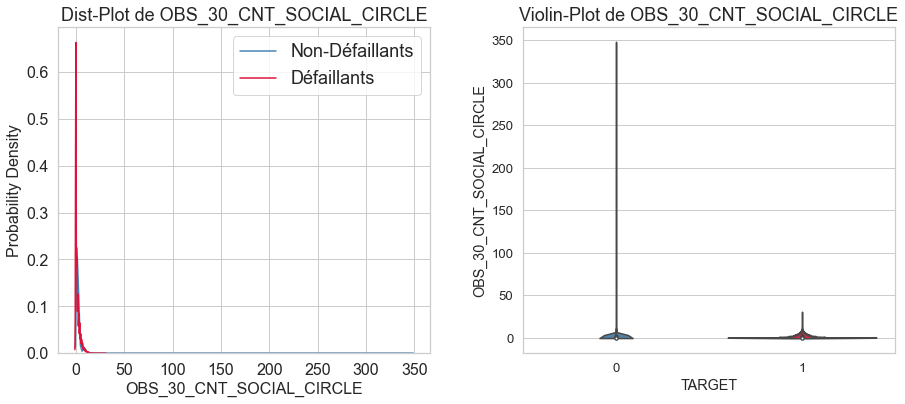

In [194]:
# Violinplot de OBS_30_CNT_SOCIAL_CIRCLE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'OBS_30_CNT_SOCIAL_CIRCLE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable DEF_30_CNT_SOCIAL_CIRCLE**

Combien d'observations de l'environnement social du demandeur ont fait l'objet d'un défaut de paiement à 30 DPD (jours d'arriérés) ?

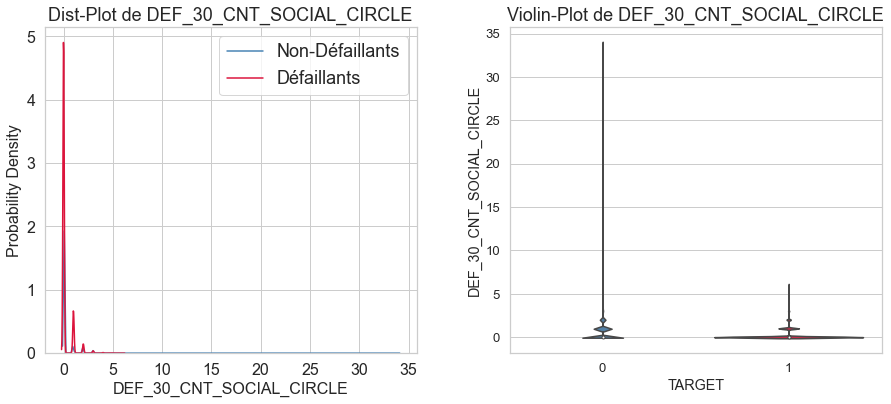

In [195]:
# Violinplot de DEF_30_CNT_SOCIAL_CIRCLE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DEF_30_CNT_SOCIAL_CIRCLE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.**Bilan**:
***

**Variable OBS_60_CNT_SOCIAL_CIRCLE**

Combien d'observations de l'environnement social du demandeur avec des défauts observables de 60 DPD (jours de retard) ?

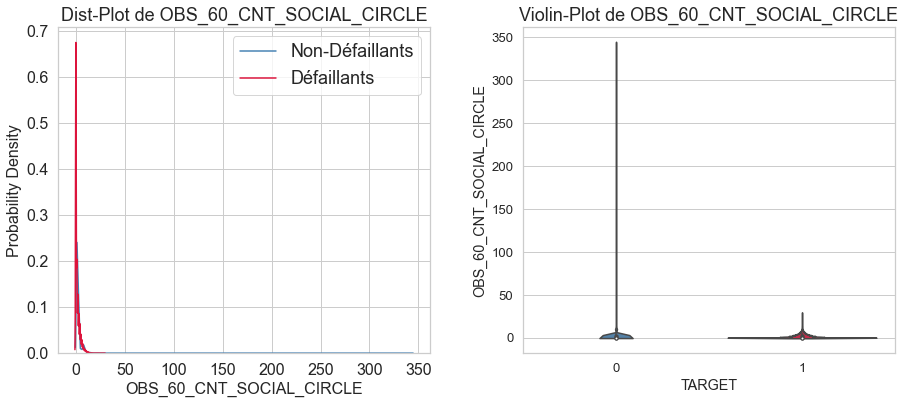

In [196]:
# Violinplot de OBS_60_CNT_SOCIAL_CIRCLE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'OBS_60_CNT_SOCIAL_CIRCLE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable DEF_60_CNT_SOCIAL_CIRCLE**

Combien d'observations de l'environnement social du demandeur ont fait l'objet d'un défaut de paiement de 60 (jours d'arriérés) DPD.

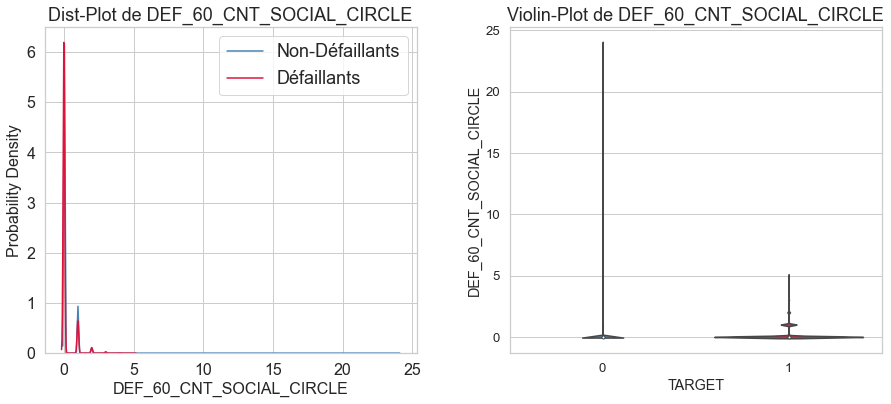

In [197]:
# Violinplot de DEF_60_CNT_SOCIAL_CIRCLE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DEF_60_CNT_SOCIAL_CIRCLE',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les défaillants ont plus de défaut de paiement de jours d'arriérés.

Cette variable pourra être utilisée pour départager les demandeurs défaillants ou non-défaillants.

**Variable DAYS_LAST_PHONE_CHANGE**

Combien de jours avant la demande le demaneur a-t-il changé de téléphone ?

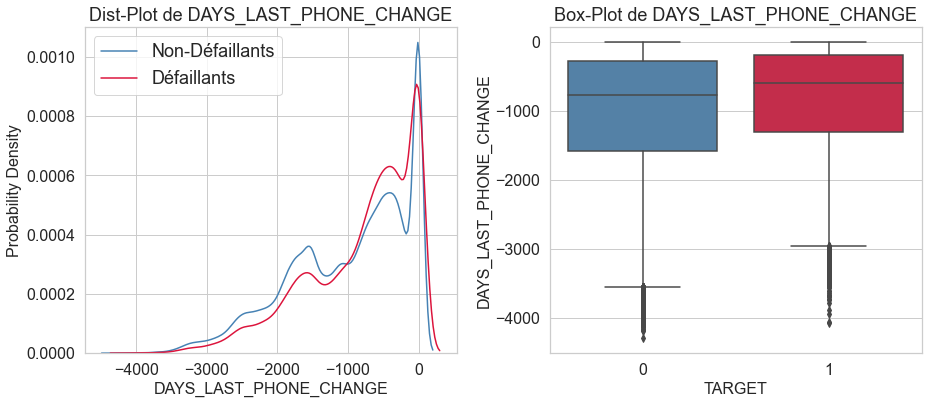

In [198]:
# Boxplot de DAYS_LAST_PHONE_CHANGE
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'DAYS_LAST_PHONE_CHANGE',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 6))

**Bilan**:
***
- Les défaillants ont changé de téléphone plus récemment que les non-défaillants, tous les quantiles sont plus hauts pour les défaillants que les non-défaillants.

Cette variable pourra être utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_REQ_CREDIT_BUREAU_HOUR**

Nombre de demandes de renseignements sur le demandeurs adressées au Bureau de crédit une heure avant la demande.

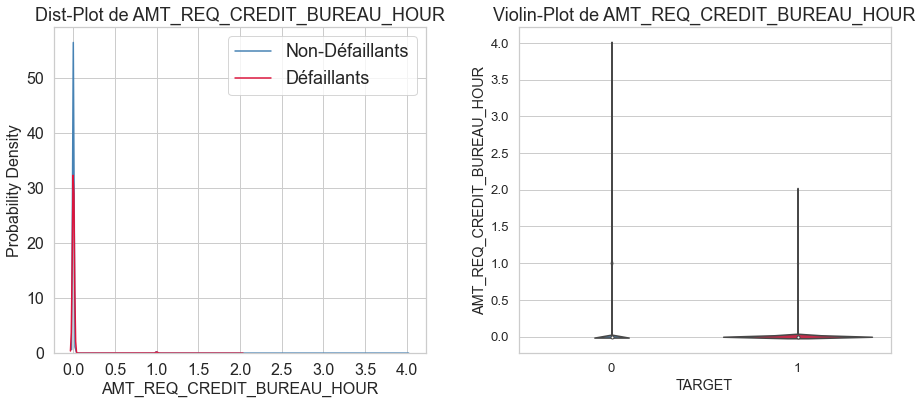

In [199]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_HOUR
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_HOUR',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_REQ_CREDIT_BUREAU_DAY**

Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur un jour avant la demande (sauf une heure avant la demande).

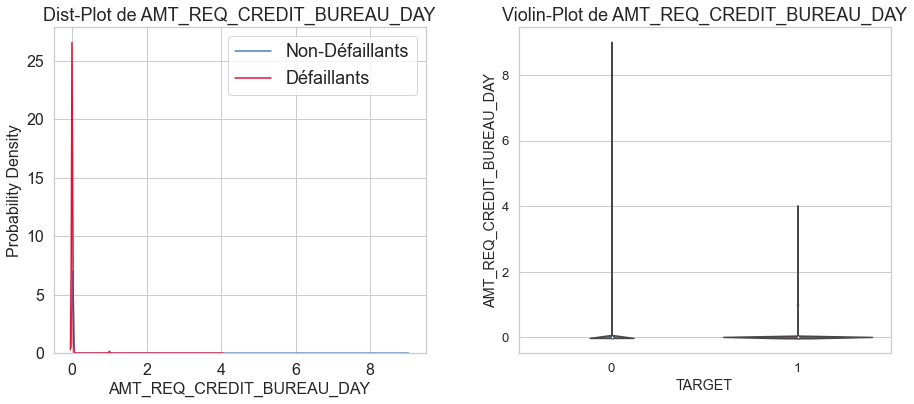

In [200]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_DAY
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_DAY',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_REQ_CREDIT_BUREAU_WEEK**

Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur une semaine avant la demande (à l'exception du jour précédant la demande).

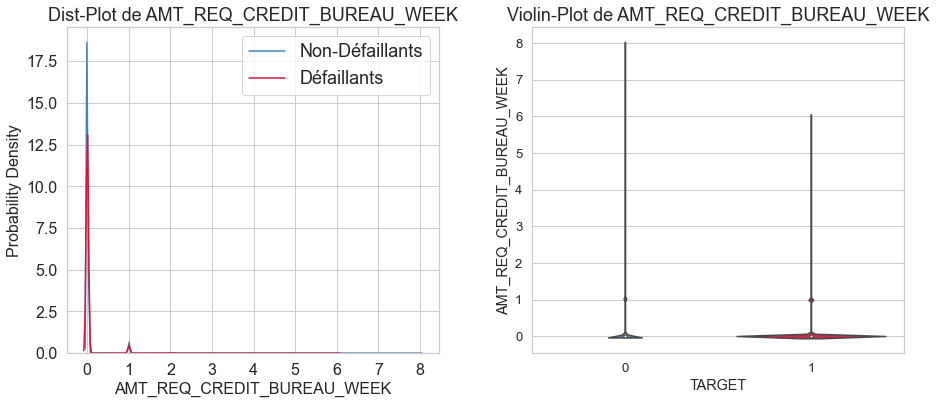

In [201]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_WEEK
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_WEEK',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_REQ_CREDIT_BUREAU_MON**

Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur un mois avant la demande (sauf une semaine avant la demande).

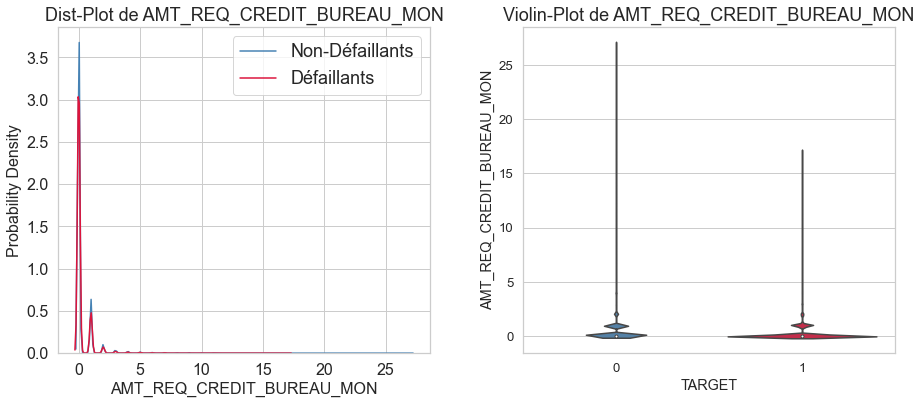

In [202]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_MON
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_MON',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_REQ_CREDIT_BUREAU_QRT**

Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur 3 mois avant la demande (sauf un mois avant la demande).

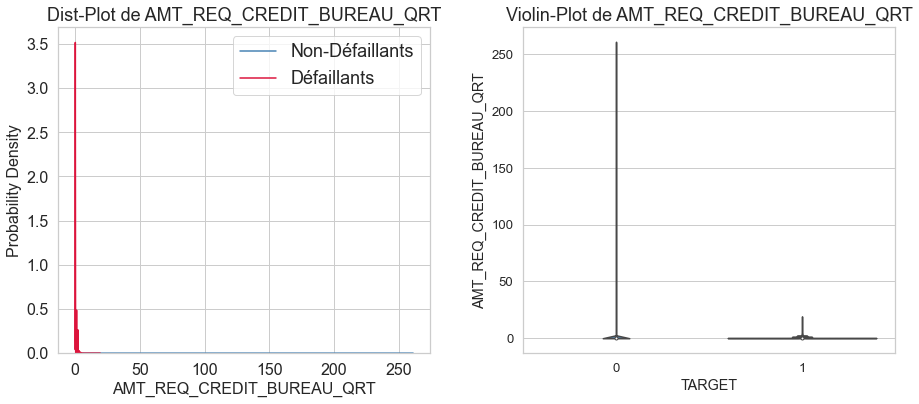

In [203]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_QRT
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_QRT',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_REQ_CREDIT_BUREAU_YEAR**

Nombre de demandes de renseignements au Bureau de crédit concernant le demandeur par jour et par an (à l'exception des 3 derniers mois avant la demande).,

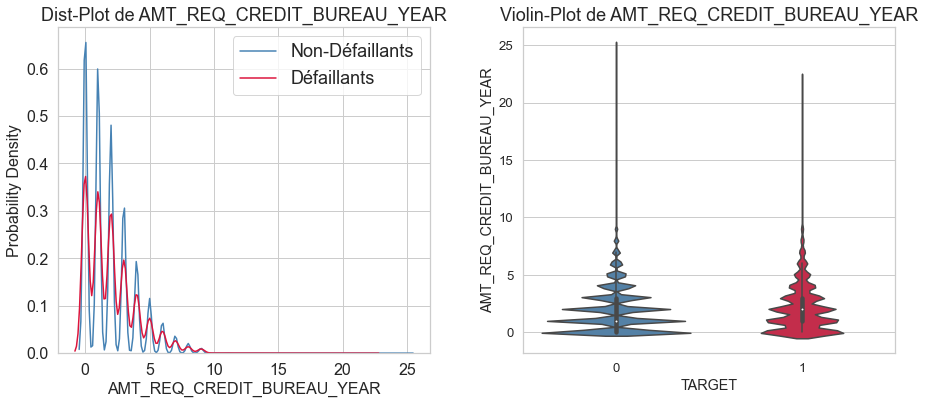

In [204]:
# Violinplot de AMT_REQ_CREDIT_BUREAU_YEAR
eda_kernel_fonctions.plot_continuous_variables(application_train,
                                               'AMT_REQ_CREDIT_BUREAU_YEAR',
                                               plots=['distplot', 'violin'],
                                               figsize=(15, 6))

**Bilan**:
***
- On observe peu de différence entre un défaillant ou un non-défaillant.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

#### 2.2.3. Analyse exploratoire multivariée

**Corrélation entre les variables catégorielles**

**Matrice Phi-K**

- Nous allons tracer une carte thermique des valeurs du [coefficient de corrélation Phi-K](https://lemakistatheux.wordpress.com/2013/09/01/le-coefficient-phi-2/) entre les 2 variables.
- Le [coefficient Phi-K](https://en.wikipedia.org/wiki/Phi_coefficient) est similaire au coefficient de corrélation sauf qu'il peut être utilisé avec une paire de caractéristiques catégorielles pour vérifier si une variable montre une sorte d'association avec l'autre variable catégorielle. Sa valeur maximale peut être de 1, ce qui indique une association maximale entre deux variables catégorielles.

-------------------------------------------------------------------------------


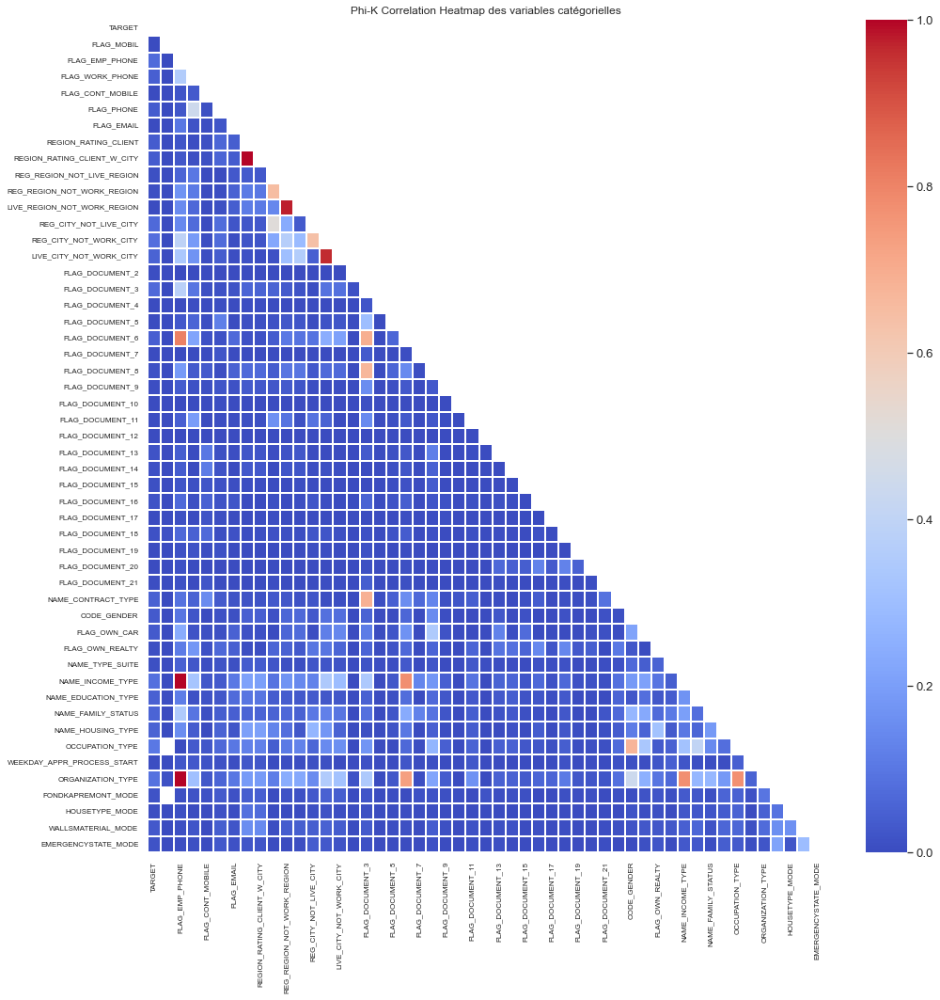

-------------------------------------------------------------------------------
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
OCCUPATION_TYPE,0.102846
ORGANIZATION_TYPE,0.089164
NAME_INCOME_TYPE,0.084831
REG_CITY_NOT_WORK_CITY,0.079946
FLAG_EMP_PHONE,0.072087
REG_CITY_NOT_LIVE_CITY,0.069588
FLAG_DOCUMENT_3,0.069525
NAME_FAMILY_STATUS,0.056043
NAME_HOUSING_TYPE,0.051107
LIVE_CITY_NOT_WORK_CITY,0.050956


-------------------------------------------------------------------------------


In [205]:
categorical_columns = ['TARGET', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
                       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
                       'FLAG_EMAIL', 'REGION_RATING_CLIENT',
                       'REGION_RATING_CLIENT_W_CITY',
                       'REG_REGION_NOT_LIVE_REGION',
                       'REG_REGION_NOT_WORK_REGION',
                       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
                       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY'] \
    + ['FLAG_DOCUMENT_' + str(i) for i in range(2, 22)] \
    + application_train.dtypes[application_train.dtypes == 'object'] \
    .index.tolist()
eda_kernel_fonctions.plot_phik_matrix(application_train,
                                      categorical_columns,
                                      figsize=(15, 15), fontsize=8,
                                      cmap='coolwarm')

**Bilan** :
***
- La carte thermique de la corrélation Phi-K ci-dessus montre que la plupart des variables catégorielles ne sont pas corrélées entre elles, mais que certaines d'entre elles présentent une forte corrélation.
- Certaines des paires de catégories fortement corrélées sont :
    - REGION_RATING_CLIENT_W_CITY et REGION_RATING_CLIENT - Ceci est compréhensible car elles racontent plus ou moins une histoire similaire.
    - LIVE_REGION_NOT_WORK_REGION et REG_REGION_NOT_WORK_REGION
    - NAME_INCOME_TYPE, ORGANIZATION_TYPE et FLAG_EMP_PHONE
- Nous pouvons également observer une certaine corrélation entre le type d'organisation et le type de revenu d'un demandeur. 
- De même, nous constatons une corrélation entre le type de profession et le type d'organisation.
- Nous constatons que les catégories :
    - OCCUPATION_TYPE,
    - ORGANIZATION_TYPE,
    - NAME_INCOME_TYPE,
    - et REG_CITY_NOT_WORK_CITY
    sont parmi les catégories les plus fortement corrélées avec la variable TARGET. Elles peuvent être importantes dans la tâche de classification et nécessiteraient une analyse EDA plus approfondie.

**Corrélation entre les variables numériques**

**Matrice de corrélation**

- Nous allons tracer une carte thermique de la corrélation de chaque variable numérique par rapport aux autres variables. 
- Nous avons exclu la variable SK_ID_CURR, car elle n'est pas pertinente.
- Cette carte thermique nous permettra d'identifier les variables numériques fortement corrélées et nous aidera également à identifier les variable fortement corrélées avec la variable cible.

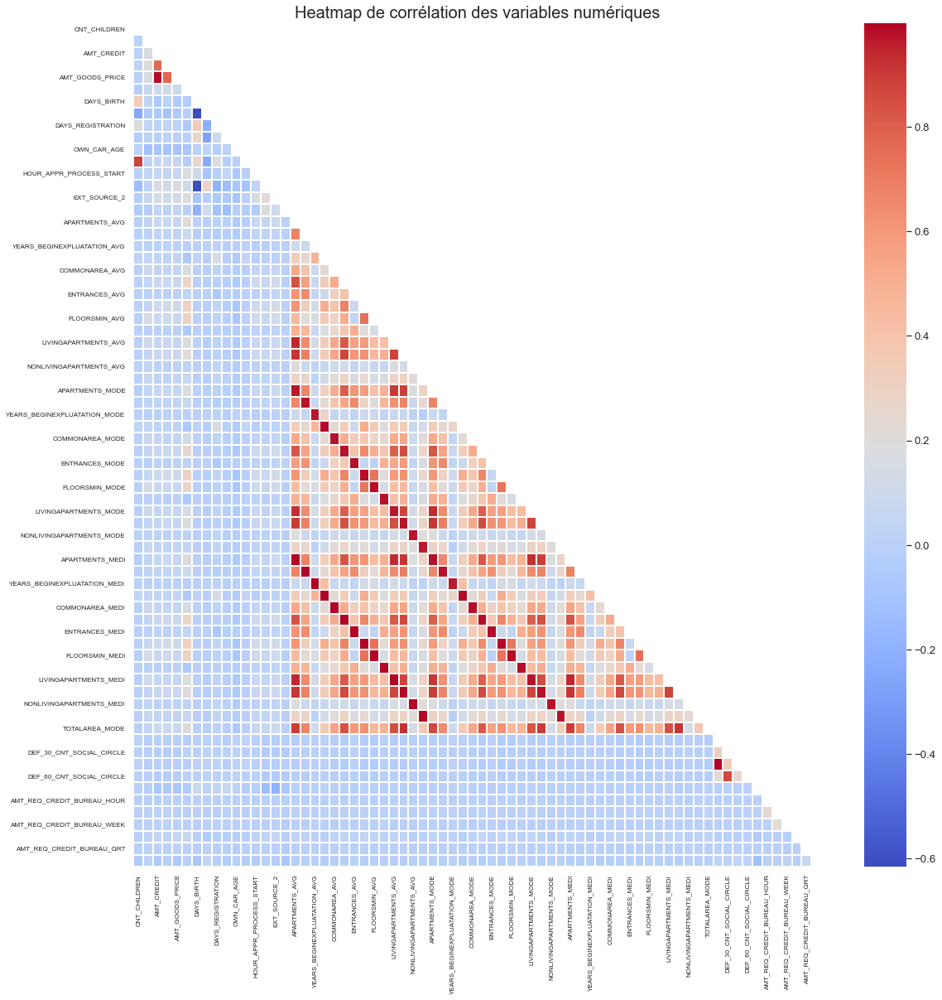

In [206]:
columns_to_drop = ['SK_ID_CURR'] + list(set(categorical_columns)
                                        - set(['TARGET']))
corr_mat = eda_kernel_fonctions.correlation_matrix(application_train,
                                                   columns_to_drop,
                                                   figsize=(17, 17),
                                                   fontsize=8,
                                                   cmap='coolwarm')
corr_mat.plot_correlation_matrix()

In [207]:
# Voir les colonnes supérieures avec la plus haute corrélation phik avec
# la variable cible dans la table application_train
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print("-"*79)

interval columns not set, guessing: ['TARGET', 'CNT_CHILDREN']
interval columns not set, guessing: ['TARGET', 'AMT_INCOME_TOTAL']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_GOODS_PRICE']
interval columns not set, guessing: ['TARGET', 'REGION_POPULATION_RELATIVE']
interval columns not set, guessing: ['TARGET', 'DAYS_BIRTH']
interval columns not set, guessing: ['TARGET', 'DAYS_EMPLOYED']
interval columns not set, guessing: ['TARGET', 'DAYS_REGISTRATION']
interval columns not set, guessing: ['TARGET', 'DAYS_ID_PUBLISH']
interval columns not set, guessing: ['TARGET', 'OWN_CAR_AGE']
interval columns not set, guessing: ['TARGET', 'CNT_FAM_MEMBERS']
interval columns not set, guessing: ['TARGET', 'HOUR_APPR_PROCESS_START']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_1']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_2']
interval columns 

Column Name,Phik-Correlation
EXT_SOURCE_3,0.247680
EXT_SOURCE_1,0.217846
EXT_SOURCE_2,0.213965
DAYS_BIRTH,0.102378
DAYS_LAST_PHONE_CHANGE,0.073218
DAYS_EMPLOYED,0.072095
DAYS_ID_PUBLISH,0.067766
AMT_GOODS_PRICE,0.059094
FLOORSMAX_AVG,0.058826
FLOORSMAX_MEDI,0.058595


-------------------------------------------------------------------------------


**Bilan** :
***
- La carte thermique montre bien la valeur ou le niveau de corrélation que chaque variable particulière a avec toutes les autres caractéristiques.
- On peut observer que la plupart de la carte thermique contient une couleur bleue, ce qui indique une très faible valeur de corrélation. Cela implique que la plupart des caractéristiques ne sont effectivement pas corrélées aux autres.
- Cependant, nous pouvons voir des teintes contrastées au milieu de la carte thermique. Ces nuances représentent une valeur élevée de corrélation entre les caractéristiques. Ce sont les caractéristiques qui sont liées aux statistiques des appartements.
- Si nous regardons les variables de l'application_train, nous pouvons clairement voir que les statistiques des appartements sont données en termes de Moyenne, Médiane et Mode, donc on peut s'attendre à ce que la moyenne, la médiane et le mode soient corrélés entre eux. Il convient également de noter que les variables d'une catégorie particulière, par exemple la moyenne, sont également corrélées avec d'autres variables moyennes, telles que le nombre d'ascenseurs, la surface habitable, la surface non habitable, la surface du sous-sol, etc.
- Nous constatons également une forte corrélation entre :
    - AMT_GOODS_PRICE et AMT_CREDIT, 
    - et entre DAYS_EMPLOYED et DAYS_BIRTH.
- Nous ne voulons pas de variables fortement corrélées car elles augmentent la complexité temporelle du modèle sans lui apporter beaucoup de valeur. Par conséquent, nous supprimons les variables intercorrélées.
- Parmi toutes les variables, nous constatons une corrélation élevée pour les variables EXT_SOURCE par rapport à la variable cible. Celles-ci peuvent être importantes pour notre tâche de classification.

## Fichier application_test.csv

### Description/statistiques

**Description**

- Le fichier **application_test.csv** est constituée de **données statiques relatives aux emprunteurs sans les étiquettes**. 
- Chaque ligne représente une demande de prêt.
- Le dataframe application_test.csv contient l'ensemble de données de test, et est similaire à l'application_train.csv, sauf que la colonne TARGET a été omise, qui doit être prédite à l'aide de modèles prédictifs statistiques et d'apprentissage automatique.

**Compréhension des variables**

In [208]:
df_var_appli_test = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'application_{train|test}.csv']
df_var_appli_test.style.hide_index()

Table,Row,Description,Special
application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,nan
application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",nan
application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,nan
application_{train|test}.csv,CODE_GENDER,Gender of the client,nan
application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,nan
application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,nan
application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,nan
application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,nan
application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,nan
application_{train|test}.csv,AMT_ANNUITY,Loan annuity,nan


**Statistiques**

In [209]:
eda_kernel_fonctions.afficher_stats_basic(application_test)

-------------------------------------------------------------------------------
Le jeu de données contient 48744 lignes et 121 variables.
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans application_train : 0
-------------------------------------------------------------------------------
Contenu des 3 premières lignes :


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                      int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
FLAG_OWN_REALTY                object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 121, dtype: object

,Nombre par type de variable,% des types de variable
float64,65,53.720000
int64,40,33.060000
object,16,13.220000


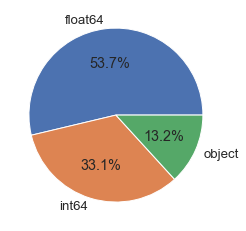

In [210]:
# Types des variables
outils_data.get_types_variables(application_test, True, True, True)

In [211]:
# Résumé des variables
desc_appli_test = outils_data.description_variables(application_test)
desc_appli_test

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
type,int64,object,object,object,object,int64,float64,float64,float64,float64,object,object,object,object,object,float64,int64,int64,float64,int64,...,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,0.0,911.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6049.0,6049.0,6049.0,6049.0,6049.0,6049.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000407,0.0,0.015446,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.10256,0.10256,0.10256,0.10256,0.10256,0.10256
count,48744.0,48744,48744,48744,48744,48744.0,48744.0,48744.0,48720.0,48744.0,47833,48744,48744,48744,48744,48744.0,48744.0,48744.0,48744.0,48744.0,...,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,42695.0,42695.0,42695.0,42695.0,42695.0,42695.0
unique,NaN,2,2,2,2,NaN,NaN,NaN,NaN,NaN,7,7,5,5,6,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,NaN,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,48305,32678,32311,33658,NaN,NaN,NaN,NaN,NaN,39727,24533,33988,32283,43645,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,277796.67635,NaN,NaN,NaN,NaN,0.397054,178431.805855,516740.435561,29426.240209,462618.840473,NaN,NaN,NaN,NaN,NaN,0.021226,-16068.084605,67485.366322,-4967.652716,-3051.712949,...,0.088462,0.004493,0.0,0.001169,0.0,0.0,0.0,0.0,0.0,0.0,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,NaN,NaN,NaN,NaN,0.709047,101522.591536,365397.004174,16016.368315,336710.21504,NaN,NaN,NaN,NaN,NaN,0.014428,4325.900393,144348.507136,3552.612035,1569.276709,...,0.283969,0.066879,0.0,0.034176,0.0,0.0,0.0,0.0,0.0,0.0,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.0,NaN,NaN,NaN,NaN,0.0,26941.5,45000.0,2295.0,45000.0,NaN,NaN,NaN,NaN,NaN,0.000253,-25195.0,-17463.0,-23722.0,-6348.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Bilan** :
***
- Le fichier application_test.csv contient environ **487000 enregistrements** et **121 variables**. 
- Ces variables sont exactement celles qui se trouvent dans le fichier application_train.csv, sauf qu'il s'agit des données de formation.
- Il y a 487000 SK_ID_CURR uniques qui représentent des demandes de prêt uniques.
- La colonne TARGET a été omise et doit être prédite à l'aide de modèles statistiques prédictifs et de modèles d'apprentissage automatique.

**Valeurs manquantes**

Valeurs manquantes : 1404419 NaN pour 5898024 données (23.81 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MODE,33495,68.720000
COMMONAREA_MEDI,33495,68.720000
COMMONAREA_AVG,33495,68.720000
NONLIVINGAPARTMENTS_MEDI,33347,68.410000
NONLIVINGAPARTMENTS_AVG,33347,68.410000
NONLIVINGAPARTMENTS_MODE,33347,68.410000
FONDKAPREMONT_MODE,32797,67.280000
LIVINGAPARTMENTS_MODE,32780,67.250000
LIVINGAPARTMENTS_MEDI,32780,67.250000
LIVINGAPARTMENTS_AVG,32780,67.250000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


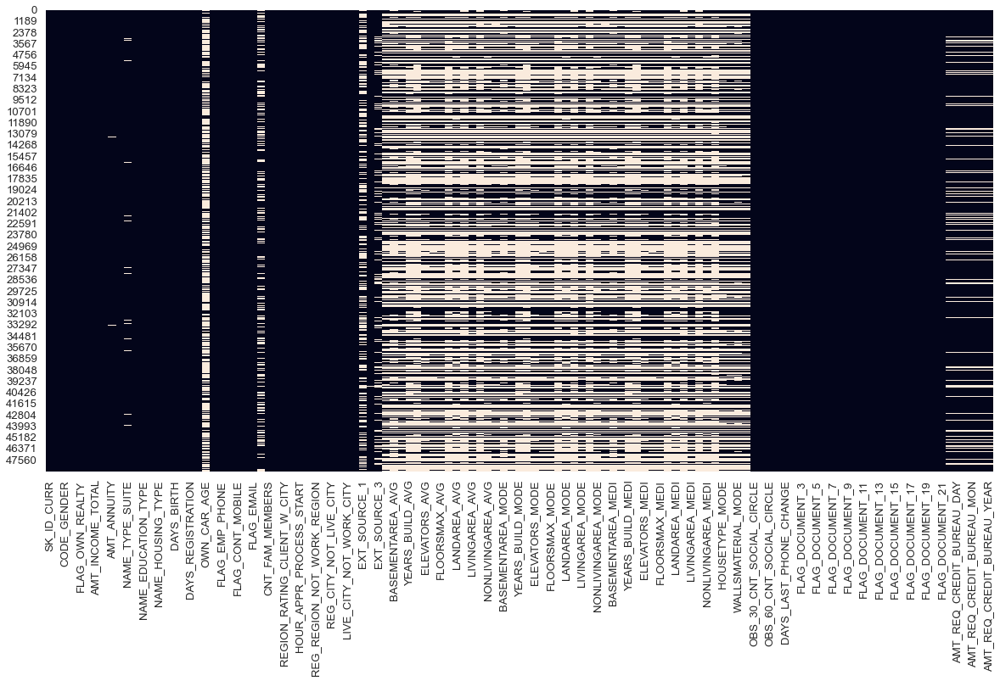

In [212]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(application_test, True, True)

Nombre de variables avec valeurs manquantes : 64


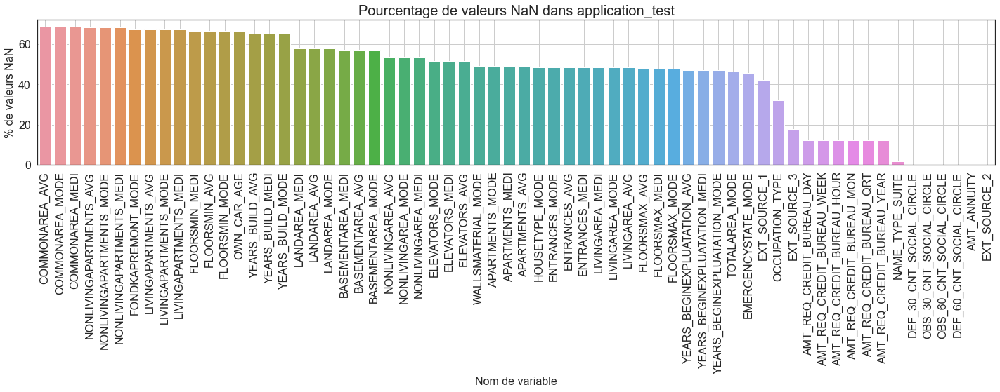

In [213]:
# Réprésentation visuelle des valeurs manquantes
df_nan_test = eda_kernel_fonctions.nan_df_create(application_test)
eda_kernel_fonctions.plot_nan_percent(df_nan_test, 'application_test',
                                      grid=True)

**Bilan** :
***
- Le nombre de variables avec des valeurs NaN est très similaire (64) à celui de l'application_train.
- Les pourcentages de valeurs NaN sont également assez similaires à ceux présents dans le jeu de données d'entraînement (train set). Cela signifie que les ensembles d'entraînement (train set) et de test (test set) ont une distribution assez similaire.

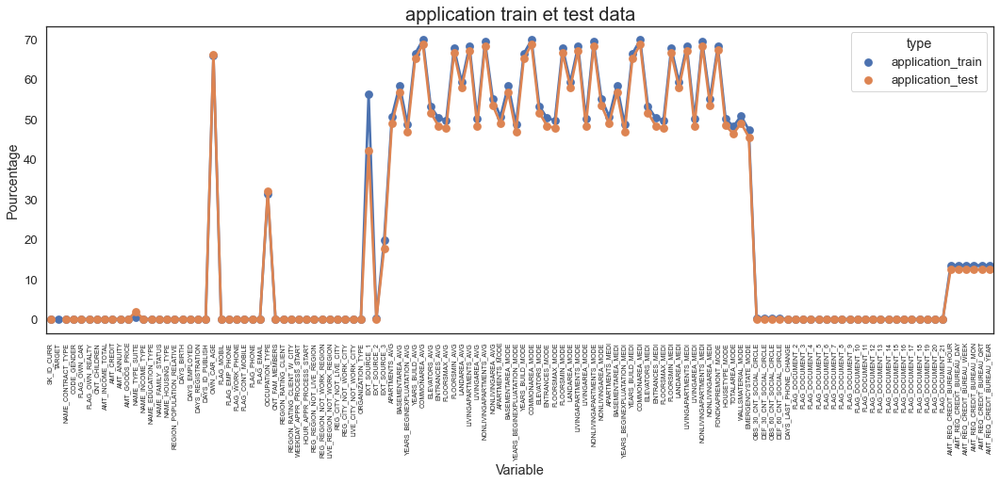

In [214]:
# Comparaison des pourcentages de NaN pour les application_train
# et application_test
fig = plt.figure(figsize=(18, 6))

miss_train = pd.DataFrame((application_train.isnull().sum()) * 100 /
                          application_train.shape[0]).reset_index()
miss_test = pd.DataFrame((application_test.isnull().sum()) * 100 /
                         application_test.shape[0]).reset_index()
miss_train['type'] = 'application_train'
miss_test['type'] = 'application_test'
missing = pd.concat([miss_train, miss_test], axis=0)
ax = sns.pointplot('index', 0, data=missing, hue='type')
plt.xticks(rotation=90, fontsize=7)
var = 'Pourcentage de valeurs manquantes dans '
plt.title('application train et test data', fontsize=20)
plt.ylabel('Pourcentage')
plt.xlabel('Variable')
plt.show()

[Source](https://www.kaggle.com/ozericyer/homecreditdefaultrisk-test-train-eda-1)

## Fichier bureau.csv

### Description/statistiques

**Description**

- Ce fichier **bureau.csv** comprend tous les **antécédents de crédit antérieurs du demandeur auprès d'institutions financières autres que le Home Credit Group**, qui ont été signalés par le bureau de crédit.

**Compréhension des variables**

In [215]:
df_var_bureau = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'bureau.csv']
df_var_bureau.style.hide_index() 

Table,Row,Description,Special
bureau.csv,SK_ID_CURR,"ID of loan in our sample - one loan in our sample can have 0,1,2 or more related previous credits in credit bureau",hashed
bureau.csv,SK_BUREAU_ID,Recoded ID of previous Credit Bureau credit related to our loan (unique coding for each loan application),hashed
bureau.csv,CREDIT_ACTIVE,Status of the Credit Bureau (CB) reported credits,nan
bureau.csv,CREDIT_CURRENCY,Recoded currency of the Credit Bureau credit,recoded
bureau.csv,DAYS_CREDIT,How many days before current application did client apply for Credit Bureau credit,time only relative to the application
bureau.csv,CREDIT_DAY_OVERDUE,Number of days past due on CB credit at the time of application for related loan in our sample,nan
bureau.csv,DAYS_CREDIT_ENDDATE,Remaining duration of CB credit (in days) at the time of application in Home Credit,time only relative to the application
bureau.csv,DAYS_ENDDATE_FACT,Days since CB credit ended at the time of application in Home Credit (only for closed credit),time only relative to the application
bureau.csv,AMT_CREDIT_MAX_OVERDUE,Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample),nan
bureau.csv,CNT_CREDIT_PROLONG,How many times was the Credit Bureau credit prolonged,nan


**Statistiques**

In [216]:
bureau.name = 'bureau'
application_train.name = 'application_train'
application_test.name = 'application_test'
eda_kernel_fonctions. \
    afficher_stats_basic_all(bureau, application_train,
                             application_test, 'SK_ID_BUREAU')

-------------------------------------------------------------------------------
Le jeu de données contient 1716428 lignes et 17 variables.
-------------------------------------------------------------------------------
Nombre de valeurs uniques SK_ID_BUREAU dans bureau.csv : 1716428
Nombre de valeurs uniques SK_ID_CURR dans bureau.csv : 305811
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et bureau.csv : 263491
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et bureau.csv : 42320
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans bureau.csv : 0
-------------------------------------------------------------------------------
Contenu des 3 premières lignes :


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                  int64
SK_ID_BUREAU                int64
CREDIT_ACTIVE              object
CREDIT_CURRENCY            object
DAYS_CREDIT                 int64
CREDIT_DAY_OVERDUE          int64
DAYS_CREDIT_ENDDATE       float64
DAYS_ENDDATE_FACT         float64
AMT_CREDIT_MAX_OVERDUE    float64
CNT_CREDIT_PROLONG          int64
AMT_CREDIT_SUM            float64
AMT_CREDIT_SUM_DEBT       float64
AMT_CREDIT_SUM_LIMIT      float64
AMT_CREDIT_SUM_OVERDUE    float64
CREDIT_TYPE                object
DAYS_CREDIT_UPDATE          int64
AMT_ANNUITY               float64
dtype: object

,Nombre par type de variable,% des types de variable
float64,8,47.060000
int64,6,35.290000
object,3,17.650000


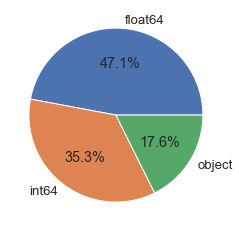

In [217]:
# Types des variables
outils_data.get_types_variables(bureau, True, True, True)

In [218]:
# Résumé des variables
desc_bureau = outils_data.description_variables(bureau)
desc_bureau

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
type,int64,int64,object,object,int64,int64,float64,float64,float64,int64,float64,float64,float64,float64,object,int64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,105553.0,633653.0,1124488.0,0.0,13.0,257669.0,591780.0,0.0,0.0,0.0,1226791.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.36174,2.171586,3.853721,0.0,0.000045,0.883055,2.028083,0.0,0.0,0.0,4.204323
count,1716428.0,1716428.0,1716428,1716428,1716428.0,1716428.0,1610875.0,1082775.0,591940.0,1716428.0,1716415.0,1458759.0,1124648.0,1716428.0,1716428,1716428.0,489637.0
unique,NaN,NaN,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,NaN,NaN
top,NaN,NaN,Closed,currency 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer credit,NaN,NaN
freq,NaN,NaN,1079273,1715020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1251615,NaN,NaN
mean,278214.933645,5924434.489032,NaN,NaN,-1142.107685,0.818167,510.517362,-1017.437148,3825.417661,0.00641,354994.591918,137085.119952,6229.51498,37.912758,NaN,-593.74832,15712.7577
std,102938.558112,532265.728552,NaN,NaN,795.164928,36.544428,4994.219837,714.010626,206031.606207,0.096224,1149811.34398,677401.130952,45032.031476,5937.650035,NaN,720.747312,325826.949053
min,100001.0,5000000.0,NaN,NaN,-2922.0,0.0,-42060.0,-42023.0,0.0,0.0,0.0,-4705600.32,-586406.115,0.0,NaN,-41947.0,0.0


**Bilan** :
***
- Le fichier bureau.csv contient près de 1,7 millions de points de données, avec 17 variables. 
- Parmi ces 17 variables, deux sont SK_ID_CURR et SK_ID_BUREAU.
    - SK_ID_BUREAU est l'identifiant du prêt précédent du demandeur auprès d'autres institutions financières. Il peut y avoir plusieurs prêts antérieurs correspondant à un seul SK_ID_CURR, ce qui dépend des habitudes d'emprunt du demandeur.
    - SK_ID_CURR est l'identifiant du prêt actuel du demandeur auprès de Home Credit.
- Le reste des variables contient d'autres statistiques telles que DAYS_CREDIT, AMT_CREDIT_SUM, CREDIT_TYPE, etc.
- Il y a 305000 SK_ID_CURR uniques dans le fichier bureau, parmi lesquels :
    - Il y a 263000 SK_ID_CURR dans le fichier  bureau qui sont présents dans application_train sur un total de 307000 de SK_ID_CURR uniques d'application_train. Cela signifie que certains des demandeurs dans la demande de prêt actuelle avec Home Credit Group n'ont pas d'antécédents de crédit avec le département du bureau de crédit.
- De même, il y a 42300 SK_ID_CURR dans le fichier bureau qui sont présents dans application_test, sur un total de 48000 de SK_ID_CURR uniques de application_test.

**Valeurs manquantes**

Valeurs manquantes : 3939947 NaN pour 29179276 données (13.5 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
AMT_ANNUITY,1226791,71.470000
AMT_CREDIT_MAX_OVERDUE,1124488,65.510000
DAYS_ENDDATE_FACT,633653,36.920000
AMT_CREDIT_SUM_LIMIT,591780,34.480000
AMT_CREDIT_SUM_DEBT,257669,15.010000
DAYS_CREDIT_ENDDATE,105553,6.150000
AMT_CREDIT_SUM,13,0.000000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


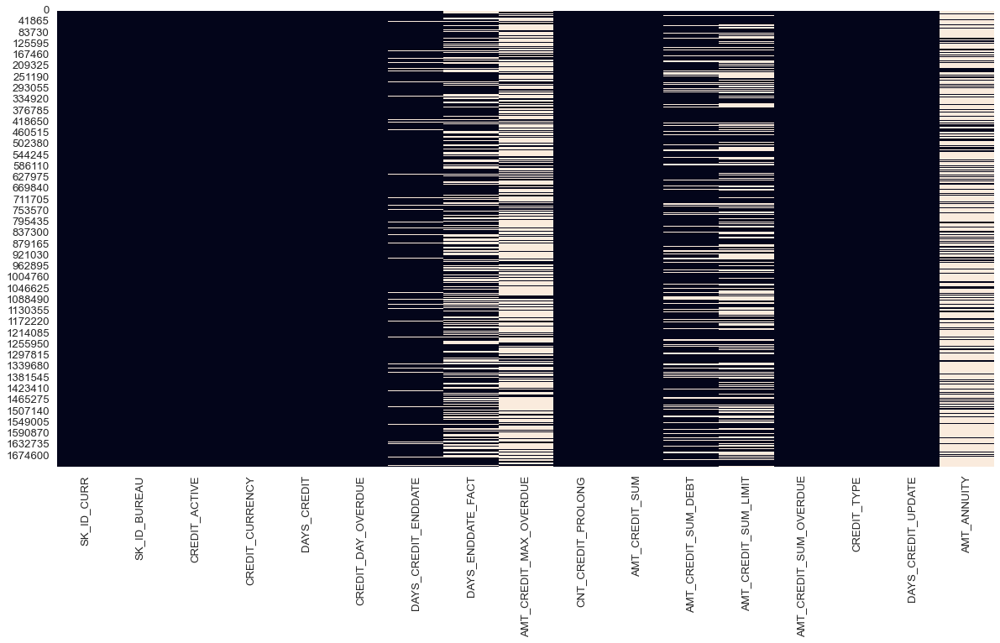

In [219]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(bureau, True, True)

Nombre de variables avec valeurs manquantes : 7


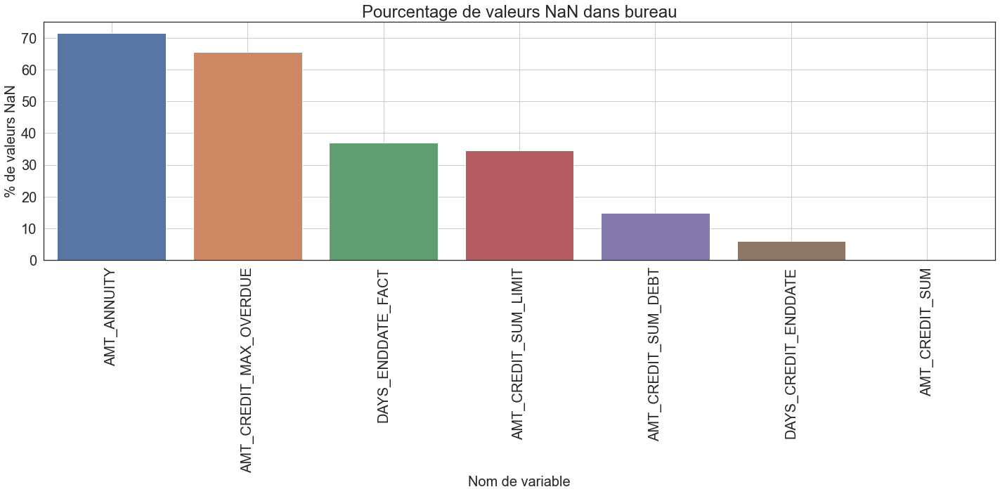

In [220]:
# Réprésentation visuelle des valeurs manquantes
df_nan_bureau = eda_kernel_fonctions.nan_df_create(bureau)
eda_kernel_fonctions.plot_nan_percent(df_nan_bureau, 'bureau',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

**Bilan** :
***
- Sur les 17 variables, 7 contiennent des valeurs NaN.
- Les valeurs NaN les plus élevées sont observées avec la variable AMT_ANNUITY qui a plus de 70% de valeurs manquantes.

**Préparation du dataframe de travail**

In [221]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
print('Création dataframe de travail : merge TARGET avec dataframe bureau')
bureau_merged = application_train.iloc[:, :2].merge(bureau,
                                                    on='SK_ID_CURR',
                                                    how='left')
print("-"*79)

-------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe bureau
-------------------------------------------------------------------------------


### Analyse exploratoire univariée

***
**Distribution des variables catégorielles**
***

Nous allons maintenant représenter graphiquement certaines des variables catégorielles du dataframe bureau, et voir leur impact sur la variable cible.

In [222]:
# Liste des variables qualitatives
cols_cat_bureau = \
    bureau.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_bureau

['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']

**Variable CREDIT_ACTIVE**

Cette variable décrit l'état du prêt précédent rapporté par le bureau de crédit.

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CREDIT_ACTIVE' sont :
['Closed' 'Active' nan 'Sold' 'Bad debt']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
Closed      917733
Active      541919
Sold          5653
Bad debt        20
Name: CREDIT_ACTIVE, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour CREDIT_ACTIVE = 5


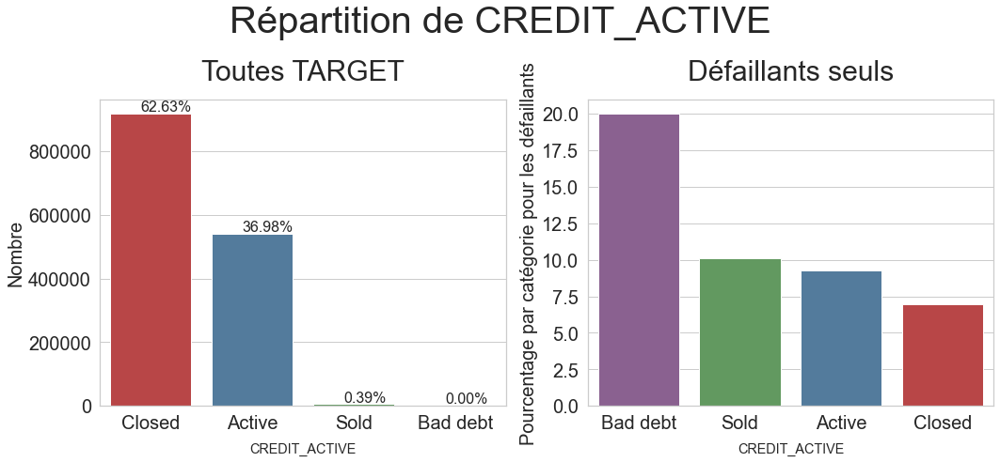

In [223]:
# Let us first see the unique categories of 'CREDIT_ACTIVE'
eda_kernel_fonctions.print_unique_categories(bureau_merged,
                                             'CREDIT_ACTIVE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(bureau_merged, column_name='CREDIT_ACTIVE',
                                   horizontal_adjust=0.3,
                                   figsize=(15, 7), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#905998', '#59a257',
                                             '#477ca8', '#cb3335'])

**Bilan** :
***
À partir du graphique ci-dessus, nous pouvons tirer les conclusions suivantes :

- Dans le premier sous-graphe, nous voyons que la majorité des prêts antérieurs d'autres institutions financières sont des prêts fermés (62,63%), suivis par 36,98% de prêts actifs. Les prêts vendus et les prêts pour créances douteuses sont très peu nombreux.
- Si nous examinons le pourcentage de défaillants par catégorie, nous constatons qu'environ 20 % des personnes ayant des créances douteuses ont fait défaut, ce qui représente le taux de défaillance le plus élevé. Cette catégorie est suivie par les prêts vendus et les prêts actifs. Le taux de défaillance le plus faible concerne les prêts fermés, qui témoignent d'un bon historique du demandeur. La courbe observée ici est donc tout à fait logique et attendue.

***Note*** :
***
Les 'Bad credit loans' sont destinés aux personnes dont le dossier de crédit est loin d'être irréprochable ou qui ont peu ou pas d'antécédents de crédit. Ces prêts ont généralement des taux d'intérêt plus élevés et des restrictions plus importantes que les autres prêts, car cela permet aux prêteurs de réduire le risque que vous ne les remboursiez pas. Cependant, ils peuvent être utiles s'ils sont gérés de manière responsable.

**Variable CREDIT_CURRENCY**

Cette variable décrit devise recodée du crédit du bureau de crédit.

In [224]:
# Let us first see the unique categories of 'CREDIT_CURRENCY'
eda_kernel_fonctions.print_unique_categories(bureau_merged,
                                             'CREDIT_CURRENCY')

# Plotting the Pie Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_pie(bureau_merged,
                                   column_name='CREDIT_CURRENCY')

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CREDIT_CURRENCY' sont :
['currency 1' nan 'currency 2' 'currency 3' 'currency 4']
-------------------------------------------------------------------------------


-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CREDIT_CURRENCY' sont :
['currency 1' nan 'currency 2' 'currency 3' 'currency 4']
-------------------------------------------------------------------------------
Répartition dans chaque catégorie :
currency 1    1464094
currency 2       1072
currency 3        150
currency 4          9
Name: CREDIT_CURRENCY, dtype: int64
-------------------------------------------------------------------------------
Nombre de catégories uniques pour CREDIT_CURRENCY = 5


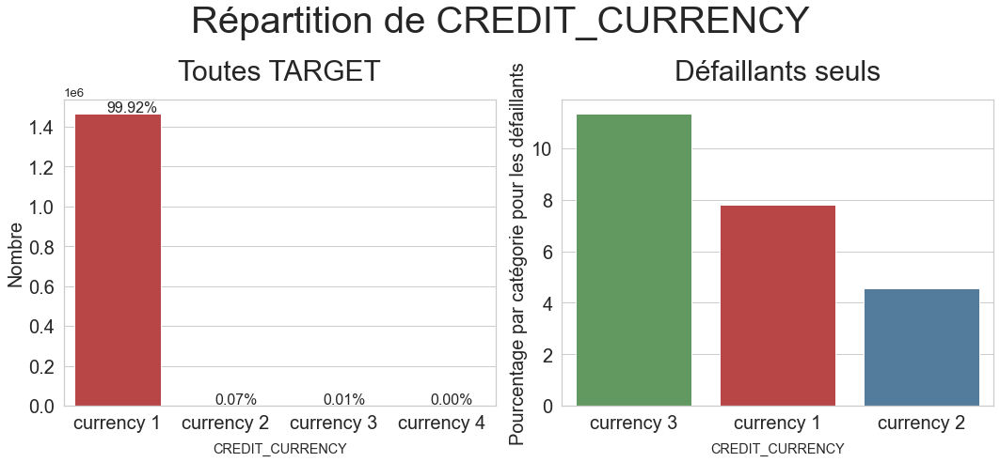

In [225]:
# Let us first see the unique categories of 'CREDIT_CURRENCY'
eda_kernel_fonctions.print_unique_categories(bureau_merged,
                                             'CREDIT_CURRENCY',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(bureau_merged,
                                   column_name='CREDIT_CURRENCY',
                                   horizontal_adjust=0.3,
                                   figsize=(15, 7), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#59a257', '#cb3335',
                                             '#477ca8'])

**Bilan** :
***
À partir du graphique ci-dessus, nous pouvons tirer les conclusions suivantes :

- Dans le premier sous-graphe, nous voyons que la majorité des devises utilisées sont 'currency_1'.
- Si nous examinons le pourcentage de défaillants par catégorie, nous constatons qu'environ 11,5 % des personnes ayant des prêts avec la devise 'currency_3' ont été défaillants, ce qui représente le taux de défaillance le plus élevé. Cette catégorie est suivie par les devises currency_1 (8%) et currency_2 (4%). 

Les personnes utilisant les devises currency_2 et currency_3 ont plus de possibilités d'être défaillants.

**Variable CREDIT_TYPE**

Cette variable décrit le type de crédit au bureau de crédit (exemple :voiture, argent liquide...).

-------------------------------------------------------------------------------
Les catégories uniques de la variable 'CREDIT_TYPE' sont :
['Credit card' 'Consumer credit' nan 'Loan for business development'
 'Microloan' 'Mortgage' 'Car loan'
 'Loan for working capital replenishment' 'Another type of loan'
 'Unknown type of loan' 'Loan for the purchase of equipment'
 'Cash loan (non-earmarked)' 'Real estate loan' 'Interbank credit'
 'Loan for purchase of shares (margin lending)' 'Mobile operator loan']
-------------------------------------------------------------------------------
Nombre de catégories uniques pour CREDIT_TYPE = 16


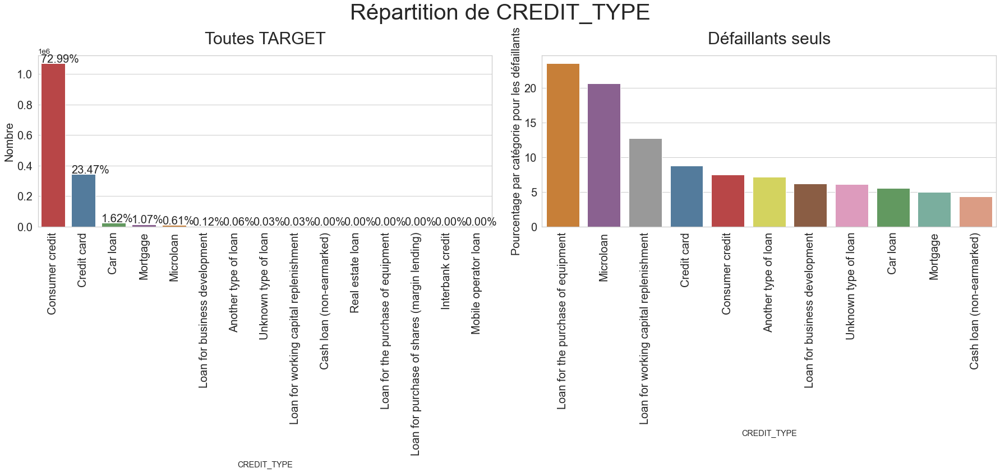

In [226]:
# Let us first see the unique categories of 'CREDIT_TYPE'
eda_kernel_fonctions.print_unique_categories(bureau_merged,
                                             'CREDIT_TYPE')

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(bureau_merged,
                                   column_name='CREDIT_TYPE',
                                   figsize=(25, 12), rotation=90,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675', '#95a3c3',
                                             '#db96c0', '#a2c865',
                                             '#e5c949'],
                                   palette2=['#df7f20', '#905998',
                                             '#999999', '#477ca8',
                                             '#cb3335', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#59a257', '#72b6a1',
                                             '#e99675'])

**Bilan** :
***
À partir du graphique ci-dessus, nous pouvons tirer les conclusions suivantes :

- Dans le premier sous-graphe, nous voyons que la majorité des types de prêts des prêts à la consommation ou des cartes de crédit.
- Les défaillants ont recours à d'autres types de crédits : 30% pour l'achat de matériel, 20% pour des micro-crédits et 12,5% pour la reconstitution du fonds de roulement. 

Peut-on en déduire que les défaillants sont plus des auto-entreprenants qui remplacent du matériel et ont besoin de trésorerie pour payer les fournisseurs?

***
**Distribution des variables quantitatives**
***

In [227]:
# Liste des variables quantitatives
cols_num_bureau = \
    bureau.select_dtypes(include=[np.number]).columns.to_list()
cols_num_bureau

['SK_ID_CURR',
 'SK_ID_BUREAU',
 'DAYS_CREDIT',
 'CREDIT_DAY_OVERDUE',
 'DAYS_CREDIT_ENDDATE',
 'DAYS_ENDDATE_FACT',
 'AMT_CREDIT_MAX_OVERDUE',
 'CNT_CREDIT_PROLONG',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_OVERDUE',
 'DAYS_CREDIT_UPDATE',
 'AMT_ANNUITY']

**Variable DAYS_CREDIT**

- Cette variable décrit le nombre de jours avant la demande actuelle, lorsque le demaneur a fait une demande de crédit au bureau de crédit.
- Pour faciliter l'interprétation, nous allons convertir ces jours en années.

-------------------------------------------------------------------------------
Pecentiles de la variable YEARS_CREDIT
Pecentile 0 = 0.0
Pecentile 25 = 1.2876712328767124
Pecentile 50 = 2.6986301369863015
Pecentile 75 = 4.578082191780822
Pecentile 90 = 6.706849315068493
Pecentile 92 = 6.945205479452055
Pecentile 94 = 7.183561643835616
Pecentile 96 = 7.4301369863013695
Pecentile 98 = 7.712328767123288
Pecentile 100 = 8.005479452054795
-------------------------------------------------------------------------------


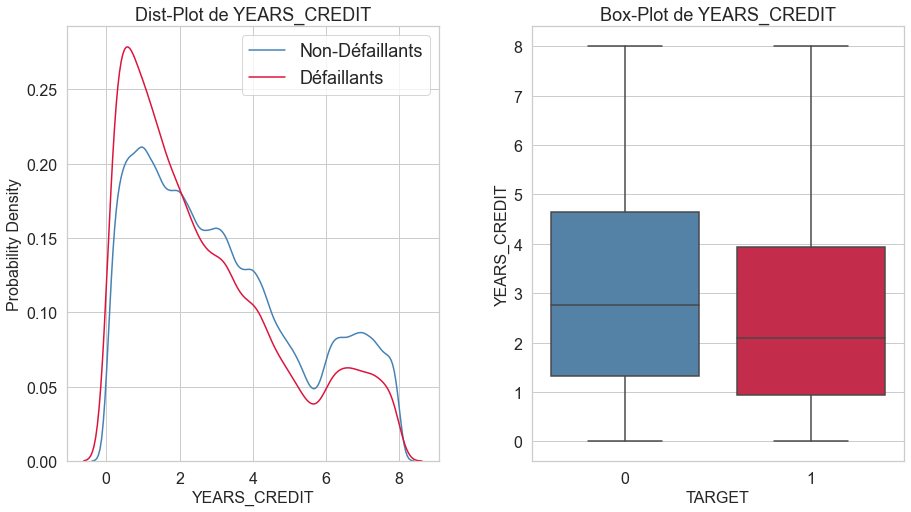

In [228]:
# Transformer en années à partir du nombre de jours
bureau_merged['YEARS_CREDIT'] = \
    bureau_merged['DAYS_CREDIT'] * -1 / 365
# Affiche les quantiles
eda_kernel_fonctions.print_percentiles(bureau_merged, 'YEARS_CREDIT')
# Affiche boxplot, distplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'YEARS_CREDIT',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 8))
# Suppression de la variable nouvellement ajoutée
_ = bureau_merged.pop('YEARS_CREDIT')

**Bilan** :
***
A partir des graphiques ci-dessus, nous voyons que :

- D'après le PDF, nous constatons que les défaillants ont tendance à avoir des pics plus élevés que les non-défaillants lorsque le nombre d'années est inférieur. Cela implique que les demandeurs qui ont fait une demande de prêt au Bureau de crédit récemment ont montré une plus grande tendance à la défaillance que ceux qui ont fait une demande il y a longtemps. Le PDF des défaillants est également un peu plus à gauche que celui des non-défaillants.
- Sur le boxplot, nous voyons que les défaillants ont généralement moins d'années de crédit que les non-défaillants.

**Variable DAYS_CREDIT_ENDDATE**

Cette variable indique la durée restante du crédit du Bureau de crédit au moment de la demande de prêt en crédit immobilier.

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_CREDIT_ENDDATE
Pecentile 0 = -42060.0
Pecentile 2 = -2487.0
Pecentile 4 = -2334.0
Pecentile 6 = -2202.0
Pecentile 8 = -2073.9199999999983
Pecentile 10 = -1939.0
Pecentile 25 = -1144.0
Pecentile 50 = -334.0
Pecentile 75 = 473.0
Pecentile 100 = 31199.0
-------------------------------------------------------------------------------


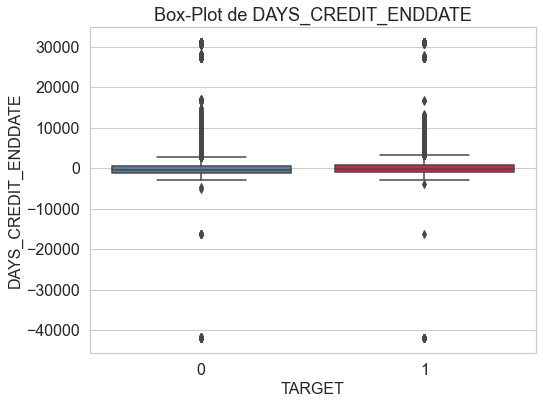

In [229]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'DAYS_CREDIT_ENDDATE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'DAYS_CREDIT_ENDDATE',
                                               plots=['box'], figsize=(8, 6))

**Bilan** :
***
- À partir des valeurs de quantile ci-dessus, et en regardant le boxplot, nous constatons qu'il semble y avoir une valeur erronée pour DAYS_CREDIT_ENDDATE, où la valeur du 0e quantile remonte jusqu'à 42060 jours ou 115 ans. Cela n'a pas beaucoup de sens car cela implique que le précédent prêt du demandeur remonte à 115 ans. 
- Il pourrait également s'agir d'un prêt hérité, mais nous ne pouvons pas nous prononcer à ce sujet.

Nous essaierons d'éliminer ces valeurs lors de l'étape de prétraitement des données.

**Variable DAYS_ENDDATE_FACT**

- Cette variable indique le nombre de jours depuis lesquels le crédit du Bureau de Credit a été clôturé au moment de la demande de prêt du crédit immobilier. 
- Ces valeurs ne concernent que les crédits fermés.

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_ENDDATE_FACT
Pecentile 0 = -42023.0
Pecentile 2 = -2561.0
Pecentile 4 = -2450.0
Pecentile 6 = -2351.0
Pecentile 8 = -2265.0
Pecentile 10 = -2173.0
Pecentile 25 = -1503.0
Pecentile 50 = -900.0
Pecentile 75 = -427.0
Pecentile 100 = 0.0
-------------------------------------------------------------------------------


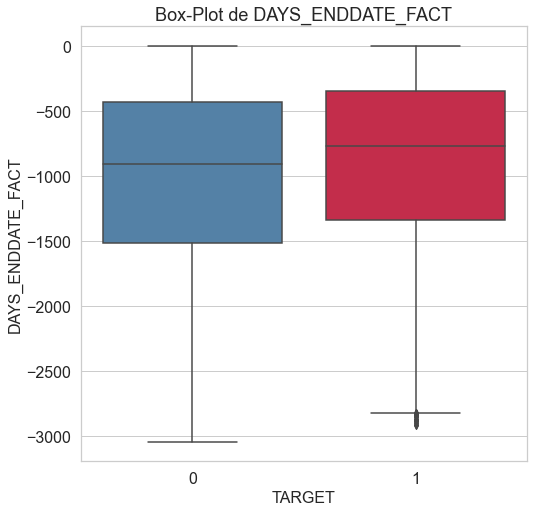

In [230]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'DAYS_ENDDATE_FACT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'DAYS_ENDDATE_FACT',
                                               plots=['box'],
                                               figsize=(8, 8),
                                               scale_limits=[-40000, 0])

**Bilan** :
***
- Tout comme la colonne précédente, nous constatons que le 0e quantile de cette variable semble également erroné, soit 42023 jours ou ~115 ans. Nous devrions supprimer ces valeurs, car elles n'ont pas beaucoup de sens.
- Sur le boxplot, nous voyons que les défaillants ont tendance à avoir un nombre de jours inférieur depuis que leur crédit au Bureau du Crédit a pris fin. 
- Les non-défaillants ont généralement leur crédit précédent terminé plus longtemps avant que les défaillants.

**Variable DAYS_CREDIT_UPDATE**

Cette variable indique le nombre de jours depuis lesquels l'information du Bureau de crédit est parvenue au moment de la demande de prêt dans le cadre du crédit immobilier.

-------------------------------------------------------------------------------
Pecentiles de la variable DAYS_CREDIT_UPDATE
Pecentile 0 = -41947.0
Pecentile 2 = -2415.0
Pecentile 4 = -2213.0
Pecentile 6 = -2002.0
Pecentile 8 = -1766.0
Pecentile 10 = -1582.0
Pecentile 25 = -904.0
Pecentile 50 = -406.0
Pecentile 75 = -33.0
Pecentile 100 = 372.0
-------------------------------------------------------------------------------


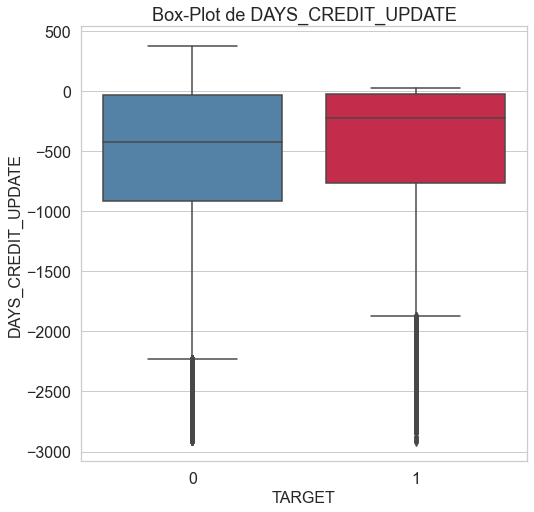

In [231]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'DAYS_CREDIT_UPDATE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'DAYS_CREDIT_UPDATE',
                                               plots=['box'],
                                               figsize=(8, 8),
                                               scale_limits=[-40000, 400])

**Bilan** :
***
- La tendance des valeurs erronées est à nouveau très similaire à celle de la variable des autres jours, où la valeur du 0e quantile semble être erronée. 
- De plus, étant donné que seule la valeur du 0e quantile est si étrange, et que le reste semble être correct, cette valeur est donc définitivement erronée. Nous allons également supprimer cette valeur.
- Sur le boxplot, on constate que les défaillants ont tendance à avoir moins de jours depuis la fin de leur crédit auprès du bureau de crédit.
- Leurs valeurs médianes, au 75e centile, sont toutes inférieures à celles des non défaillants.

**Variable CREDIT_DAY_OVERDUE**

Nombre de jours de retard sur le crédit du Bureau de crédit au moment de la demande de prêt liée à notre échantillon.

-------------------------------------------------------------------------------
Pecentiles de la variable CREDIT_DAY_OVERDUE
Pecentile 0 = 0.0
Pecentile 2 = 0.0
Pecentile 4 = 0.0
Pecentile 6 = 0.0
Pecentile 8 = 0.0
Pecentile 10 = 0.0
Pecentile 25 = 0.0
Pecentile 50 = 0.0
Pecentile 75 = 0.0
Pecentile 100 = 2792.0
-------------------------------------------------------------------------------


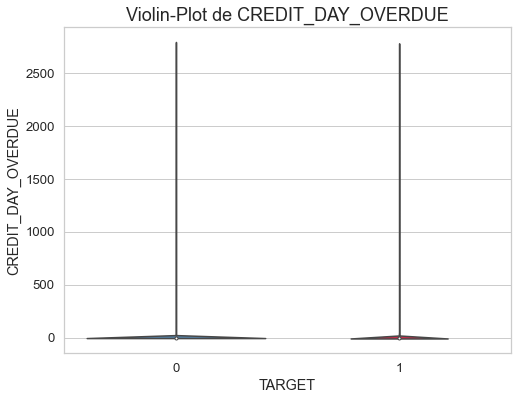

In [232]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'CREDIT_DAY_OVERDUE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'CREDIT_DAY_OVERDUE',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_CREDIT_MAX_OVERDUE**

Montant maximal des impayés sur le crédit du Bureau de crédit jusqu'à présent (à la date de demande du prêt dans notre échantillon).

-------------------------------------------------------------------------------
Pecentiles de la variable AMT_CREDIT_MAX_OVERDUE
Pecentile 0 = 0.0
Pecentile 2 = 0.0
Pecentile 4 = 0.0
Pecentile 6 = 0.0
Pecentile 8 = 0.0
Pecentile 10 = 0.0
Pecentile 25 = 0.0
Pecentile 50 = 0.0
Pecentile 75 = 0.0
Pecentile 100 = 115987185.0
-------------------------------------------------------------------------------


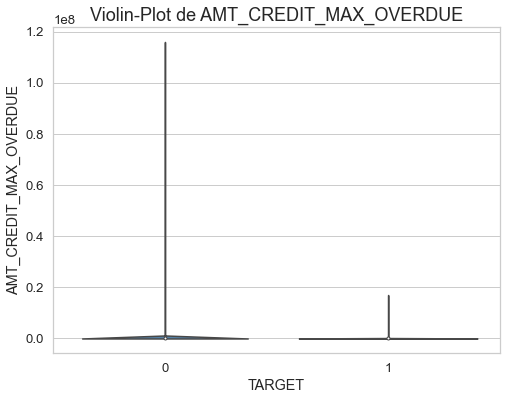

In [233]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'AMT_CREDIT_MAX_OVERDUE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'AMT_CREDIT_MAX_OVERDUE',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable CNT_CREDIT_PROLONG**

Combien de fois le crédit du Bureau de crédit a-t-il été prolongé ?

-------------------------------------------------------------------------------
Pecentiles de la variable CNT_CREDIT_PROLONG
Pecentile 0 = 0.0
Pecentile 2 = 0.0
Pecentile 4 = 0.0
Pecentile 6 = 0.0
Pecentile 8 = 0.0
Pecentile 10 = 0.0
Pecentile 25 = 0.0
Pecentile 50 = 0.0
Pecentile 75 = 0.0
Pecentile 100 = 9.0
-------------------------------------------------------------------------------


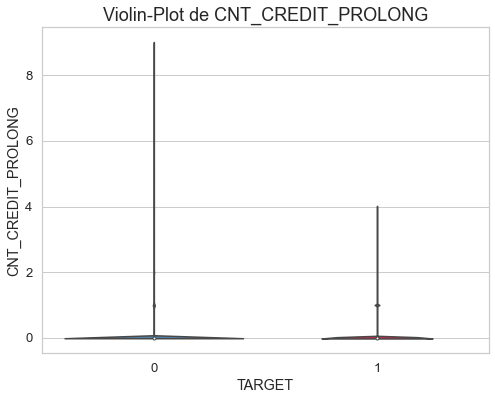

In [234]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'CNT_CREDIT_PROLONG',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'CNT_CREDIT_PROLONG',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_CREDIT_SUM**

Montant actuel du crédit du Bureau de crédit.

-------------------------------------------------------------------------------
Pecentiles de la variable AMT_CREDIT_SUM
Pecentile 0 = 0.0
Pecentile 2 = 0.0
Pecentile 4 = 4500.0
Pecentile 6 = 14391.0
Pecentile 8 = 19514.88
Pecentile 10 = 22500.0
Pecentile 25 = 51165.0
Pecentile 50 = 124698.1275
Pecentile 75 = 308250.0
Pecentile 100 = 396000000.0
-------------------------------------------------------------------------------


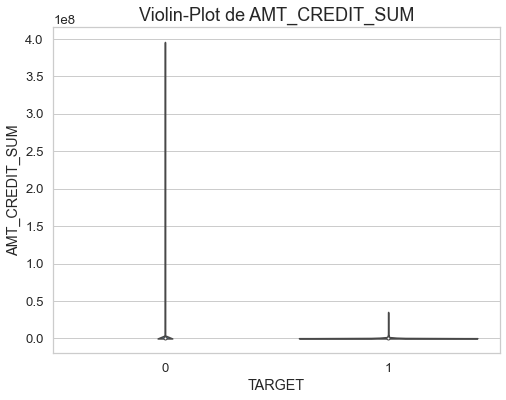

In [235]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'AMT_CREDIT_SUM',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'AMT_CREDIT_SUM',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_CREDIT_SUM_DEBT**

Dette actuelle sur le crédit du Bureau de crédit.

-------------------------------------------------------------------------------
Pecentiles de la variable AMT_CREDIT_SUM_DEBT
Pecentile 0 = -4705600.32
Pecentile 2 = 0.0
Pecentile 4 = 0.0
Pecentile 6 = 0.0
Pecentile 8 = 0.0
Pecentile 10 = 0.0
Pecentile 25 = 0.0
Pecentile 50 = 0.0
Pecentile 75 = 39654.0
Pecentile 100 = 170100000.0
-------------------------------------------------------------------------------


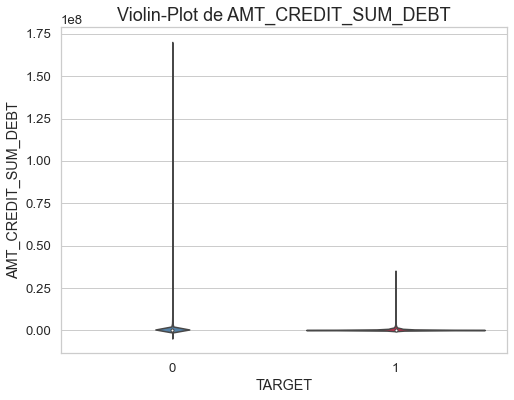

In [236]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'AMT_CREDIT_SUM_DEBT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'AMT_CREDIT_SUM_DEBT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_CREDIT_SUM_LIMIT**

Limite de crédit actuelle de la carte de crédit déclarée dans le Bureau de crédit.

-------------------------------------------------------------------------------
Pecentiles de la variable AMT_CREDIT_SUM_LIMIT
Pecentile 0 = -586406.115
Pecentile 2 = 0.0
Pecentile 4 = 0.0
Pecentile 6 = 0.0
Pecentile 8 = 0.0
Pecentile 10 = 0.0
Pecentile 25 = 0.0
Pecentile 50 = 0.0
Pecentile 75 = 0.0
Pecentile 100 = 4705600.32
-------------------------------------------------------------------------------


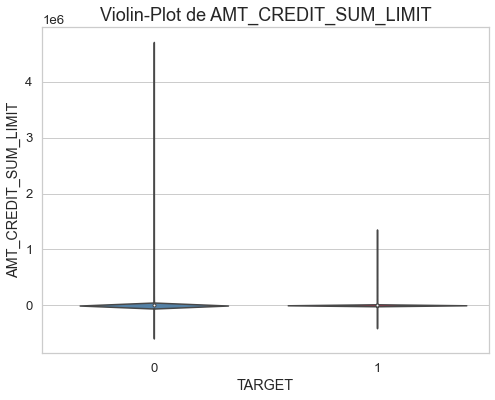

In [237]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'AMT_CREDIT_SUM_LIMIT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'AMT_CREDIT_SUM_LIMIT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_CREDIT_SUM_OVERDUE**

Montant actuel en retard sur le crédit du Bureau de crédit.

-------------------------------------------------------------------------------
Pecentiles de la variable AMT_CREDIT_SUM_OVERDUE
Pecentile 0 = 0.0
Pecentile 2 = 0.0
Pecentile 4 = 0.0
Pecentile 6 = 0.0
Pecentile 8 = 0.0
Pecentile 10 = 0.0
Pecentile 25 = 0.0
Pecentile 50 = 0.0
Pecentile 75 = 0.0
Pecentile 100 = 3756681.0
-------------------------------------------------------------------------------


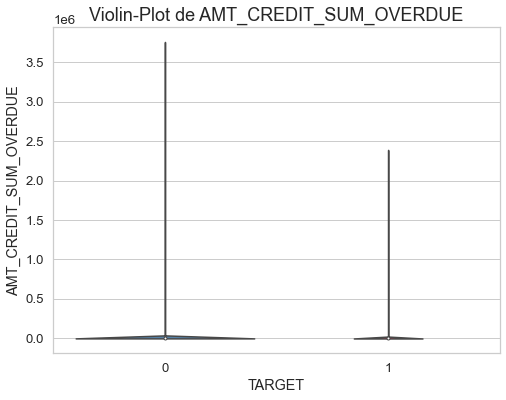

In [238]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'AMT_CREDIT_SUM_OVERDUE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'AMT_CREDIT_SUM_OVERDUE',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

**Variable AMT_ANNUITY**

Annuité du crédit du Bureau de crédit.

-------------------------------------------------------------------------------
Pecentiles de la variable AMT_ANNUITY
Pecentile 0 = 0.0
Pecentile 2 = 0.0
Pecentile 4 = 0.0
Pecentile 6 = 0.0
Pecentile 8 = 0.0
Pecentile 10 = 0.0
Pecentile 25 = 0.0
Pecentile 50 = 67.5
Pecentile 75 = 13990.5
Pecentile 100 = 59586682.5
-------------------------------------------------------------------------------


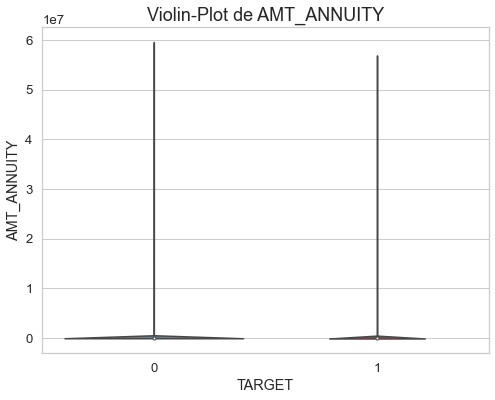

In [239]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_merged, 'AMT_ANNUITY',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(bureau_merged,
                                               'AMT_ANNUITY',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan**:
***
- Les différents quantiles ont pratiquement la même valeur pour les défaillants que pour les non-défaillants.

Cette variable ne sera guère utile pour départager les demandeurs défaillants ou non-défaillants.

### Analyse exploratoire multivariée

**Corrélation entre les variables catégorielles**

**Phi-K Matrix**

-------------------------------------------------------------------------------


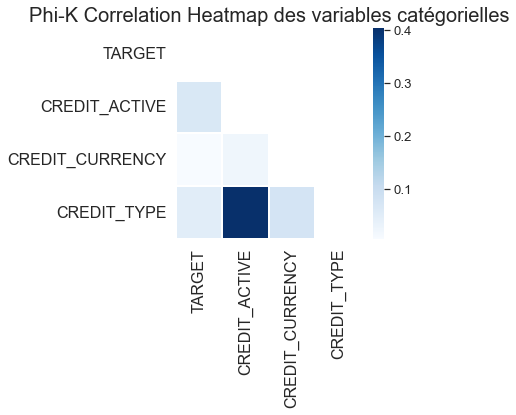

-------------------------------------------------------------------------------
Les catégories présentant les valeurs les plus élevées de la corrélation Phi-K avec la variable cible sont les suivantes :


Variable,Phik-Correlation
CREDIT_ACTIVE,0.064481
CREDIT_TYPE,0.049954
CREDIT_CURRENCY,0.004993


-------------------------------------------------------------------------------


In [240]:
cols_for_phik = ['TARGET', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
                 'CREDIT_TYPE']
eda_kernel_fonctions.plot_phik_matrix(bureau_merged, cols_for_phik,
                                      figsize=(6, 6), fontsize=16)

**Bilan** :
***
La carte thermique ci-dessus montre les valeurs de corrélation Phi-K entre les valeurs catégorielles.

- D'après le coefficient de corrélation Phi-K, nous voyons que la variable CREDIT_TYPE présente une certaine association avec la variable CREDIT_ACTIVE.
- Nous voyons que les variables catégorielles n'ont pas vraiment une association élevée avec la variable TARGET, en particulier la caractéristique CREDIT_CURRENCY.

**Corrélation entre les variables numériques**

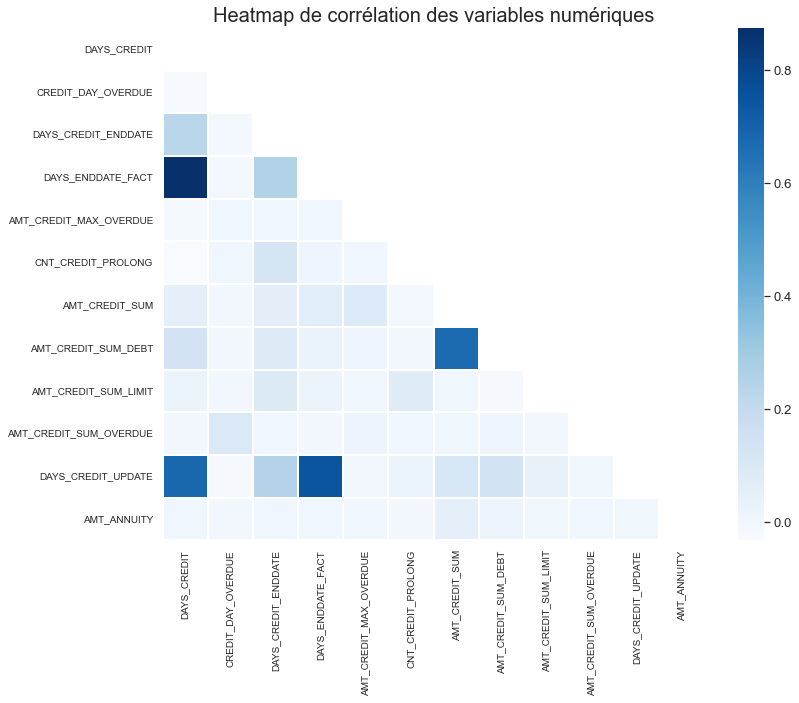

In [241]:
corr_mat = \
    eda_kernel_fonctions.correlation_matrix(bureau_merged,
                                            ['SK_ID_CURR', 'SK_ID_BUREAU'],
                                            cmap='Blues',
                                            figsize=(12, 10))
corr_mat.plot_correlation_matrix()

In [242]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT']
interval columns not set, guessing: ['TARGET', 'CREDIT_DAY_OVERDUE']
interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT_ENDDATE']
interval columns not set, guessing: ['TARGET', 'DAYS_ENDDATE_FACT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_MAX_OVERDUE']
interval columns not set, guessing: ['TARGET', 'CNT_CREDIT_PROLONG']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_DEBT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_LIMIT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_OVERDUE']
interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT_UPDATE']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
-------------------------------------------------------------------------------
Les variables ayant les valeurs les plus élevées de Phik-corrélation avec la variable cible sont le

Column Name,Phik-Correlation
DAYS_CREDIT,0.088651
DAYS_CREDIT_ENDDATE,0.018980
AMT_CREDIT_SUM_OVERDUE,0.005654
AMT_CREDIT_SUM_LIMIT,0.005192
AMT_CREDIT_MAX_OVERDUE,0.004280
CNT_CREDIT_PROLONG,0.003862
CREDIT_DAY_OVERDUE,0.002528
DAYS_CREDIT_UPDATE,0.002219
AMT_CREDIT_SUM_DEBT,0.001695
AMT_CREDIT_SUM,0.000670


-------------------------------------------------------------------------------


**Bilan** :
***
- La carte thermique ci-dessus montre la corrélation entre chaque variables du dataframe bureau et le reste des variables.
- On peut observer que la plupart de la carte thermique a des couleurs claires, ce qui montre peu ou pas de corrélation.
- Cependant, nous pouvons voir quelques nuances foncées qui représentent une forte corrélation.
- La forte corrélation est particulièrement observée pour les variables :
    - DAYS_CREDIT et DAYS_CREDIT_UPDATE.
    - DAYS_ENDDATE_FACT et DAYS_CREDIT_UPDATE
    - AMT_CREDIT_SUM et AMT_CREDIT_SUM_DEBT
    - DAYS_ENDDATE_FACT et DAYS_CREDIT
- Nous pouvons également constater que les variables ne présentent pas de corrélation particulièrement bonne/élevée avec la variable cible en tant que telle, à l'exception de la variable DAYS_CREDIT. 

Cela implique qu'il n'y a pas de relation linéaire directe entre la cible et les caractéristiques.

## Fichier bureau_balance.csv

### Description/statistiques

**Description**

- Ce fichier **bureau_balance.csv** est constitué du solde mensuel de chaque crédit pour chacun des crédits précédents que le demandeur a eu avec des institutions financières autres que Home Credit.

**Compréhension des variables**

In [243]:
df_var_bureau_bal = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'bureau_balance.csv']
df_var_bureau_bal.style.hide_index()

Table,Row,Description,Special
bureau_balance.csv,SK_BUREAU_ID,Recoded ID of Credit Bureau credit (unique coding for each application) - use this to join to CREDIT_BUREAU table,hashed
bureau_balance.csv,MONTHS_BALANCE,Month of balance relative to application date (-1 means the freshest balance date),time only relative to the application
bureau_balance.csv,STATUS,"Status of Credit Bureau loan during the month (active, closed, DPD0-30,… [C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 1-30, 2 means DPD 31-60,… 5 means DPD 120+ or sold or written off ] )",nan


In [244]:
print("-"*79)
print(f'Number of unique SK_ID_BUREAU in bureau_balance.csv are: {len(bureau_balance.SK_ID_BUREAU.unique())}')
print('-'*79)
print(f'Number of unique values for STATUS are: {len(bureau_balance.STATUS.unique())}')
print(f"Unique values of STATUS are:\n{bureau_balance.STATUS.unique()}")
print('-'*79)
print(f"Max number of months for Months Balance: {np.abs(bureau_balance.MONTHS_BALANCE.min())}")
print('-'*79)

-------------------------------------------------------------------------------
Number of unique SK_ID_BUREAU in bureau_balance.csv are: 817395
-------------------------------------------------------------------------------
Number of unique values for STATUS are: 8
Unique values of STATUS are:
['C' '0' 'X' '1' '2' '3' '5' '4']
-------------------------------------------------------------------------------
Max number of months for Months Balance: 96
-------------------------------------------------------------------------------


**Statistiques**

In [245]:
eda_kernel_fonctions.afficher_stats_basic(bureau_balance, 'bureau_balance')

-------------------------------------------------------------------------------
Le jeu de données contient 27299925 lignes et 3 variables.
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans bureau_balance : 0
-------------------------------------------------------------------------------
Contenu des 3 premières lignes :


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C


In [246]:
print("-"*79)
val = len(bureau_balance.SK_ID_BUREAU.unique())
print(f'Nombre de valeurs uniques SK_ID_BUREAU : {val}')
print('-'*79)
val1 = len(bureau_balance.STATUS.unique())
val2 = bureau_balance.STATUS.unique()
print(f'Nombre de valeurs uniques STATUS : {val1}')
print(f"Liste des valeurs uniques de STATUS :\n{val2}")
print('-'*79)
val3 = np.abs(bureau_balance.MONTHS_BALANCE.min())
print(f"Nombre maximal de mois pour le solde des mois : {val3}")
print('-'*79)

-------------------------------------------------------------------------------
Nombre de valeurs uniques SK_ID_BUREAU : 817395
-------------------------------------------------------------------------------
Nombre de valeurs uniques STATUS : 8
Liste des valeurs uniques de STATUS :
['C' '0' 'X' '1' '2' '3' '5' '4']
-------------------------------------------------------------------------------
Nombre maximal de mois pour le solde des mois : 96
-------------------------------------------------------------------------------


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_BUREAU       int64
MONTHS_BALANCE     int64
STATUS            object
dtype: object

,Nombre par type de variable,% des types de variable
int64,2,66.670000
object,1,33.330000


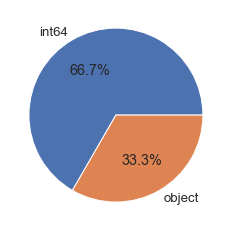

In [247]:
# Types des variables
outils_data.get_types_variables(bureau_balance, True, True, True)

In [248]:
# Résumé des variables
desc_bureau_bal = outils_data.description_variables(bureau_balance)
desc_bureau_bal

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
type,int64,int64,object
nb_nan,0.0,0.0,0.0
%_nan,0.0,0.0,0.0
count,27299925.0,27299925.0,27299925
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,13646993
mean,6036297.332974,-30.741687,NaN
std,492348.856904,23.864509,NaN
min,5001709.0,-96.0,NaN


**Bilan** :
***
- Le fichier bureau_balance.csv contient environ 27,29 millions de lignes et 3 variables.
- Ce fichier contient le statut mensuel de chacun des prêts précédents pour un demandeur particulier, rapporté par le département du Bureau de crédit.
- Il y a 8 valeurs uniques pour le STATUS qui sont codées. Chacune d'entre elles a une signification particulière :
    - C signifie fermé,
    - X signifie statut inconnu,
    - 0 signifie pas de DPD,
    - 1 signifie DPD maximal pendant le mois entre 1-30,
    - 2 signifie DPD 31-60,...
    - 5 signifie DPD 120+ ou vendu ou radié.
- Le solde du mois le plus ancien que nous avons est le statut de 96 mois en arrière, c'est-à-dire que le statut a été fourni jusqu'à 8 ans d'historique pour les prêts pour lesquels ils existent.

**Valeurs manquantes**

Valeurs manquantes : 0 NaN pour 81899775 données (0.0 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


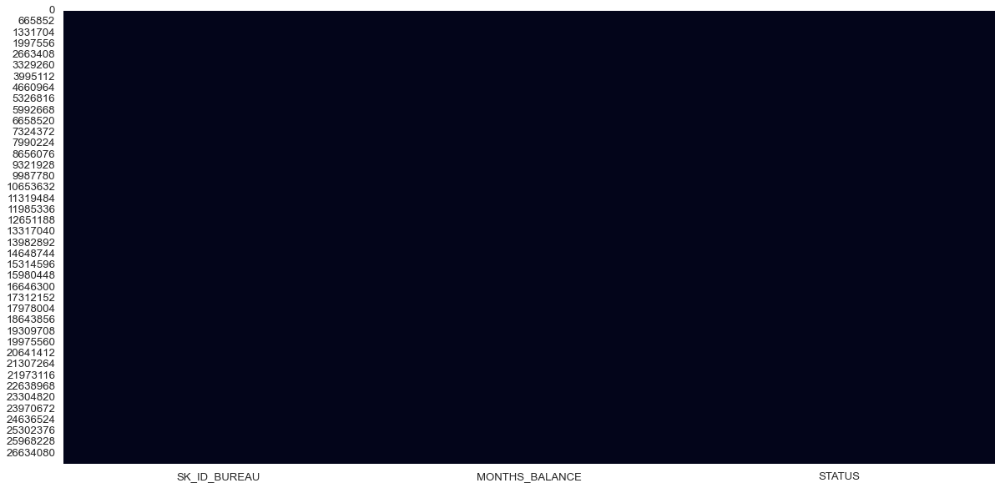

In [249]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(bureau_balance, True, True)

In [250]:
# Réprésentation visuelle des valeurs manquantes
df_nan_bureau_bal = eda_kernel_fonctions.nan_df_create(bureau_balance)
eda_kernel_fonctions.plot_nan_percent(df_nan_bureau_b+
                                      çiugvcal, 'bureau_balance',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

NameError: name 'df_nan_bureau_b' is not defined

**Bilan** :
***
- Aucune donnée manquante.

**Préparation du dataframe de travail**

In [ ]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
print('Création dataframe de travail : merge TARGET avec dataframe bureau')
bureau_merged = application_train.iloc[:, :2].merge(bureau,
                                                    on='SK_ID_CURR',
                                                    how='left')
print("-"*79)

### Analyse exploratoire univariée

***
**Distribution des variables catégorielles**
***

Nous allons maintenant représenter graphiquement certaines des variables catégorielles du dataframe bureau_balance, et voir leur impact sur la variable cible.

In [ ]:
# Liste des variables qualitatives
cols_cat_bureau_bal = \
    bureau_balance.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_bureau_bal

**Variable STATUS**

Statut du prêt du Bureau du crédit durant le mois (actif ou fermé ou DPD0-30... :
- C signifie fermé,
- X signifie état inconnu,
- 0 signifie pas de DPD,
- 1 signifie DPD maximal durant le mois entre 1-30,
- 2 signifie DPD 31-60...,
- 5 signifie DPD 120+ ou vendu ou amorti.

In [ ]:
# Let us first see the unique categories of 'STATUS'
eda_kernel_fonctions.print_unique_categories(bureau_balance,
                                             'STATUS',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variable_bar(bureau_balance, column_name='STATUS',
                                  horizontal_adjust=0.3,
                                  figsize=(15, 7), fontsize_percent=16)

**Bilan** :
***
- Les états des prêts les plus rencontrés sont :
    - C pour prêt fermé (50%),
    - 0 pour 'pas de DPD' (27,5%),
    - X signifie état inconnu (21%).
    - le reste se partage entre les états 1 à 5.
- Plus de 21% des prêts sont dans l'état inconnu.

***
**Distribution des variables quantitatives**
***

In [ ]:
# Liste des variables quantitatives
cols_num = \
    bureau_balance.select_dtypes(include=[np.number]).columns.to_list()
cols_num

**Variable MONTHS_BALANCE**

- Mois du solde par rapport à la date de la demande :
    - -1 signifie que l'information correspond à l'instantané mensuel le plus récent 
    - 0 signifie que l'information correspond à la date de la demande 
- Il s'agit souvent de la même valeur que -1 car de nombreuses banques ne mettent pas régulièrement à jour les informations fournies au Bureau de crédit.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(bureau_balance, 'MONTHS_BALANCE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variable(bureau_balance,
                                              'MONTHS_BALANCE',
                                              plots=['violin'],
                                              figsize=(8, 6))

In [ ]:
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variable(bureau_balance,
                                              'MONTHS_BALANCE',
                                              plots=['box'],
                                              figsize=(8, 6))

**Bilan**:
***
- La médiane est à -25 mois.

## Fichier credit_card_balance.csv

#### 2.5.1. Description/statistiques

**Description**

- Ce fichier **credit_card_balance.csv** comprend les données mensuelles relatives à une ou plusieurs cartes de crédit que le demandeur avait auprès de Home Credit Group.
- Le fichier contient des champs tels que le solde, la limite de crédit, le montant des prélèvements, etc. pour chaque mois de la carte de crédit.

**Compréhension des variables**

In [ ]:
df_var_ccbal = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'credit_card_balance.csv']
df_var_ccbal.style.hide_index()

**Statistiques**

In [ ]:
application_train.name = 'application_train'
application_test.name = 'application_test'
cc_balance.name = 'credit_card_balance'
eda_kernel_fonctions. \
    afficher_stats_basic_all(cc_balance, application_train,
                             application_test, 'SK_ID_PREV')

In [ ]:
# Types des variables
outils_data.get_types_variables(cc_balance, True, True, True)

In [ ]:
# Résumé des variables
desc_bureau = outils_data.description_variables(cc_balance)
desc_bureau

**Bilan** :
***
- Il y a environ 3,84 millions de lignes dans le fichier credit_card_balance.csv, chacune d'entre elles correspondant au statut mensuel de la carte de crédit que le demandeur avait auprès de Home Credit Group.
- Cette table contient 23 variables qui contiennent les statistiques sur le statut de la carte de crédit de chaque mois, comme le montant du solde, le montant des retraits, le nombre de retraits, le statut, etc.
- Il y a 104300 cartes de crédit uniques dont les détails figurent dans ce tableau.
- Sur ces 104300, il y a 103500 SK_ID_CURR uniques.
- Cela signifie que la plupart des demandeurs n'avaient qu'une seule carte de crédit avec eux, et que seuls quelques-uns en avaient plus d'une.
- Ces SK_ID_CURR sont les ID des demandeurs qui ont actuellement demandé un prêt.
- Sur les 103000 SK_ID_CURR uniques, 86900 de ces demandeurs appartiennent à l'ensemble de formation et 16600 à l'ensemble de demandes de test.
- Sur les 307000 demandeurs du fichier application_train.csv, seuls 86900 d'entre eux avaient déjà une carte de crédit avec Home Credit Group.

**Valeurs manquantes**

In [ ]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(cc_balance, True, True)

In [ ]:
# Réprésentation visuelle des valeurs manquantes
df_nan_ccbal = eda_kernel_fonctions.nan_df_create(cc_balance)
eda_kernel_fonctions.plot_nan_percent(df_nan_ccbal, 'credit_card_balance',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

**Bilan** :
***
- Sur les 23 variables, 9 d'entre elles contiennent des valeurs NaN.
- Si nous regardons les pourcentages de valeurs NaN, ils sont considérablement inférieurs au reste des tableaux que nous avons vus jusqu'à présent.
- 7 de ces variables ont près de 20% de valeurs NaN.
- Ces variables sont principalement liées aux montants des tirages et aux nombres de tirages.
- Les deux autres caractéristiques sont liées aux statistiques sur les versements.

**Préparation du dataframe de travail**

In [ ]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
print('Création dataframe de travail : merge TARGET avec dataframe cc_balance')
cc_balance_merged = application_train.iloc[:, :2].merge(cc_balance,
                                                        on='SK_ID_CURR',
                                                        how='left')
print("-"*79)

#### 2.5.2. Analyse exploratoire univariée

***
**Distribution des variables catégorielles**
***

Nous allons maintenant représenter graphiquement certaines des variables catégorielles du dataframe credit_card_balance.csv, et voir leur impact sur la variable cible.

In [ ]:
# Liste des variables qualitatives
cols_cat_ccbal = \
    cc_balance_merged.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_ccbal

**Variable NAME_CONTRACT_STATUS**

État du contrat au cours du mois.

In [ ]:
# Let us first see the unique categories of 'NAME_CONTRACT_STATUS'
eda_kernel_fonctions.print_unique_categories(cc_balance_merged,
                                             'NAME_CONTRACT_STATUS',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(cc_balance_merged,
                                   column_name='NAME_CONTRACT_STATUS',
                                   figsize=(15, 8), rotation=90,
                                   horizontal_adjust=0.25,
                                   fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#905998', '#e6e64c',
                                             '#cb3335', '#59a257',
                                             '#477ca8', '#df7f20'])

**Bilan** :
***
- La majorité des états des contrats des prêts sont Actif ou Terminé.
- Pour les défaillants, l'état des contrat sont demandé, réfusé puis actif ou signé.
- Les non-défaillants ont plus de prêts actifs que les défaillants.

***
**Distribution des variables quantitatives**
***

In [ ]:
# Liste des variables quantitatives
cols_num = \
    cc_balance_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num

Tout d'abord, nous allons regrouper par le champ 'SK_ID_PREV' et agréger avec la moyenne, afin d'obtenir une ligne moyenne pour chacun des prêts précédents du demandeur.

In [ ]:
cc_balance_merged = cc_balance_merged.groupby('SK_ID_PREV').mean()

**Variable AMT_BALANCE**

Cette variable indique le montant moyen du solde qu'une personne avait habituellement sur son compte de carte de crédit pour le prêt précédent.

In [ ]:
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_BALANCE',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Le graphique ci-dessus montre que les défaillants ont une valeur d'AMT_BALANCE plus élevée que les non-défaillants. Ils présentent des valeurs plus élevées pour tous les quantiles et même pour les moustaches. Cela pourrait signifier que le montant du crédit pour les défaillants pourrait aussi être relativement plus élevé que pour les non-défaillants.
- Nous constatons que les défaillants semblent ici aussi avoir un versement minimum plus élevé chaque mois par rapport aux non défaillants. Cela renseigne généralement sur les habitudes de dépense et d'emprunt des personnes. Les défaillants ont des habitudes de dépenses et d'emprunt plus élevées que les non défaillants.

**Variable AMT_TOTAL_RECEIVABLE**

Cette variable décrit la moyenne du montant total à recevoir sur le crédit précédent.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_TOTAL_RECEIVABLE',
                                               plots=['violin'],
                                               figsize=(8, 6))
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_TOTAL_RECEIVABLE',
                                               plots=['box'],
                                               figsize=(8, 6))
# Affiche PDF
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_BALANCE',
                                               plots=['distplot'],
                                               figsize=(8, 6))

**Bilan** :
***
- En regardant le boxplot d'AMT_TOTAL_RECEIVABLE, nous constatons un comportement similaire à celui observé pour les autres montants, à savoir que les défaillants ont généralement un montant à recevoir plus élevé pour leur crédit précédent, ce qui peut impliquer des montants plus élevés de crédits qu'ils ont pu prendre.
- Le PDF montre également un pic très élevé à des montants inférieurs pour les non-défaillants par rapport aux défaillants.

**Variable CNT_INSTALMENT_MATURE_CUM**

La variable décrit le nombre moyen de versements effectués sur les crédits précédents.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'CNT_INSTALMENT_MATURE_CUM',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
Le graphique ci-dessus montre un comportement très intéressant. Ce graphique montre que les non-défaillants ont généralement une fourchette de valeurs plus élevée pour le nombre de versements payés que les défaillants. Cela pourrait montrer le comportement des défaillants, qui paient généralement moins d'acomptes sur leur crédit précédent.

**Variable MONTHS_BALANCE**

Mois du solde par rapport à la date d'application (-1 signifie la date de solde la plus récente).

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'MONTHS_BALANCE',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Le mois du solde des défaillants sont plus récent que celui des non-défaillants.

**Variable AMT_CREDIT_LIMIT_ACTUAL**

Limite de la carte de crédit au cours du mois du crédit précédent.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_CREDIT_LIMIT_ACTUAL',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- La limite de la carte de crédit est légèrement inférieure pour les non-défailants.

**Variable AMT_DRAWINGS_ATM_CURRENT**

Montant retiré au guichet automatique pendant le mois du crédit précédent.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_DRAWINGS_ATM_CURRENT',
                                               plots=['box'],
                                               figsize=(8, 6))
# Zoom
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_DRAWINGS_ATM_CURRENT',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[0, 1000])

**Bilan** :
***
- Le montant retiré au guichet automatique pendant le mois du crédit précédent est légèrement supérieur pour les défaillants que les non-défaillants.

**Variable AMT_DRAWINGS_CURRENT**

Montant prélevé au cours du mois du crédit précédent.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_DRAWINGS_CURRENT',
                                               plots=['box'],
                                               figsize=(8, 6))
# Zoom
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_DRAWINGS_CURRENT',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[0, 0.05e6])

**Bilan** :
***
- Le montant prélevé au cours du mois du crédit précédent est supérieur pour les défaillants que pour les non-défaillants. Les défaillants font plus de dépenses que les non-défaillants.

**Variable AMT_DRAWINGS_OTHER_CURRENT**

Montant des autres prélèvements au cours du mois du crédit précédent

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_DRAWINGS_OTHER_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
 - Plus de petits montants prélevés pour défaillants que les non-défaillants.

**Variable AMT_DRAWINGS_POS_CURRENT**

Montant des prélèvements ou des achats de marchandises au cours du mois du crédit précédent.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_DRAWINGS_POS_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Les petits montants des prélèvements ou des achats de marchandises au cours du mois de la crédibilité précédente sont plus nombreux pour les défaillants et inversement.

**Variable AMT_INST_MIN_REGULARITY**

Versement minimal pour ce mois du crédit précédent.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_INST_MIN_REGULARITY',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
Le versement minimal est plus important pour les non-défaillants.

**Variable AMT_PAYMENT_CURRENT**

Combien le demandeur a-t-il payé pendant le mois sur le crédit précédent ?

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_PAYMENT_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu des différences entre les défaillants ou non.
- Un outlier avec paiement > 4000000 à supprimer.

**Variable AMT_PAYMENT_TOTAL_CURRENT**

Combien le demandeur a-t-il payé au total pendant le mois sur le crédit précédent ?

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_PAYMENT_TOTAL_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Les demandeurs non-défaillants ont payé plsu au total pendant le mois sur le crédit précédent que les défaillants.

**Variable AMT_RECEIVABLE_PRINCIPAL**

Montant à recevoir pour le principal du crédit précédent.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_RECEIVABLE_PRINCIPAL',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
Le montant à recevoir pour le principal du crédit précédent est bien supérieur pour les non-défaillants que les défaillants.

**Variable AMT_RECIVABLE**

Montant à recevoir sur le crédit précédent.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'AMT_RECIVABLE',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
Le montant à recevoir sur le crédit précédent est bien supérieur pour les non-défaillants que les défaillants.

**Variable CNT_DRAWINGS_ATM_CURRENT**

Nombre de retraits au guichet automatique durant ce mois sur le crédit précédent.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'CNT_DRAWINGS_ATM_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Un peu moins de retraits automatiques pour les défaillants.

**Variable CNT_DRAWINGS_CURRENT**

Nombre de retraits pendant ce mois sur le crédit précédent.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'CNT_DRAWINGS_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
Le nombre de retraits pendant ce mois sur le crédit précédent est plus important pour les non-défaillants.

**Variable CNT_DRAWINGS_OTHER_CURRENT**

Nombre d'autres retraits au cours de ce mois sur le crédit précédent.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'CNT_DRAWINGS_OTHER_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
Le nombre d'autres retraits au cours de ce mois sur le crédit précédent est plus nombreux pour les défaillants.


**Variable CNT_DRAWINGS_POS_CURRENT**

Nombre de retraits de marchandises durant ce mois sur le crédit précédent.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'CNT_DRAWINGS_POS_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
Le nombre de retraits de marchandises durant ce mois sur le crédit précédent est plus nombreux pour les non-défaillants.

**Variable SK_DPD**

DPD (jours de retard) au cours du mois sur le crédit précédent.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'SK_DPD',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence entre les défaillants et les non-défaillants.

**Variable SK_DPD_DEF**

DPD (jours de retard) au cours du mois sur le crédit précédent.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(cc_balance_merged,
                                               'SK_DPD_DEF',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
Les DPDs (jours de retard) au cours du mois sur le crédit précédent sont plus nombreux pour les non-défaillants.

#### 2.6.3. Analyse exploratoire multivariée

**Corrélation entre les variables numériques**

In [ ]:
corr_mat = \
    eda_kernel_fonctions.correlation_matrix(cc_balance_merged,
                                            ['SK_ID_CURR', 'SK_ID_PREV'],
                                            cmap='Blues',
                                            figsize=(13, 11))
corr_mat.plot_correlation_matrix()

In [ ]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

**Bilan** :
***
- La carte thermique ci-dessus montre visuellement la corrélation entre les variables du fichier credit_card_balance.csv.
- À partir de la carte thermique de la matrice de corrélation, nous voyons quelques couples de variables fortement corrélées. 
- Il s'agit de :
    - AMT_RECEIVABLE_PRINCIPLE,
    - AMT_RECIVABLE,
    - AMT_TOTAL_RECEIVABLE
    - et AMT_BALANCE.
- Nous observons également une forte corrélation entre ces 2 variables :
    - AMT_PAYMENT_TOTAL_CURRENT,
    - et AMT_PAYMENT_CURRENT.
- Les ensembles des 2ème et 3ème variables en corrélation sont compréhensibles car ils ont plus ou moins la même histoire.
- La corrélation des variables avec la variable cible n'est pas perceptible, ce qui montre l'absence d'une relation linéaire entre la caractéristique et la variable cible.

## Fichier installments_payments.csv

#### 2.6.1. Description/statistiques

**Description**

- Ce fichier **installments_payments.csv** présente l'historique de remboursement de chacun des prêts que le demandeur a contractés auprès de Home Credit Group.
- Le tableau contient des variables telles que le montant des versements, combien le demandeur a payé pour chaque versement, etc.

**Compréhension des variables**

In [ ]:
df_var_instpaie = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'installments_payments.csv']
df_var_instpaie.style.hide_index()

**Statistiques**

In [ ]:
installments_payments.name = 'installments_payments'
eda_kernel_fonctions. \
    afficher_stats_basic_all(installments_payments, application_train,
                             application_test, 'SK_ID_PREV')

In [ ]:
# Types des variables
outils_data.get_types_variables(installments_payments, True, True, True)

In [ ]:
# Résumé des variables
desc_bureau = outils_data.description_variables(installments_payments)
desc_bureau

**Bilan** :
***
- Il y a environ 13,6 millions de points de données dans le fichier installments_payments.csv.
- Chaque ligne représente l'historique des versements liés à un prêt particulier que le demandeur a eu précédemment avec Home Credit Group.
- Il y a 997000 prêts antérieurs uniques dans le fichier installments_payments. Ils appartiennent à 339000 SK_ID_CURR uniques, qui sont les ID des demandeurs du prêt actuel.
- Sur ces 339000 SK_ID_CURR, 291000 appartiennent à l'ensemble de données d'apprentissage et 47900 à l'ensemble de données de test.
- Cela implique que sur les 307000 SK_ID_CURR uniques de l'application_train, 291000 ont déjà eu une forme de prêt avec Home Credit. - De même, pour 48700 de ceux qui sont dans l'ensemble de données de test, 47900 ont eu un prêt auparavant avec Home Credit.
- Le fichier a 8 variables uniques, dont 6 décrivent les statistiques de chaque versement pour le prêt précédent.

**Valeurs manquantes**

In [ ]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(installments_payments, True, True)

In [ ]:
# Réprésentation visuelle des valeurs manquantes
df_nan_instpaie = eda_kernel_fonctions.nan_df_create(installments_payments)
eda_kernel_fonctions.plot_nan_percent(df_nan_instpaie, 'installments_payments',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

**Bilan** :
***
- Il n'y a que 2 variables qui contiennent des valeurs NaN sur les 8 variables de installments_payments.
- Ces variables contiennent également une proportion très minime de valeurs NaN, c'est-à-dire seulement 0,02%, ce qui n'est pas très inquiétant.

**Préparation du dataframe de travail**

In [ ]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
part1 = 'Création dataframe de travail : merge TARGET '
print(part1 + 'avec dataframe installments_payments')
installments_merged = \
    application_train.iloc[:, :2].merge(installments_payments,
                                        on='SK_ID_CURR',
                                        how='left')
print("-"*79)

#### 2.6.2. Analyse exploratoire univariée

***
**Distribution des variables quantitatives**
***

In [ ]:
# Liste des variables quantitatives
cols_num_instpaie = \
    installments_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num_instpaie

Tout d'abord, nous allons regrouper par le champ 'SK_ID_PREV' et agréger avec la moyenne, afin d'obtenir une ligne moyenne pour chacun des prêts précédents du demandeur.

In [ ]:
installments_merged = installments_merged.groupby('SK_ID_PREV').mean()

**Variable DAYS_INSTALMENT**

Cette variable indique les jours où le versement du crédit précédent devait être payé.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged,
                                               'DAYS_INSTALMENT',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Les jours où le versement du précédent devait être payé est inférieur pour les défaillants.

**Variable DAYS_ENTRY_PAYMENT**

Cette variable indique les jours où le versement du crédit précédent a été effectivement payé.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged,
                                               'DAYS_ENTRY_PAYMENT',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Les deux graphiques ci-dessus montrent une tendance similaire : les mauvais payeurs ont tendance à avoir moins de jours depuis leur dernier paiement, tandis que les mauvais payeurs ont plus de jours depuis leur dernier paiement.
- Tous les quantiles des défaillants ont plus de jours récents que ceux des non-défaillants. Ainsi, les non-défaillants ont généralement plus d'écart dans leurs paiements depuis le jour de la demande que les défaillants.

**Variable NUM_INSTALMENT_VERSION**

Version du calendrier des versements (0 pour la carte de crédit) du crédit précédent. Le changement de la version des versements d'un mois à l'autre signifie qu'un paramètre du calendrier de paiement a changé.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged,
                                               'NUM_INSTALMENT_VERSION',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Plus de modification de calendrier pour les non-défaillants.

**Variable NUM_INSTALMENT_NUMBER**

Sur quel versement nous observons le paiement.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged,
                                               'NUM_INSTALMENT_NUMBER',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable AMT_INSTALMENT**

Quel était le montant de l'acompte prescrit du crédit précédent sur cet acompte ?

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged,
                                               'AMT_INSTALMENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable AMT_PAYMENT**

Ce que le demandeur a effectivement payé sur le crédit précédent pour ce versement.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(installments_merged,
                                               'AMT_PAYMENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

#### 2.6.3. Analyse exploratoire multivariée

**Corrélation entre les variables numériques**

In [ ]:
corr_mat = \
    eda_kernel_fonctions.correlation_matrix(installments_merged,
                                            ['SK_ID_CURR', 'SK_ID_PREV'],
                                            cmap='Blues',
                                            figsize=(8, 7))
corr_mat.plot_correlation_matrix()

In [ ]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

**Bilan** :
***
- La carte thermique ci-dessus montre la corrélation entre chaque variable du fichier installments_payments.csv et le reste des variables.
- À partir de la carte thermique de la matrice de corrélation, nous voyons un couple de variables fortement corrélées. Il s'agit de :
    - AMT_INSTALMENT et AMT_PAYMENT,
    - DAYS_INSTALMENT et DAYS_ENTRY_PAYMENT.
- Ces deux ensembles de variables corrélées sont compréhensibles, car il s'agit en fait des variables relatives à la date à laquelle l'acompte devait être payé par rapport à la date à laquelle il a été payé, ainsi qu'au montant qui était dû par rapport au montant qui a été payé.
- Ces variables seront utiles pour créer de nouveaux ensembles de variables totalement non corrélées.
- La corrélation des variables avec la cible n'est pas perceptible, ce qui montre l'absence d'une relation linéaire entre la variable et la variable cible.

## Fichier POS_CASH_balance.csv

#### 2.7.1. Description/statistiques

**Description**

- Ce fichier **POS_CASH_balance.csv** contient les instantanés des soldes mensuels des prêts aux points de vente et des prêts en espèces que le demandeur a obtenus auprès de Home Credit Group.
- Le fichier contient des colonnes telles que le statut du contrat, le nombre de versements restants, etc.

**Compréhension des variables**

In [ ]:
df_var_posh = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'POS_CASH_balance.csv']
df_var_posh.style.hide_index()

**Statistiques**

In [ ]:
POS_CASH_balance.name = 'POS_CASH_balance'
application_train.name = 'application_train'
application_test.name = 'application_test'
eda_kernel_fonctions. \
    afficher_stats_basic_all(POS_CASH_balance, application_train,
                             application_test, 'SK_ID_PREV')

In [ ]:
# Types des variables
outils_data.get_types_variables(POS_CASH_balance, True, True, True)

In [ ]:
# Résumé des variables
desc_bureau = outils_data.description_variables(POS_CASH_balance)
desc_bureau

**Bilan** :
***
- Le fichier POSH_CASH_BALANCE.csv contient environ 10 millions de points de données, où chaque ligne correspond à l'instantané mensuel de l'état du POS et du prêt d'argent précédent que le demandeur a eu avec Home Credit Group.
- Elle se compose de 8 variables, dont deux sont SK_ID_CURR et SK_ID_PREV.
- Il y a 936000 identifiants uniques de prêts précédents dans le fichier, qui correspondent à 337000 demandeurs actuels uniques (SK_ID_CURR).
- Sur ces 337000 SK_ID_CURR, 289000 appartiennent à l'ensemble de formation et 47800 à l'ensemble de test.

**Valeurs manquantes**

In [ ]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(POS_CASH_balance, True, True)

In [ ]:
# Réprésentation visuelle des valeurs manquantes
df_nan_posh = eda_kernel_fonctions.nan_df_create(POS_CASH_balance)
eda_kernel_fonctions.plot_nan_percent(df_nan_posh, 'POS_CASH_balance',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

**Bilan** :
***
- Il y a seulement 2 variables qui contiennent des valeurs NaN des 8 variables de POS_CASH_balance.
- Ces variables sont le nombre de versements restants et la durée du prêt.
- Ces variables contiennent également une proportion très minime de valeurs NaN, c'est-à-dire seulement 0,26 %, ce qui n'est pas très préoccupant.

**Préparation du dataframe de travail**

In [ ]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
var1 = 'Création dataframe de travail : merge TARGET '
print(var1 + 'avec dataframe POS_CASH_balance')
pos_cash_merged = application_train.iloc[:, :2].merge(POS_CASH_balance,
                                                      on='SK_ID_CURR',
                                                      how='left')
print("-"*79)

#### 2.7.2. Analyse exploratoire univariée

***
**Distribution des variables catégorielles**
***

Tout d'abord, nous allons regrouper par le champ 'SK_ID_PREV' et agréger avec la moyenne, afin d'obtenir une ligne moyenne pour chacun des prêts précédents du demandeur.

In [ ]:
# Liste des variables qualitatives
cols_cat_posh = \
    pos_cash_merged.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_posh

**Variable NAME_CONTRACT_STATUS**

État du contrat au cours du mois.

In [ ]:
# Let us first see the unique categories of 'NAME_CONTRACT_STATUS'
eda_kernel_fonctions.print_unique_categories(pos_cash_merged,
                                             'NAME_CONTRACT_STATUS')

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(pos_cash_merged,
                                   column_name='NAME_CONTRACT_STATUS',
                                   figsize=(25, 12), rotation=90,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999'],
                                   palette2=['#e890be', '#965a38',
                                             '#df7f20', '#905998',
                                             '#59a257', '#e6e64c',
                                             '#477ca8', '#cb3335'])

**Bilan** :
***
- La majorité des états des contrats des prêts sont Actif ou Terminé.
- Pour les défaillants, l'état des contrat sont en priorité tous sauf ceux de la majorité des demandeurs Actifs ou Terminés.
- Les non-défaillants ont plus de prêts actifs que les défaillants.

***
**Distribution des variables quantitatives**
***

In [ ]:
# Liste des variables quantitatives
cols_num_posh = \
    pos_cash_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num_posh

**Variable MONTHS_BALANCE**

Mois du solde par rapport à la date d'application (-1 signifie la date de solde la plus récente).

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(pos_cash_merged,
                                               'MONTHS_BALANCE',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable CNT_INSTALMENT**

Durée du crédit précédent (peut changer avec le temps).

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(pos_cash_merged,
                                               'CNT_INSTALMENT',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable CNT_INSTALMENT_FUTURE**

Versements restant à payer sur le crédit précédent.

In [ ]:
# Affiche Boxplot
eda_kernel_fonctions.plot_continuous_variables(pos_cash_merged,
                                               'CNT_INSTALMENT_FUTURE',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Les versements sont légèrement plus élevés pour les défaillants.

**Variable SK_DPD**

DPD (jours de retard) au cours du mois du crédit précédent.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(pos_cash_merged,
                                               'SK_DPD',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable SK_DPD_DEF**

DPD au cours du mois avec tolérance (les dettes de faible montant sont ignorées) du crédit précédent.

In [ ]:
# Affiche Violinplot
eda_kernel_fonctions.plot_continuous_variables(pos_cash_merged,
                                               'SK_DPD_DEF',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

#### 2.7.3. Analyse exploratoire multivariée

**Corrélation entre les variables numériques**

In [ ]:
corr_mat = \
    eda_kernel_fonctions.correlation_matrix(pos_cash_merged,
                                            ['SK_ID_CURR', 'SK_ID_PREV'],
                                            cmap='Blues',
                                            figsize=(7, 6))
corr_mat.plot_correlation_matrix()

In [ ]:
# Seeing the top columns with highest phik-correlation with the target
# variable in pos_cash_merged table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

**Bilan** :
***
- La carte thermique ci-dessus montre la corrélation entre les variables.
- A partir de la carte de chaleur de la matrice de corrélation, nous avons un ensemble de variables modérément corrélées, qui sont : 
    - CNT_INSTALMENT et CNT_INSTALMENT_FUTURE.
- La corrélation des variables avec la cible est très faible, ce qui montre l'absence d'une relation linéaire entre la variables et la variable cible.

## Fichier previous_application.csv

#### 2.8.1. Description/statistiques

**Description**

- Ce fichier **previous_application.csv** contient les données statiques du précédent prêt que le demmdeur a eu avec Home Credit. 

**Compréhension des variables**

In [ ]:
df_var_prev = \
    HomeCredit_columns_description[HomeCredit_columns_description['Table']
                                   == 'previous_application.csv']
df_var_prev.style.hide_index()

**Statistiques**

In [ ]:
previous_application.name = 'credit_card_balance'
application_train.name = 'application_train'
application_test.name = 'application_test'
eda_kernel_fonctions. \
    afficher_stats_basic_all(previous_application, application_train,
                             application_test, 'SK_ID_PREV')

In [ ]:
# Types des variables
outils_data.get_types_variables(previous_application, True, True, True)

In [ ]:
# Résumé des variables
desc_bureau = outils_data.description_variables(previous_application)
desc_bureau

**Bilan** :
***
- Le fichier previous_application.csv est composée de 1.67 millions de lignes au total.
- Chaque ligne correspond à chacun des prêts précédents que le demandeur a eu avec Home Credit Group. 
- Il est possible pour un même demandeur de la demande actuelle d'avoir plusieurs prêts précédents avec Home Credit Group.
- Il y a 37 variables dans previous_application.csv, qui contiennent les détails sur le prêt précédent.
- Il y a 338000 SK_ID_CURR uniques dans previous_application, dont 291000 correspondent aux SK_ID_CURR de l'application_train et 47800 correspondent aux SK_ID_CURR de l'application_test.

**Valeurs manquantes**

In [ ]:
# Valeurs manquantes du dataframe
outils_data.get_missing_values(previous_application, True, True)

In [ ]:
# Réprésentation visuelle des valeurs manquantes
df_nan_prev = eda_kernel_fonctions.nan_df_create(previous_application)
eda_kernel_fonctions.plot_nan_percent(df_nan_prev, 'previous_application',
                                      grid=True, fontsize=20,
                                      figsize=(20, 10))

**Bilan** :
***
- Il y a 16 variables sur les 37 variables qui contiennent des valeurs NaN.
- Deux de ces variables ont 99,64% de valeurs manquantes, ce qui est très élevé, et nous devrons trouver un moyen intelligent de gérer des valeurs NaN aussi élevées. 
- Nous ne pouvons pas directement écarter une variable à ce stade.
- En dehors de ces deux variables, le reste des variables contient également > 40% de valeurs NaN, à l'exception de 5 variables.

**Préparation du dataframe de travail**

In [ ]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
var = 'Création dataframe de travail : merge TARGET '
print(var + 'avec dataframe previous_application')
prev_merged = application_train.iloc[:, :2].merge(previous_application,
                                                  on='SK_ID_CURR',
                                                  how='left')
print("-"*79)

#### 2.8.2. Analyse exploratoire univariée

***
**Distribution des variables catégorielles**
***

Nous allons maintenant représenter graphiquement certaines des variables catégorielles du dataframe previous_application, et voir leur impact sur la variable cible.

In [ ]:
# Liste des variables qualitatives
cols_cat_prev = \
    prev_merged.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_prev

**Variable NAME_CONTRACT_TYPE**

Type de produit contractuel (prêt d'argent ou prêt à la consommation [POS]...) de la demande précédente.

In [ ]:
# Let us first see the unique categories of 'NAME_CONTRACT_TYPE'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_CONTRACT_TYPE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CONTRACT_TYPE',
                                   horizontal_adjust=0.3,
                                   figsize=(20, 10), fontsize_percent=18,
                                   rotation=90,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#905998', '#59a257',
                                             '#cb3335', '#477ca8'])

**Bilan** :
***
À partir des graphiques ci-dessus, nous pouvons observer ce qui suit :

- D'après le premier sous-graphe, nous voyons que la plupart des prêts précédents ont été des prêts d'argent ou des prêts à la consommation, qui correspondent à environ 44% des prêts chacun. 
- Les 11,41% restants correspondent à des prêts revolving, et il y a quelques prêts nommés XNA dont les types ne sont en fait pas connus, mais ils sont très peu nombreux.
- En regardant le deuxième sous-graphe, nous voyons que le pourcentage de défaillants pour le type de prêt XNA est le plus élevé, avec un taux de défaillance de 20%.
- Le deuxième taux de défaut le plus élevé est celui des prêts revolving, qui est proche de 10,5 %.
- Les prêts d'argent ont des taux de défaillance moins élevés, environ 9%, tandis que les prêts à la consommation ont tendance à avoir le plus faible pourcentage de défaillants, qui est proche de 7,5%.

**Variable NAME_CONTRACT_STATUS**

État du contrat (approuvé ou annulé ...) de la demande précédente.

In [ ]:
# Let us first see the unique categories of 'NAME_CONTRACT_STATUS'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_CONTRACT_STATUS',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CONTRACT_STATUS',
                                   horizontal_adjust=0.25,
                                   figsize=(20, 8), fontsize_percent=18,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#59a257', '#477ca8',
                                             '#905998', '#cb3335'])

**Bilan** :
***
D'après les graphiques ci-dessus, nous constatons que :

- Le type le plus courant de statut de contrat est le statut approuvé. Environ 63% des crédits précédents ont un statut approuvé. Les deux statuts les plus courants suivants sont Annulé et Refusé, qui correspondent tous deux à environ 18% des prêts. Cela implique que la plupart des prêts sont approuvés et que seule une partie d'entre eux ne le sont pas. Le type d'état contractuel le moins fréquent est Offre non utilisée, qui correspond à seulement 1,61% de tous les prêts.
- Si l'on regarde le deuxième graphique secondaire pour le pourcentage de défaillants, on constate que les prêts qui avaient auparavant le statut Refusé ont tendance à être les plus défaillants dans les prêts actuels. Ils correspondent à environ 12% des défaillants de cette catégorie. Ils sont suivis par les prêts annulés qui correspondent à près de 9% du taux de défaillance. Ce comportement est assez attendu logiquement, puisque ces personnes ont dû être refusées parce qu'elles n'avaient pas le profil adéquat. Le taux de défaillance le plus faible est observé pour le statut de contrat Approuvé.

**Variable CODE_REJECT_REASON**

Pourquoi la demande précédente a-t-elle été rejetée ?

In [ ]:
# Let us first see the unique categories of 'CODE_REJECT_REASON'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'CODE_REJECT_REASON',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='CODE_REJECT_REASON',
                                   horizontal_adjust=0.18,
                                   figsize=(20, 8), fontsize_percent=18,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999'],
                                   palette2=['#e6e64c', '#59a257',
                                             '#477ca8', '#965a38',
                                             '#905998', '#e890be',
                                             '#df7f20', '#cb3335',
                                             '#999999'])

**Bilan** :
***
Le graphique ci-dessus montre la distribution de la variable catégorielle CODE_REJECT_REASON. 

Les idées suivantes peuvent être générées à partir du graphique ci-dessus :
- Le type de raison de rejet le plus courant est XAP, qui représente environ ~81%. Les autres raisons ne représentent qu'une petite partie des raisons de rejet. HC est le deuxième motif de rejet le plus fréquent avec seulement 10,33% d'occurrences.
- La distribution du pourcentage de défaillants pour chaque catégorie de CODE_REJECT_REASON est assez intéressante. Les demandeurs dont les demandes précédentes ont été rejetées par le code SCOFT ont le pourcentage le plus élevé de défaillants parmi eux (~21%). Ils sont suivis par LIMIT et HC, qui comptent respectivement 12,5 % et 12 % de défaillants.
- Le motif de rejet le plus courant, XAP, ne correspond qu'à 7,5 % des défaillants, et représente le deuxième plus faible pourcentage de défaillants après le code SYSTEM.

**Variable CHANNEL_TYPE**

Cette variable décrit le canal par lequel le demander a été acquis pour le prêt précédent dans Home Credit.

In [ ]:
# Let us first see the unique categories of 'CHANNEL_TYPE'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'CHANNEL_TYPE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='CHANNEL_TYPE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be'],
                                   palette2=['#e6e64c', '#df7f20',
                                             '#cb3335', '#477ca8',
                                             '#905998', '#59a257',
                                             '#965a38', '#e890be'])

**Bilan** :
***
Les deux graphiques ci-dessus montrent la distribution de CHANNEL_TYPE pour les prêts antérieurs dans Home Credit.

- Le premier graphique montre que la plupart des demandes ont été acquises par le biais des bureaux de crédit et de caisse, soit environ 42,47% des demandes, suivies par le canal national qui correspond à 29,93% des demandes. Le reste des types de canaux ne correspondait qu'à un nombre restreint de demandes.
- Le pourcentage de défaillance le plus élevé a été observé parmi les demandes pour lesquelles le type de canal était AP+ (prêt en espèces), ce qui correspondait à environ 13% de défaillants dans cette catégorie. Les autres canaux présentaient des pourcentages de défaillance plus faibles que celui-ci. Le canal Car Dealer a montré le plus faible pourcentage de défaillants dans cette catégorie (seulement 5%).

**Variable PRODUCT_COMBINATION**

Combinaison détaillée des produits de la demande précédente.

In [ ]:
# Let us first see the unique categories of 'CREDIT_ACTIVE'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'PRODUCT_COMBINATION',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='PRODUCT_COMBINATION',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(25, 15), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675', '#95a3c3',
                                             '#db96c0', '#a2c865',
                                             '#e5c949', '#2f51a1',
                                             '#d91a61'],
                                   palette2=['#95a3c3', '#e99675',
                                             '#72b6a1', '#e6e64c',
                                             '#db96c0', '#cb3335',
                                             '#999999', '#59a257',
                                             '#a2c865', '#e5c949',
                                             '#905998', '#477ca8',
                                             '#d91a61', '#e890be',
                                             '#df7f20', '#965a38',
                                             '#2f51a1'])

**Bilan** :
***
A partir de la distribution de PRODUCT_COMBINATION, nous pouvons générer les informations suivantes :
- Les trois types de combinaison de produits les plus courants sont l'argent liquide, les points de vente domestiques avec intérêt et les points de vente mobiles avec intérêt. Ils correspondent à environ 50% de toutes les demandes.
- En regardant le graphique du pourcentage de défaillants par catégorie, nous constatons que la tendance à la défaillance est la plus élevée chez Cash Street : catégorie mobile, Cash X-sell : élevé, Cash Street : élevé et Card Street qui sont tous proches de 11-11,5% de défaillants par catégorie. Le pourcentage le plus faible de défaillants se trouve dans la catégorie POS Industry without interest, qui correspond à environ 4,5% de défaillants.

**Variable WEEKDAY_APPR_PROCESS_START**

Quel jour de la semaine le demandeur a-t-il demandé le prêt ?

In [ ]:
# Let us first see the unique categories of 'WEEKDAY_APPR_PROCESS_START'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'WEEKDAY_APPR_PROCESS_START',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='WEEKDAY_APPR_PROCESS_START',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(15, 10), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#df7f20', '#59a257',
                                             '#477ca8', '#905998',
                                             '#cb3335', '#e6e64c',
                                             '#965a38'])

**Bilan** :
***
- Plutôt en semaine qu'en week-end, indifféremment des jours que ce soit pour les défaillants ou les non-défaillants.

**Variable FLAG_LAST_APPL_PER_CONTRACT**

- Indicateur si c'était la dernière demande pour le contrat précédent :
    - **Y** : OUI,
    - **N** : NON.
- Parfois par erreur du demandeur ou de notre greffier il peut y avoir plusieurs demandes pour un seul contrat.

In [ ]:
# Let us first see the unique categories of 'FLAG_LAST_APPL_PER_CONTRACT'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'FLAG_LAST_APPL_PER_CONTRACT',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='FLAG_LAST_APPL_PER_CONTRACT',
                                   horizontal_adjust=0.3,
                                   figsize=(10, 7), fontsize_percent=16,
                                   palette1=['SteelBlue', 'crimson'],
                                   palette2=['crimson', 'SteelBlue'])

**Bilan** :
***
- La dernière demande pour le dernier contrat est de 99,5%, mais pour plus de 10% des défaillants, ce n'était pas la dernière demande.

**Variable NAME_CASH_LOAN_PURPOSE**

Objectif du prêt d'argent.

In [ ]:
# Let us first see the unique categories of 'NAME_CASH_LOAN_PURPOSE'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_CASH_LOAN_PURPOSE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CASH_LOAN_PURPOSE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(35, 25), fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675', '#95a3c3',
                                             '#db96c0', '#a2c865',
                                             '#e5c949', '#df7f20',
                                             '#905998', '#52d26c',
                                             '#c48f1e', '#cc5bdb',
                                             '#7b358b', '#ebf633',
                                             '#cb245d', '#51e787',
                                             '#33f3f6'],
                                   palette2=['#df7f20', '#905998',
                                             '#999999', '#477ca8',
                                             '#cb3335', '#72b6a1',
                                             '#df7f20', '#965a38',
                                             '#999999', '#59a257',
                                             '#e6e64c', '#d9314b',
                                             '#cf31d9', '#6231d9',
                                             '#905998', '#31bcd9',
                                             '#31d983', '#31d935',
                                             '#6cd931', '#e890be',
                                             '#e99675', '#d9b331',
                                             '#477ca8', '#cb3335',
                                             '#fcf40a'])

**Bilan** :
***
- Les catégories des défaillants ne sont pas celles de l'ensemble catégories : XAP et XNA.

**Variable NAME_PAYMENT_TYPE**

Mode de paiement que le demandeur a choisi pour payer la demande précédente.

In [ ]:
# Let us first see the unique categories of 'NAME_PAYMENT_TYPE'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_PAYMENT_TYPE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_PAYMENT_TYPE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(15, 12), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#477ca8', '#59a257',
                                             '#cb3335', '#905998'])

**Bilan** :
***
- Les défaillants ont des catégories différentes de celles de toutes les catégories 'Cash through the bank'.

**Variable NAME_TYPE_SUITE**

Qui a accompagné le demandeur lors de la demande précédente?

In [ ]:
# Let us first see the unique categories of 'NAME_TYPE_SUITE'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_TYPE_SUITE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_TYPE_SUITE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#965a38', '#e6e64c',
                                             '#df7f20', '#cb3335',
                                             '#59a257', '#477ca8',
                                             '#905998'])

**Bilan** :
***
- Les défaillants sont accompagnés (groupe de personne, Other_A et Other_B...) lors de leur demande de prêt alors que les non-défaillants ne sont pas accompagnés.

**Variable NAME_CLIENT_TYPE**

Le demandeur était-il un ancien ou un nouveau demandeur lors de la demande précédente ?

In [ ]:
# Let us first see the unique categories of 'NAME_CLIENT_TYPE'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_CLIENT_TYPE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CLIENT_TYPE',
                                   horizontal_adjust=0.3,
                                   figsize=(15, 7), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#905998', '#477ca8',
                                             '#cb3335', '#59a257'])

**Bilan** :
***
- La majorité des demandeurs non-défaillants ont déjà effectué un prêt mais pour les non-défaillants, la plupart sont nouveaux nouveaux ou n'ont pas voulu donner cette information.

**Variable NAME_GOODS_CATEGORY**

Quel type de marchandises le demandeur a-t-il demandé dans la demande précédente ?

In [ ]:
# Let us first see the unique categories of 'NAME_GOODS_CATEGORY'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_GOODS_CATEGORY',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_GOODS_CATEGORY',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(30, 20), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675', '#95a3c3',
                                             '#db96c0', '#a2c865',
                                             '#e5c949', '#df7f20',
                                             '#905998', '#52d26c',
                                             '#c48f1e', '#cc5bdb',
                                             '#7b358b', '#ebf633',
                                             '#cb245d', '#51e787',
                                             '#33f3f6', '#9c75aa',
                                             '#423d78'],
                                   palette2=['#df7f20', '#a2c865',
                                             '#cb3335', '#72b6a1',
                                             '#e99675', '#477ca8',
                                             '#52d26c', '#e890be',
                                             '#905998', '#72b6a1',
                                             '#df7f20', '#965a38',
                                             '#e5c949', '#59a257',
                                             '#313ad9', '#905998',
                                             '#95a3c3', '#31d935',
                                             '#cc5bdb', '#e6e64c',
                                             '#df7f20', '#999999',
                                             '#d96b31', '#db96c0',
                                             '#c48f1e', '#fc0aec'])

**Bilan** :
***
- La majorité ne précisent pas l'objet de leur future dépense mais les équipements achetés sont plutôt de haute technologie alors que les défaillants ont des préoccupations plus terre à terre que loisirs... les assurance et les véhicules.

**Variable NAME_PORTFOLIO**

Est-ce que l'application précédente était pour CASH ou POS ou CAR ... ?

In [ ]:
# Let us first see the unique categories of 'NAME_PORTFOLIO'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_PORTFOLIO',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_PORTFOLIO',
                                   horizontal_adjust=0.3,
                                   figsize=(15, 7), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20'],
                                   palette2=['#905998', '#59a257',
                                             '#477ca8', '#cb3335',
                                             '#df7f20'])

**Bilan** :
***
- L'application précédente de la majorité était POSH (42%) mais pour les défaillants l'application est Cards.

**Variable NAME_PRODUCT_TYPE**

L'application précédente était-elle x-sell o walk-in ?

In [ ]:
# Let us first see the unique categories of 'NAME_PRODUCT_TYPE'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_PRODUCT_TYPE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_PRODUCT_TYPE',
                                   horizontal_adjust=0.3,
                                   figsize=(15, 7), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257'],
                                   palette2=['#59a257', '#cb3335',
                                             '#477ca8'])

**Bilan** :
***
- Parmi les personnes qui ont répondu, l'ordre du type d'application précédente est inversée entre les défaillants (walk-in puis x-sell) et les non-défaillants (x-sell puis walk-in).
- L'information est également plus renseignée pour les non-défaillants.

**Variable NAME_SELLER_INDUSTRY**

Secteur d'activité du vendeur.

In [ ]:
# Let us first see the unique categories of 'NAME_SELLER_INDUSTRY'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_SELLER_INDUSTRY',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_SELLER_INDUSTRY',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675'],
                                   palette2=['#e890be', '#cb3335',
                                             '#59a257', '#999999',
                                             '#477ca8', '#965a38',
                                             '#df7f20', '#72b6a1',
                                             '#905998', '#e6e64c',
                                             '#e99675'])

**Bilan** :
***


**Variable NAME_YIELD_GROUP**

Taux d'intérêt groupé en petit moyen et élevé de la demande précédente.

In [ ]:
# Let us first see the unique categories of 'NAME_YIELD_GROUP'
eda_kernel_fonctions.print_unique_categories(prev_merged,
                                             'NAME_YIELD_GROUP',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
eda_kernel_fonctions. \
    plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_YIELD_GROUP',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(15, 9), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20'],
                                   palette2=['#cb3335', '#59a257',
                                             '#477ca8', '#905998',
                                             '#df7f20'])

**Bilan** :
***
- Les taux d'intérêt groupé de la demande précédente sont moyens pour les non-défaillants et élevés pour les défaillants.

***
**Distribution des variables quantitatives**
***

In [ ]:
# Liste des variables quantitatives
cols_num_prev = \
    prev_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num_prev

**Variable DAYS_DECISION**

Cette variable indique le nombre de jours, par rapport à la demande actuelle, où la décision a été prise concernant la demande précédente.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_DECISION',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_DECISION',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 8))

**Bilan** :
***
- Dans le graphique ci-dessus, nous remarquons que pour les défaillants, le nombre de jours depuis lequel la décision a été prise est un peu moins élevé que pour les non-défaillants.
- Cela implique que la décision sur les demandes précédentes des défaillants est généralement plus récente que celle des non-défaillants.

**Variable DAYS_FIRST_DRAWING**

Cette variable indique le nombre de jours depuis la demande actuelle où le premier déboursement de la demande précédente a été effectué.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_FIRST_DRAWING',
                      percentiles=list(range(0, 11)) +
                      list(range(20, 101, 20)))
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_FIRST_DRAWING',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[-3000, 0])

**Bilan** :
***
- En regardant les valeurs du quantile de DAYS_FIRST_DRAWING, il semble que la plupart des valeurs soient erronées, à commencer par les valeurs du 7ème percentile lui-même.
- Ces valeurs erronées devront être éliminées.
- Si nous essayons d'analyser la distribution de cette variable en supprimant les ponts erronés, nous constatons que la plupart des défaillants ont eu leur premier versement sur un crédit précédent plus récemment que les non-défaillants. 
- La valeur du 75e percentile pour les défaillants est également nettement inférieure à celle des non-défaillants.

**Ces variables décrivent également le nombre de jours depuis l'application actuelle où certaines activités ont eu lieu.**

**Variable DAYS_FIRST_DUE**

Par rapport à la date d'application de l'application actuelle quand la première échéance était-elle censée être celle de l'application précédente ?

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_FIRST_DUE',
                      percentiles=list(range(0, 11, 2)) +
                      [20, 40, 60, 80, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_FIRST_DUE',
                                               plots=['box'],
                                               figsize=(8, 6))
# Zoom
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_FIRST_DUE',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[-3000, 0])

**Variable DAYS_LAST_DUE**

Par rapport à la date de demande de la demande actuelle quelle était la première échéance de la demande précédente ?

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_LAST_DUE',
                      percentiles=list(range(0, 11, 2)) +
                      [20, 40, 60, 80, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_LAST_DUE',
                                               plots=['box'],
                                               figsize=(8, 6))
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_LAST_DUE',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[-3000, 0])

**Variable DAYS_LAST_DUE_1ST_VERSION**

Par rapport à la date de demande de la demande actuelle quelle était la première échéance de la demande précédente ?

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'DAYS_LAST_DUE_1ST_VERSION',
                      percentiles=list(range(0, 11, 2)) +
                      [20, 40, 60, 80, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_LAST_DUE_1ST_VERSION',
                                               plots=['box'],
                                               figsize=(8, 6))
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_LAST_DUE_1ST_VERSION',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[-3000, 0])

**Variable DAYS_TERMINATION**

Par rapport à la date d'application de l'application actuelle quand était prévue la fin de l'application précédente ?

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'c',
                      percentiles=list(range(0, 11, 2)) +
                      [20, 40, 60, 80, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_TERMINATION',
                                               plots=['box'],
                                               figsize=(8, 6))
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'DAYS_TERMINATION',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[-3000, 0])

**Bilan** :
***
- A partir de toutes les valeurs de percentile ci-dessus, nous nous rendons compte que toutes les variables Days ont ces valeurs erronées quelque part. - Ces valeurs doivent donc être remplacées afin que notre modèle ne soit pas affecté par celles-ci.

**Variable AMT_ANNUITY**

Annuité de la demande précédente.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'AMT_ANNUITY',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'AMT_ANNUITY',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable AMT_APPLICATION**

Pour quel montant de crédit le demandeur a-t-il demandé lors de la demande précédente ?

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'AMT_APPLICATION',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'AMT_APPLICATION',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable AMT_CREDIT**

- Montant final du crédit sur la demande précédente.
- Il diffère de AMT_APPLICATION dans la mesure où AMT_APPLICATION est le montant pour lequel le demandeur a initialement fait une demande mais au cours de notre processus d'approbation il aurait pu recevoir un montant différent - AMT_CREDIT.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'AMT_CREDIT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche bviolinlot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'AMT_CREDIT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable AMT_DOWN_PAYMENT**

Acompte sur la demande précédente.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'AMT_DOWN_PAYMENT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'AMT_DOWN_PAYMENT',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable AMT_GOODS_PRICE**

Prix du bien que le demandeur a demandé (le cas échéant) sur la demande précédente.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'AMT_GOODS_PRICE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'AMT_GOODS_PRICE',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable HOUR_APPR_PROCESS_START**

À quelle heure environ le demandeur a-t-il fait sa demande pour la demande précédente ?

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'HOUR_APPR_PROCESS_START',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'HOUR_APPR_PROCESS_START',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable NFLAG_LAST_APPL_IN_DAY**

- Indicateur indiquant si la demande était la dernière demande par jour du demandeur.
- Il arrive que les demandeurs postulent pour plusieurs demandes par jour. - Dans de rares cas il peut aussi s'agir d'une erreur de notre système qui fait qu'une demande figure deux fois dans la base de données.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'NFLAG_LAST_APPL_IN_DAY',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'NFLAG_LAST_APPL_IN_DAY',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable RATE_DOWN_PAYMENT**

Taux d'acompte normalisé sur le crédit antérieur.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'RATE_DOWN_PAYMENT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'RATE_DOWN_PAYMENT',
                                               plots=['box'], figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable RATE_INTEREST_PRIMARY**

Taux d'intérêt normalisé sur le crédit antérieur.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'RATE_INTEREST_PRIMARY',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'RATE_INTEREST_PRIMARY',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable RATE_INTEREST_PRIVILEGED**

Taux d'intérêt normalisé sur le crédit antérieur.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'RATE_INTEREST_PRIVILEGED',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'RATE_INTEREST_PRIVILEGED',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable SELLERPLACE_AREA**

Zone de vente du vendeur, lieu de la demande précédente.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'SELLERPLACE_AREA',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'SELLERPLACE_AREA',
                                               plots=['violin'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable CNT_PAYMENT**

Durée du crédit précédent à la demande de la demande précédente.

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'CNT_PAYMENT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'CNT_PAYMENT',
                                               plots=['box'], figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

**Variable NFLAG_INSURED_ON_APPROVAL**

Le demandeur a-t-il demandé une assurance lors de la demande précédente ?

In [ ]:
# Affiche les quantiles
eda_kernel_fonctions. \
    print_percentiles(prev_merged, 'NFLAG_INSURED_ON_APPROVAL',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'NFLAG_INSURED_ON_APPROVAL',
                                               plots=['violin'],
                                               figsize=(8, 6))
# Affiche boxplot
eda_kernel_fonctions.plot_continuous_variables(prev_merged,
                                               'NFLAG_INSURED_ON_APPROVAL',
                                               plots=['box'],
                                               figsize=(8, 6))

**Bilan** :
***
- Peu de différence.

#### 2.8.3. Analyse exploratoire multivariée

**Corrélation entre les variables catégorielles**

**Phi-K Matrix**

In [ ]:
cols_for_phik = ['TARGET'] + \
    prev_merged.dtypes[prev_merged.dtypes == 'object'].index.tolist() \
    + ['NFLAG_INSURED_ON_APPROVAL']
eda_kernel_fonctions.plot_phik_matrix(prev_merged, cols_for_phik,
                                      figsize=(11, 9), fontsize=10)

**Bilan** :
***
À partir de la carte thermique ci-dessus des valeurs du coefficient Phi-K pour les variables catégorielles, nous observons que :
- La variables PRODUCT_COMBINATION montre une association avec beaucoup d'autres variables telles que NAME_CONTRACT_TYPE, NAME_PRODUCT_TYPE, NAME_PORTFOLIO, etc.
- La variable NOM_GOODS_CATEGORY est également fortement associée à NOM_SELLER_INDUSTRY.
- Si nous examinons l'association avec la variable TARGET, nous constatons que les variables NAME_CONTRACT_STATUS, PRODUCT_COMBINATION, CODE_REJECT_REASON font partie des variables les plus fortement associées et devraient faire l'objet d'une étude plus approfondie.

**Corrélation entre les variables numériques**

In [ ]:
corr_mat = \
    eda_kernel_fonctions.correlation_matrix(prev_merged,
                                            ['SK_ID_CURR', 'SK_ID_PREV',
                                             'NFLAG_INSURED_ON_APPROVAL'],
                                            cmap='Blues',
                                            figsize=(14, 12))
corr_mat.plot_correlation_matrix()

In [ ]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

**Bilan** :
***
- La carte thermique ci-dessus montre la corrélation entre chaque variable du fichier previous_application et le reste des caractéristiques.
- Sur la carte thermique, nous pouvons voir certaines variables fortement corrélées qui ont une couleur plus foncée.
- La forte corrélation est particulièrement observée pour les variables :
    - DAYS_TERMINATION et DAYS_DERNIER_DUE,
    - AMT_CREDIT et AMT_APPLICATION,
    - AMT_APPLICATION et AMT_GOODS_PRICE,
    - AMT_CREDIT et AMT_ANNUITE,
    - AMT_ANNUITY et AMT_CREDIT,
    - AMT_CREDIT et AMT_GOODS_PRICE.
- Nous pouvons également constater que les variables ne présentent pas une corrélation particulièrement bonne/élevée avec Target en tant que tel. 

Cela implique qu'il n'y a pas vraiment de relation linéaire directe entre Target et les variables.

## Conclusions - EDA

**Généralités**

À partir de l'analyse exhaustive des données que nous avons effectuée, nous pouvons tirer quelques conclusions de haut niveau sur notre ensemble de données.

- [x] Tout d'abord, l'ensemble des données devra être fusionné d'une manière ingénieuse pour que les données fusionnées aient un sens.
- [x] Certaines variables sont très discriminantes entre les défaillants et les non-défaillants, ce qui pourrait être important pour la classification.
- [x] Il y a quelques variables numériques continues qui contiennent des points erronés, nous devrions traiter ces points.
- [x] Nous avons également remarqué quelques variables corrélées, qui ne feraient qu'augmenter la dimensionnalité des données, et n'ajouteraient pas beaucoup de valeur. Nous voudrions supprimer ces variables.
- [x] Dans l'ensemble, le jeu de données est déséquilibré, et nous devrions trouver des techniques pour gérer ce déséquilibre.
- [x] Pour la prédiction du risque de défaillance, les défaillants ont généralement tendance à avoir un comportement qui n'est pas normal, et donc, nous ne pouvons pas supprimer les points aberrants ou éloignés, car ils peuvent suggérer une tendance importante de défaillance.

**Variables intéressantes/avec valeurs aberrantes**

| Fichier | Var. intéressante | Var. avec valeurs aberrantes |
| --- | --- | --- |
| <p style='text-align: justify;'>**application_train.csv** </p> | <ul style='text-align: justify;'><li>NAME_CONTRACT_TYPE</li> <li>CODE_GENDER</li> <li>FLAG_EMP_PHONE</li> <li>REGION_RATING_CLIENT_W_CITY</li> <li>NAME_EDUCATION_TYPE</li> <li>OCCUPATION_TYPE</li> <li>ORGANIZATION_TYPE</li> <li>REG_CITY_NOT_LIVE_CITY</li> <li>REG_CITY_NOT_WORK_CITY</li> <li>LIVE_CITY_NOT_WORK_CITY</li> <li>FLAG_DOCUMENT_3</li> <li>FLAG_DOCUMENT_2</li> <li>FLAG_DOCUMENT_13</li> <li>FLAG_DOCUMENT_14</li> <li>FLAG_DOCUMENT_15</li> <li>FLAG_DOCUMENT_17</li> <li>FLAG_DOCUMENT_21</li> <li>NAME_HOUSING_TYPE</li> <li>NAME_FAMILY_STATUS</li> <li>NAME_INCOME_TYPE</li> <li>NAME_TYPE_SUITE</li> <li>EMERGENCYSTATE_MODE</li> <li>FLAG_CONT_MOBILE</li> <li>DAYS_BIRTH</li> <li>DAYS_EMPLOYED</li> <li>DAYS_REGISTRATION</li> <li>DAYS_ID_PUBLISH</li> <li>EXT_SOURCE_1</li> <li>EXT_SOURCE_2</li> <li>EXT_SOURCE_3</li> <li>FLOORSMAX_AVG</li> <li>FLOORSMIN_AVG</li> <li>DAYS_LAST_PHONE_CHANGE</li> </ul> | <ul style='text-align: justify;'><li>DAYS_EMPLOYED : à partir du percentile 90, valeur de 365243 jours donc 1000 ans !</li> </ul> |
| <p style='text-align: justify;'>**bureau.csv** </p> | <ul style='text-align: justify;'><li>CREDIT_ACTIVE</li> <li>CREDIT_CURRENCY</li> <li>CREDIT_TYPE</li> <li>DAYS_CREDIT</li> <li>DAYS_ENDDATE_FACT</li> <li>DAYS_CREDIT_UPDATE</li> </ul> | <ul style='text-align: justify;'><li>DAYS_CREDIT_ENDDATE : 42060 jours ou 115 ans. Cela n'a pas beaucoup de sens car cela implique que le précédent prêt du demandeur remonte à 115 ans.</li> <li>DAYS_CREDIT_UPDATE : 41947 jours ou 114 ans. Cela n'a pas beaucoup de sens car cela implique que l'information du Bureau du Crédit remonte à 114 ans.</li> </ul> |
| <p style='text-align: justify;'>**bureau_balance.csv** </p> | <ul style='text-align: justify;'><li>STATUS</li> <li>MONTHS_BALANCE</li> </ul> |  |
| <p style='text-align: justify;'>**credit_card_balance.csv** </p> | <ul style='text-align: justify;'><li>NAME_CONTRACT_STATUS</li> <li>AMT_BALANCE</li> <li>AMT_TOTAL_RECEIVABLE</li> <li>CNT_INSTALMENT_MATURE_CUM</li> <li>MONTHS_BALANCE</li> <li>AMT_DRAWINGS_CURRENT</li> <li>AMT_INST_MIN_REGULARITY</li> <li>AMT_RECEIVABLE_PRINCIPAL</li> <li>AMT_RECIVABLE</li> </ul> |  |
| <p style='text-align: justify;'>**installments_payments.csv** </p> | <ul style='text-align: justify;'><li>DAYS_INSTALMENT</li> <li>DAYS_ENTRY_PAYMENT</li> </ul> |  |
| <p style='text-align: justify;'>**POS_CASH_balance.csv** </p> | <ul style='text-align: justify;'><li>NAME_CONTRACT_STATUS</li> </ul> |  |
| <p style='text-align: justify;'>**previous_application.csv** </p> | <ul style='text-align: justify;'><li>NAME_CONTRACT_TYPE</li> <li>NAME_CONTRACT_STATUS</li> <li>CODE_REJECT_REASON</li> <li>CHANNEL_TYPE</li> <li>PRODUCT_COMBINATION</li> <li>NAME_CASH_LOAN_PURPOSE</li> <li>NAME_PAYMENT_TYPE</li> <li>NAME_TYPE_SUITE</li> <li>NAME_CLIENT_TYPE</li> <li>NAME_GOODS_CATEGORY</li> <li>NAME_PORTFOLIO</li> <li>NAME_PRODUCT_TYPE</li> <li>DAYS_DECISION</li> <li>DAYS_FIRST_DRAWING</li> <li>DAYS_FIRST_DUE</li> </ul> | <ul style='text-align: justify;'><li>DAYS_FIRST_DRAWING : à partir du 7ième percentile, la valeur est erronée (365243 jours ~ 1000 ans).</li> <li>DAYS_FIRST_DUE : pour le percentile 100, la valeur est erronée (365243 jours ~ 1000 ans).</li> <li>DAYS_LAST_DUE : à partir du 80ième percentile, la valeur est erronée (365243 jours ~ 1000 ans).</li> <li>DAYS_LAST_DUE_1ST_VERSION : pour le percentile 100, la valeur est erronée (365243 jours ~ 1000 ans).</li> <li>DAYS_TERMINATION : à partir du percentile 80, la valeur est erronée (365243 jours ~ 1000 ans).</li> </ul>  |

Avec toutes ces informations, nous allons passer à la phase de :
   - nettoyage,
   - et de feature engineering.